# Pipeline End-to-End untuk Regresi Model Machine Learning

Pipeline ini mencakup tahapan lengkap untuk membangun dan mengevaluasi model regresi, meliputi:
1. Pengumpulan & Pembersihan Data
2. Feature Selection
3. Feature Engineering
4. Pemodelan dengan berbagai algoritma regresi
5. Evaluasi dan visualisasi hasil

**Catatan**: Untuk menggunakan pipeline ini dengan dataset Anda, cukup ubah path dataset pada bagian `DATA_PATH` di bawah.

## Import Library yang Dibutuhkan

In [ ]:
from google.colab import drive
drive.mount('RegresiUTSTelkom.csv')
file_path='/content/RegresiUTSTelkom.csv/MyDrive/RegresiUTSTelkom.csv'

Mounted at RegresiUTSTelkom.csv


In [ ]:
# Import library dasar
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# Import library untuk preprocessing
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

# Import library untuk feature selection
from sklearn.feature_selection import SelectKBest, f_regression, mutual_info_regression
from sklearn.feature_selection import chi2, f_classif, SelectFromModel, RFE
from sklearn.feature_selection import VarianceThreshold

# Import library untuk model regresi
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import BaggingRegressor, AdaBoostRegressor, GradientBoostingRegressor
from sklearn.svm import SVR

# Import library untuk evaluasi model
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import math

# Import library untuk visualisasi
import matplotlib.pyplot as plt
import seaborn as sns

# Set style untuk plotting
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette('viridis')

## 1. Pengumpulan & Pembersihan Data (Pandas)

Pada bagian ini, kita akan melakukan beberapa langkah:
- Memuat dataset
- Melakukan eksplorasi data awal
- Menangani missing values
- Menangani outlier
- Melakukan analisis statistik dasar

In [ ]:
# Memuat dataset tanpa header
df = pd.read_csv(file_path, header=None)

# Kolom pertama sebagai target
target_column = df.columns[0]  # Indeks 0 adalah kolom pertama

# Pemisahan fitur dan target
X = df.drop(columns=[target_column])
y = df[target_column]

print(f"Jumlah fitur: {X.shape[1]}")
print(f"Jumlah sampel: {X.shape[0]}")
print(f"Beberapa nilai target: {y.head().values}")

Jumlah fitur: 90
Jumlah sampel: 515345
Beberapa nilai target: [2001 2001 2001 2001 2001]


### 1.1 Eksplorasi Data Awal

Sebelum memproses data, penting untuk memahami karakteristik dan struktur data yang akan digunakan. Tahap eksplorasi data awal meliputi melihat beberapa sampel data, struktur data, informasi statistik dasar, dan memeriksa nilai-nilai yang hilang.

In [ ]:
# Melihat beberapa sampel data
print("Sampel data:")
display(df.head())

# Melihat informasi struktur data
print("\nInformasi struktur data:")
df.info()

# Melihat statistik deskriptif
print("\nStatistik deskriptif:")
display(df.describe().T)

# Memeriksa missing values
missing_values = df.isnull().sum()
print("\nJumlah missing values:")
display(pd.DataFrame({
    'Missing Values': missing_values,
    'Percentage': (missing_values / len(df)) * 100
}).loc[missing_values > 0] if sum(missing_values) > 0 else "Tidak ada missing values")

Sampel data:


,0,1,2,3,4,5,6,7,8,9,...,81,82,83,84,85,86,87,88,89,90
0,2001,49.94357,21.47114,73.07750,8.74861,-17.40628,-13.09905,-25.01202,-12.23257,7.83089,...,13.01620,-54.40548,58.99367,15.37344,1.11144,-23.08793,68.40795,-1.82223,-27.46348,2.26327
1,2001,48.73215,18.42930,70.32679,12.94636,-10.32437,-24.83777,8.76630,-0.92019,18.76548,...,5.66812,-19.68073,33.04964,42.87836,-9.90378,-32.22788,70.49388,12.04941,58.43453,26.92061
2,2001,50.95714,31.85602,55.81851,13.41693,-6.57898,-18.54940,-3.27872,-2.35035,16.07017,...,3.03800,26.05866,-50.92779,10.93792,-0.07568,43.20130,-115.00698,-0.05859,39.67068,-0.66345
3,2001,48.24750,-1.89837,36.29772,2.58776,0.97170,-26.21683,5.05097,-10.34124,3.55005,...,34.57337,-171.70734,-16.96705,-46.67617,-12.51516,82.58061,-72.08993,9.90558,199.62971,18.85382
4,2001,50.97020,42.20998,67.09964,8.46791,-15.85279,-16.81409,-12.48207,-9.37636,12.63699,...,9.92661,-55.95724,64.92712,-17.72522,-1.49237,-7.50035,51.76631,7.88713,55.66926,28.74903



Informasi struktur data:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 515345 entries, 0 to 515344
Data columns (total 91 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   0       515345 non-null  int64  
 1   1       515345 non-null  float64
 2   2       515345 non-null  float64
 3   3       515345 non-null  float64
 4   4       515345 non-null  float64
 5   5       515345 non-null  float64
 6   6       515345 non-null  float64
 7   7       515345 non-null  float64
 8   8       515345 non-null  float64
 9   9       515345 non-null  float64
 10  10      515345 non-null  float64
 11  11      515345 non-null  float64
 12  12      515345 non-null  float64
 13  13      515345 non-null  float64
 14  14      515345 non-null  float64
 15  15      515345 non-null  float64
 16  16      515345 non-null  float64
 17  17      515345 non-null  float64
 18  18      515345 non-null  float64
 19  19      515345 non-null  float64
 20  20      515345 non-nul

,count,mean,std,min,25%,50%,75%,max
0,515345.0,1998.397082,10.931046,1922.00000,1994.00000,2002.00000,2006.00000,2011.00000
1,515345.0,43.387126,6.067558,1.74900,39.95469,44.25850,47.83389,61.97014
2,515345.0,1.289554,51.580351,-337.09250,-26.05952,8.41785,36.12401,384.06573
3,515345.0,8.658347,35.268585,-301.00506,-11.46271,10.47632,29.76482,322.85143
4,515345.0,1.164124,16.322790,-154.18358,-8.48750,-0.65284,8.78754,335.77182
...,...,...,...,...,...,...,...,...
86,515345.0,17.669213,114.427905,-3168.92457,-31.58061,15.59847,67.79496,3662.06565
87,515345.0,-26.315336,173.977336,-4319.99232,-101.53030,-21.20412,52.38933,2833.60895
88,515345.0,4.458641,13.346557,-236.03926,-2.56609,3.11764,9.96774,463.41950
89,515345.0,20.035136,185.558247,-7458.37815,-59.50927,7.75973,86.35161,7393.39844



Jumlah missing values:


'Tidak ada missing values'

### 1.2 Visualisasi Data Awal

Visualisasi data memberikan wawasan yang lebih baik tentang distribusi data, korelasi antar variabel, dan outlier yang mungkin ada. Beberapa visualisasi dasar yang dapat dilakukan antara lain histogram, boxplot, dan matriks korelasi.

Menggunakan kolom terakhir (indeks 0) sebagai target. Jika salah, tentukan manual.
Distribusi Fitur Numerik:


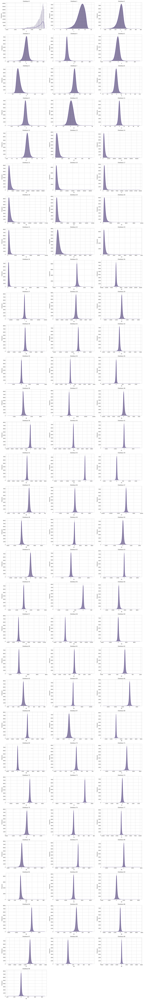

Boxplot untuk Deteksi Outlier:


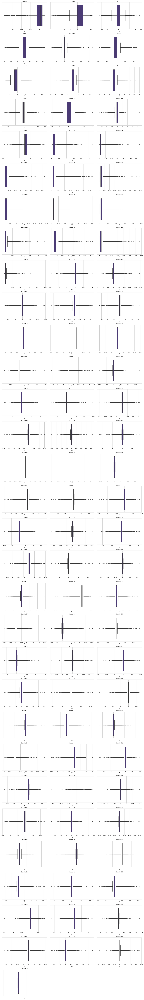

Matriks Korelasi:


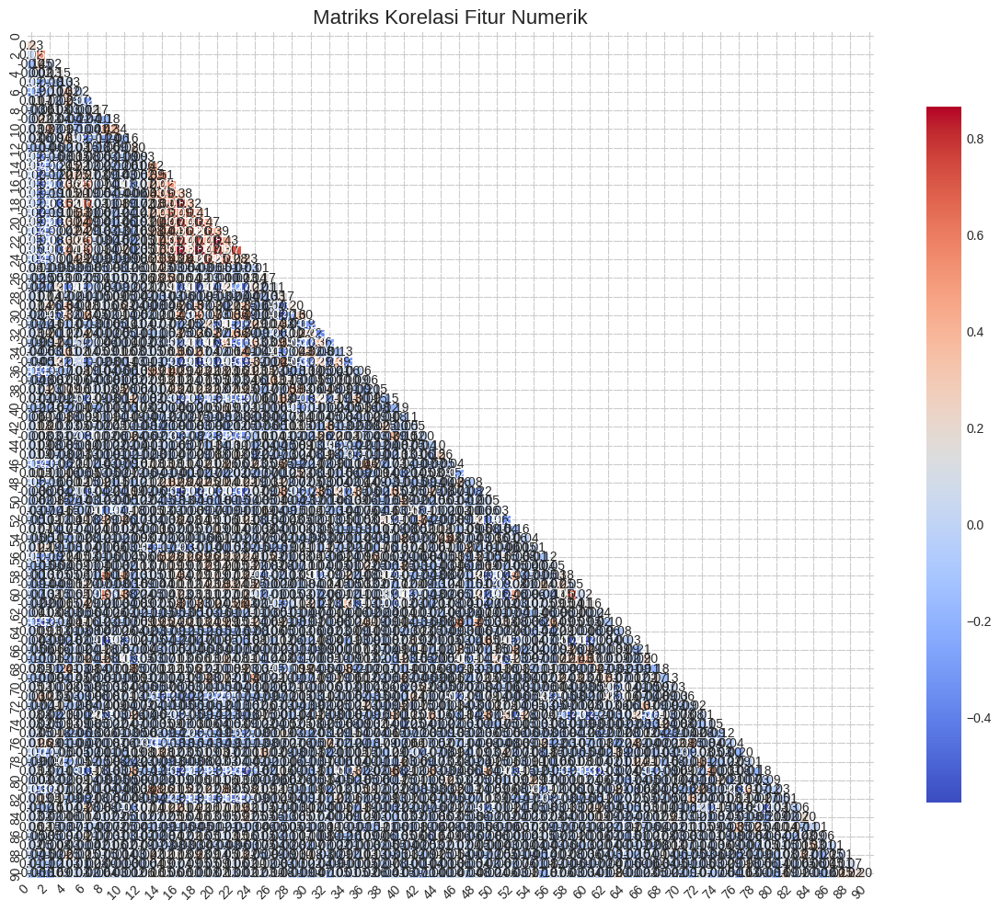

In [ ]:
# Fungsi untuk visualisasi distribusi semua fitur numerik
def plot_distributions(df, num_cols=None):
    """Visualisasi distribusi fitur numerik"""
    if num_cols is None:
        num_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()

    n_cols = 3
    n_rows = (len(num_cols) + n_cols - 1) // n_cols
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, n_rows * 4))
    axes = axes.flatten()

    for i, col in enumerate(num_cols):
        sns.histplot(df[col], kde=True, ax=axes[i])
        axes[i].set_title(f'Distribusi {col}')
        axes[i].set_xlabel(col)
        axes[i].set_ylabel('Frekuensi')

    # Menghapus subplot yang tidak digunakan
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

# Fungsi untuk visualisasi boxplot untuk mendeteksi outlier
def plot_boxplots(df, num_cols=None):
    """Visualisasi boxplot untuk deteksi outlier"""
    if num_cols is None:
        num_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()

    n_cols = 3
    n_rows = (len(num_cols) + n_cols - 1) // n_cols
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, n_rows * 4))
    axes = axes.flatten()

    for i, col in enumerate(num_cols):
        sns.boxplot(x=df[col], ax=axes[i])
        axes[i].set_title(f'Boxplot {col}')
        axes[i].set_xlabel(col)

    # Menghapus subplot yang tidak digunakan
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

# Fungsi untuk visualisasi matriks korelasi
def plot_correlation_matrix(df, num_cols=None):
    """Visualisasi matriks korelasi"""
    if num_cols is None:
        num_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()

    corr_matrix = df[num_cols].corr()
    plt.figure(figsize=(12, 10))
    mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
    sns.heatmap(corr_matrix, mask=mask, annot=True, fmt=".2f", cmap='coolwarm', square=True,
                linewidths=0.5, cbar_kws={"shrink": 0.8})
    plt.title('Matriks Korelasi Fitur Numerik', fontsize=16)
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

# Variabel target (pastikan ini diubah sesuai dengan dataset Anda)
# Untuk dataset contoh California Housing, targetnya adalah 'target'
target_column = 'target' if 'target' in df.columns else None

if target_column is None:
    # Untuk dataset tanpa header, gunakan kolom terakhir sebagai target
    target_column = df.columns[0]
    print(f"Menggunakan kolom terakhir (indeks {target_column}) sebagai target. Jika salah, tentukan manual.")

# Visualisasi distribusi
print("Distribusi Fitur Numerik:")
num_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
plot_distributions(df, num_cols)

# Visualisasi boxplot untuk deteksi outlier
print("Boxplot untuk Deteksi Outlier:")
plot_boxplots(df, num_cols)

# Visualisasi matriks korelasi
print("Matriks Korelasi:")
plot_correlation_matrix(df, num_cols)

# Visualisasi pairplot jika jumlah fitur tidak terlalu banyak
if len(num_cols) <= 10:
    print("Pairplot Fitur Numerik:")
    if target_column is not None and target_column in df.columns:
        plt.figure(figsize=(15, 12))
        sns.pairplot(df[num_cols], height=2.5, corner=True, diag_kind='kde')
        plt.tight_layout()
        plt.show()

### 1.3 Menangani Missing Values

Data dunia nyata sering memiliki nilai yang hilang (missing values). Ada beberapa strategi untuk menangani missing values:
1. **Penghapusan (Deletion)**: Menghapus baris atau kolom dengan missing values
2. **Imputasi Statistik**: Mengisi missing values dengan nilai statistik seperti mean, median, atau mode
3. **Imputasi Berbasis Model**: Menggunakan model untuk memprediksi missing values
4. **Imputasi KNN**: Menggunakan nilai dari K-tetangga terdekat

Pendekatan yang dipilih tergantung pada jenis data, jumlah missing values, dan pentingnya fitur dengan missing values tersebut.

In [ ]:
# Fungsi untuk menangani missing values
def handle_missing_values(df, strategy='auto', threshold=0.3):
    """Menangani missing values dengan berbagai strategi

    Parameters:
    df (DataFrame): DataFrame yang akan diproses
    strategy (str): Strategi untuk menangani missing values
                    'auto': Otomatis memilih strategi berdasarkan jumlah missing values
                    'drop_rows': Menghapus baris dengan missing values
                    'drop_columns': Menghapus kolom dengan missing values melebihi threshold
                    'impute_mean': Mengisi missing values dengan mean
                    'impute_median': Mengisi missing values dengan median
                    'impute_mode': Mengisi missing values dengan mode
                    'impute_knn': Mengisi missing values dengan KNN
    threshold (float): Ambang batas untuk menghapus kolom (proporsi missing values)

    Returns:
    DataFrame: DataFrame yang telah diproses
    """
    df_copy = df.copy()

    # Hitung proporsi missing values untuk setiap kolom
    missing_prop = df_copy.isnull().mean()
    cols_with_missing = missing_prop[missing_prop > 0].index.tolist()

    # Jika tidak ada missing values, kembalikan DataFrame asli
    if len(cols_with_missing) == 0:
        print("Tidak ada missing values yang perlu ditangani.")
        return df_copy

    # Pisahkan kolom numerik dan kategorikal yang memiliki missing values
    num_cols_missing = [col for col in cols_with_missing if col in df_copy.select_dtypes(include=['int64', 'float64']).columns]
    cat_cols_missing = [col for col in cols_with_missing if col in df_copy.select_dtypes(include=['object', 'category']).columns]

    if strategy == 'auto':
        # Jika missing values sedikit, hapus baris
        if all(missing_prop < 0.05):
            strategy = 'drop_rows'
        # Jika ada kolom dengan banyak missing values, hapus kolom tersebut
        elif any(missing_prop > threshold):
            strategy = 'drop_columns'
        # Jika missing values sedang, gunakan imputasi statistik
        else:
            strategy = 'impute_median' if num_cols_missing else 'impute_mode'

    print(f"Strategi penanganan missing values: {strategy}")

    if strategy == 'drop_rows':
        # Hapus baris dengan missing values
        row_count_before = df_copy.shape[0]
        df_copy = df_copy.dropna()
        row_count_after = df_copy.shape[0]
        print(f"Menghapus {row_count_before - row_count_after} baris dengan missing values.")

    elif strategy == 'drop_columns':
        # Hapus kolom dengan missing values melebihi threshold
        cols_to_drop = missing_prop[missing_prop > threshold].index.tolist()
        if cols_to_drop:
            df_copy = df_copy.drop(columns=cols_to_drop)
            print(f"Menghapus {len(cols_to_drop)} kolom dengan missing values melebihi {threshold*100}%: {cols_to_drop}")

        # Untuk kolom yang tersisa, gunakan imputasi yang sesuai
        remaining_num_cols = [col for col in num_cols_missing if col not in cols_to_drop]
        remaining_cat_cols = [col for col in cat_cols_missing if col not in cols_to_drop]

        # Imputasi untuk kolom numerik
        if remaining_num_cols:
            df_copy[remaining_num_cols] = df_copy[remaining_num_cols].fillna(df_copy[remaining_num_cols].median())
            print(f"Mengisi missing values untuk {len(remaining_num_cols)} kolom numerik dengan median.")

        # Imputasi untuk kolom kategorikal
        if remaining_cat_cols:
            for col in remaining_cat_cols:
                df_copy[col] = df_copy[col].fillna(df_copy[col].mode()[0])
            print(f"Mengisi missing values untuk {len(remaining_cat_cols)} kolom kategorikal dengan mode.")

    elif strategy == 'impute_mean':
        # Impute nilai numerik dengan mean
        if num_cols_missing:
            df_copy[num_cols_missing] = df_copy[num_cols_missing].fillna(df_copy[num_cols_missing].mean())
            print(f"Mengisi missing values untuk {len(num_cols_missing)} kolom numerik dengan mean.")

        # Impute nilai kategorikal dengan mode
        if cat_cols_missing:
            for col in cat_cols_missing:
                df_copy[col] = df_copy[col].fillna(df_copy[col].mode()[0])
            print(f"Mengisi missing values untuk {len(cat_cols_missing)} kolom kategorikal dengan mode.")

    elif strategy == 'impute_median':
        # Impute nilai numerik dengan median
        if num_cols_missing:
            df_copy[num_cols_missing] = df_copy[num_cols_missing].fillna(df_copy[num_cols_missing].median())
            print(f"Mengisi missing values untuk {len(num_cols_missing)} kolom numerik dengan median.")

        # Impute nilai kategorikal dengan mode
        if cat_cols_missing:
            for col in cat_cols_missing:
                df_copy[col] = df_copy[col].fillna(df_copy[col].mode()[0])
            print(f"Mengisi missing values untuk {len(cat_cols_missing)} kolom kategorikal dengan mode.")

    elif strategy == 'impute_mode':
        # Impute semua kolom dengan mode
        for col in cols_with_missing:
            df_copy[col] = df_copy[col].fillna(df_copy[col].mode()[0])
        print(f"Mengisi missing values untuk {len(cols_with_missing)} kolom dengan mode.")

    elif strategy == 'impute_knn':
        # Impute nilai numerik dengan KNN
        if num_cols_missing:
            # Memilih kolom numerik tanpa missing values untuk imputasi
            num_cols_no_missing = [col for col in df_copy.select_dtypes(include=['int64', 'float64']).columns
                                 if col not in num_cols_missing]

            if num_cols_no_missing:
                imputer = KNNImputer(n_neighbors=5)
                # Gabungkan kolom numerik yang akan diimputasi dengan kolom numerik tanpa missing values
                cols_for_imputation = num_cols_missing + num_cols_no_missing
                df_copy[cols_for_imputation] = pd.DataFrame(
                    imputer.fit_transform(df_copy[cols_for_imputation]),
                    columns=cols_for_imputation,
                    index=df_copy.index
                )
                print(f"Mengisi missing values untuk {len(num_cols_missing)} kolom numerik dengan KNN.")
            else:
                # Jika tidak ada kolom numerik tanpa missing values, gunakan median
                df_copy[num_cols_missing] = df_copy[num_cols_missing].fillna(df_copy[num_cols_missing].median())
                print(f"Mengisi missing values untuk {len(num_cols_missing)} kolom numerik dengan median (karena tidak cukup fitur untuk KNN).")

        # Impute nilai kategorikal dengan mode
        if cat_cols_missing:
            for col in cat_cols_missing:
                df_copy[col] = df_copy[col].fillna(df_copy[col].mode()[0])
            print(f"Mengisi missing values untuk {len(cat_cols_missing)} kolom kategorikal dengan mode.")

    # Verifikasi bahwa tidak ada lagi missing values
    if df_copy.isnull().sum().sum() > 0:
        print("WARNING: Masih terdapat missing values setelah imputasi. Periksa kembali strategi yang digunakan.")
    else:
        print("Semua missing values telah ditangani.")

    return df_copy

# Tangani missing values
df_cleaned = handle_missing_values(df, strategy='auto', threshold=0.3)
print(f"Dimensi data setelah penanganan missing values: {df_cleaned.shape}")

Tidak ada missing values yang perlu ditangani.
Dimensi data setelah penanganan missing values: (515345, 91)


### 1.4 Menangani Outlier

Outlier adalah nilai yang sangat berbeda dari data lainnya dan dapat memengaruhi model. Ada beberapa metode untuk mendeteksi dan menangani outlier:
1. **Z-Score**: Mengidentifikasi nilai yang jauh dari mean (biasanya |z| > 3)
2. **IQR (Interquartile Range)**: Mengidentifikasi nilai di luar Q1 - 1.5\*IQR dan Q3 + 1.5\*IQR
3. **Pendekatan berbasis model**: Menggunakan algoritma seperti Isolation Forest

Setelah outlier teridentifikasi, kita dapat menanganinya dengan cara:
1. Mempertahankan (jika outlier mewakili data penting)
2. Menghapus
3. Membatasi (capping) dengan nilai threshold tertentu
4. Transformasi (mis. log transform)

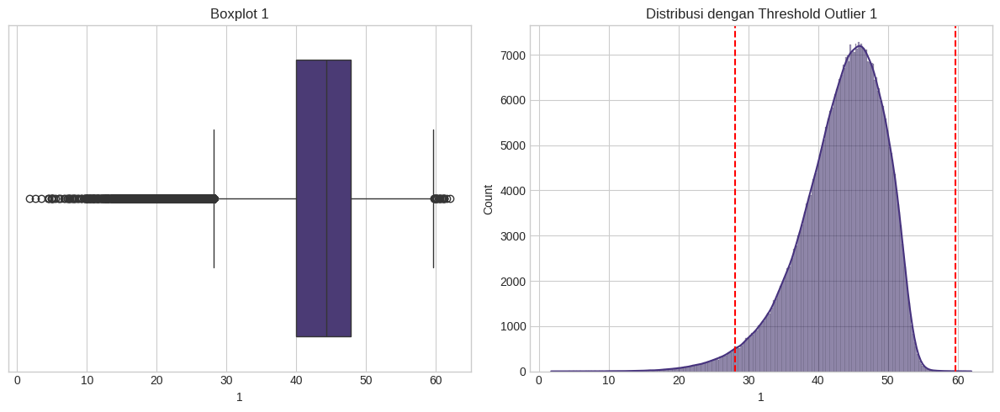

Kolom '1': 10627 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (2.06%)
  Threshold: < 28.136 atau > 59.653



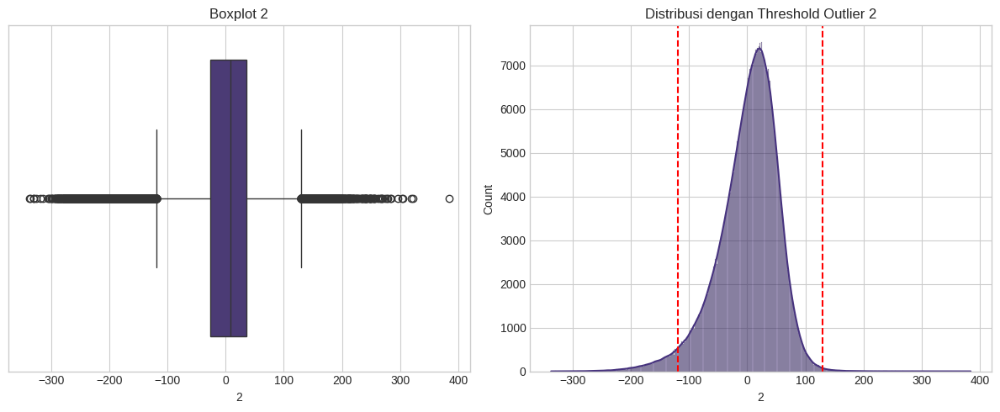

Kolom '2': 14647 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (2.84%)
  Threshold: < -119.335 atau > 129.399



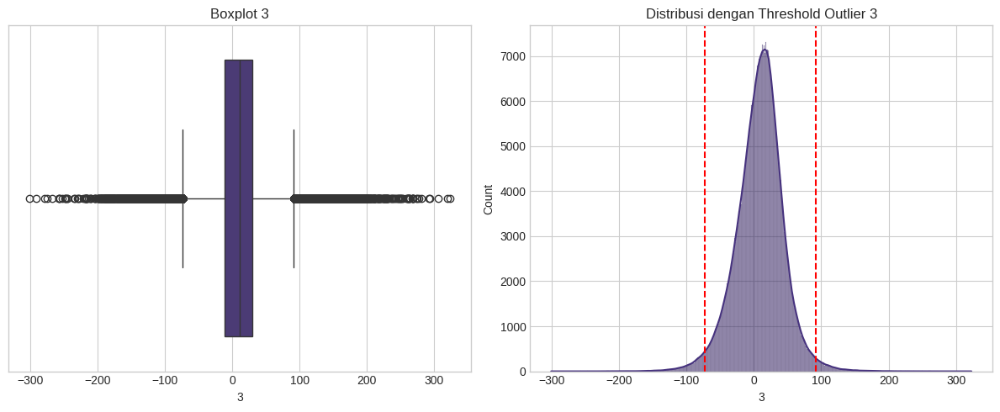

Kolom '3': 15629 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (3.03%)
  Threshold: < -73.304 atau > 91.606



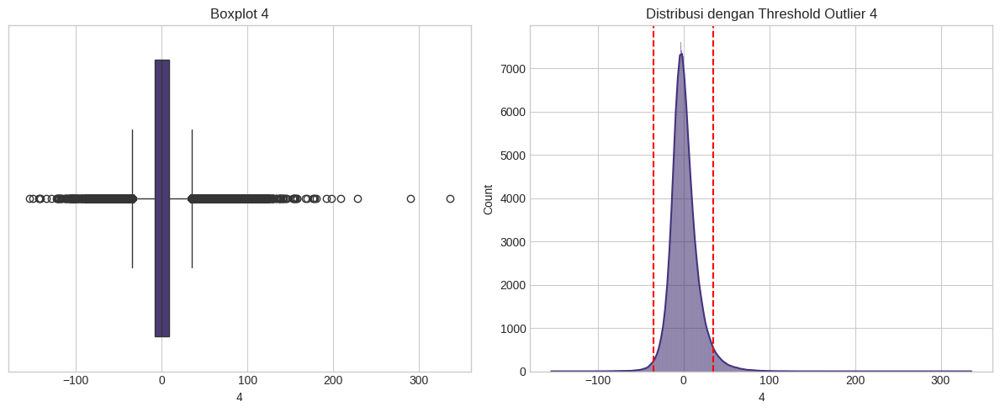

Kolom '4': 22688 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (4.40%)
  Threshold: < -34.400 atau > 34.700



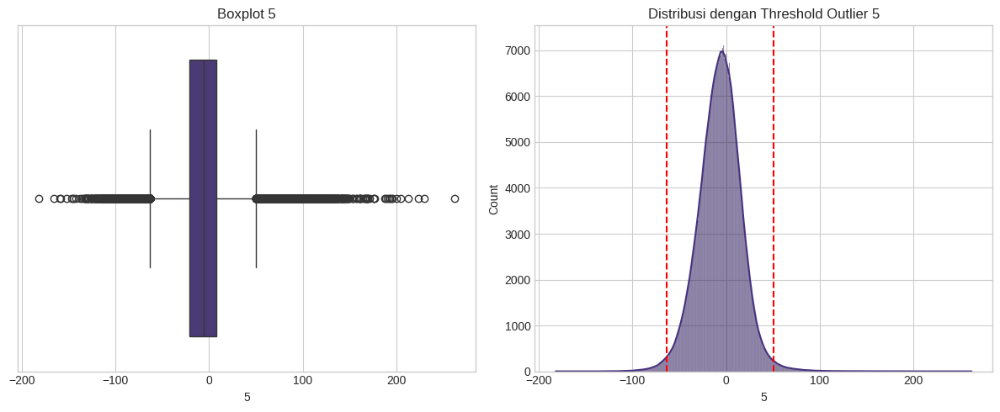

Kolom '5': 10454 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (2.03%)
  Threshold: < -63.279 atau > 50.354



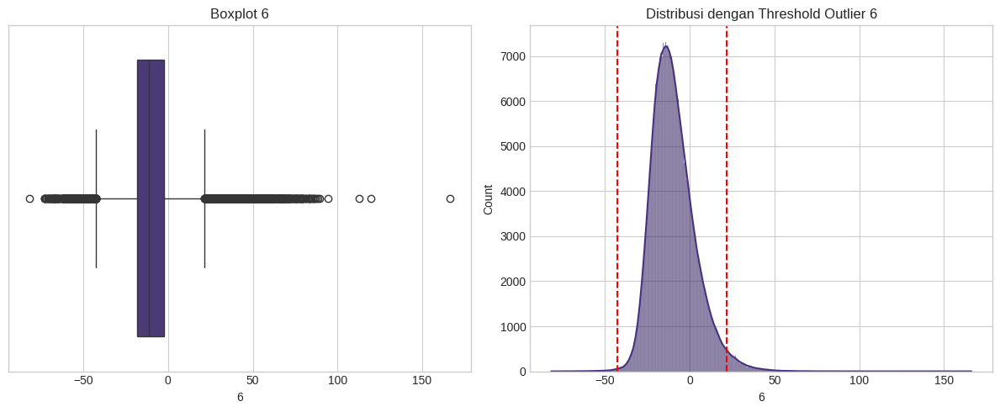

Kolom '6': 11994 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (2.33%)
  Threshold: < -42.519 atau > 21.689



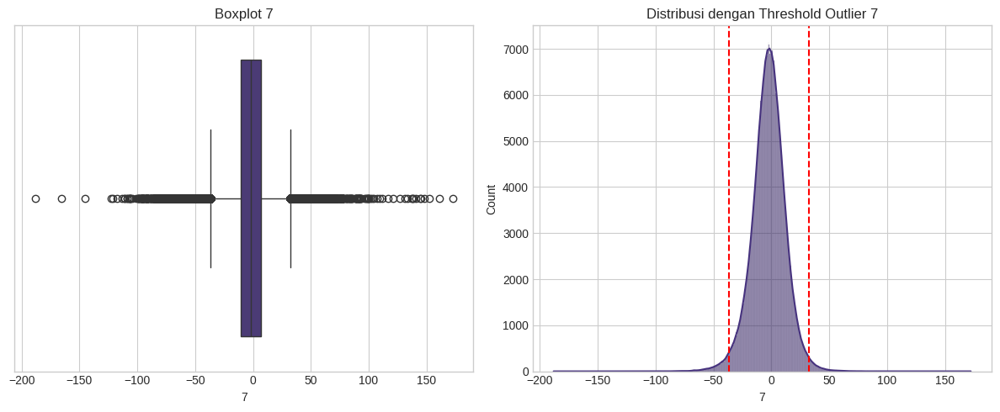

Kolom '7': 13903 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (2.70%)
  Threshold: < -36.714 atau > 32.442



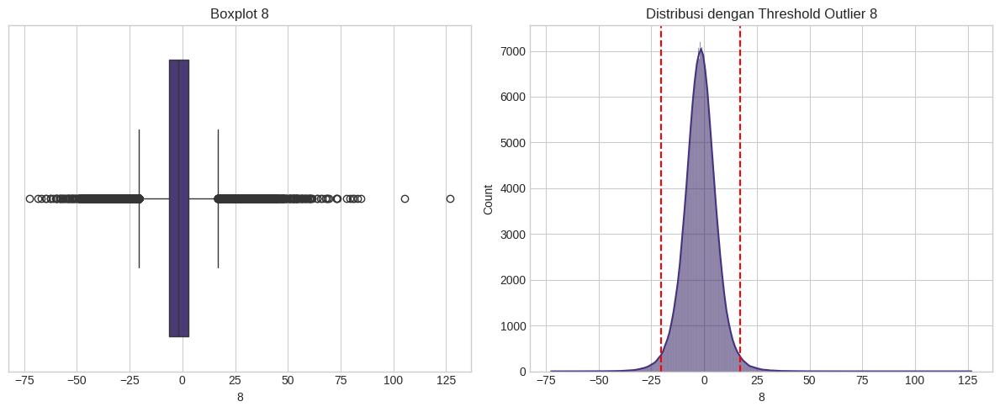

Kolom '8': 14544 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (2.82%)
  Threshold: < -20.541 atau > 16.986



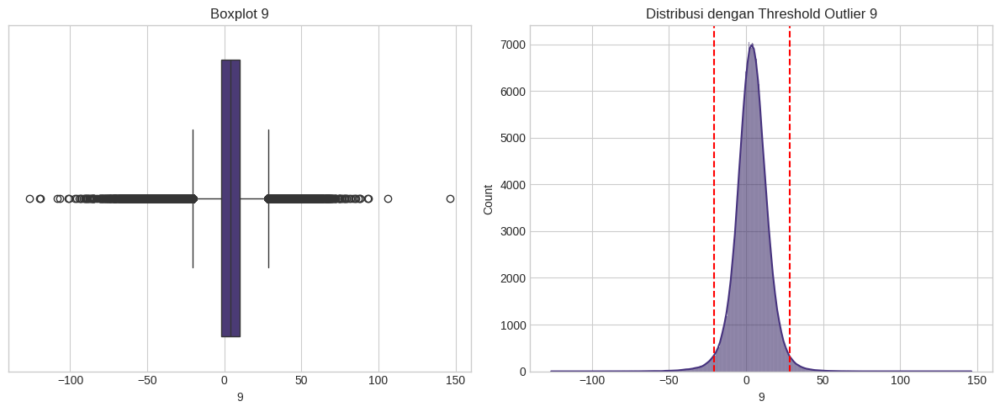

Kolom '9': 15398 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (2.99%)
  Threshold: < -20.677 atau > 28.345



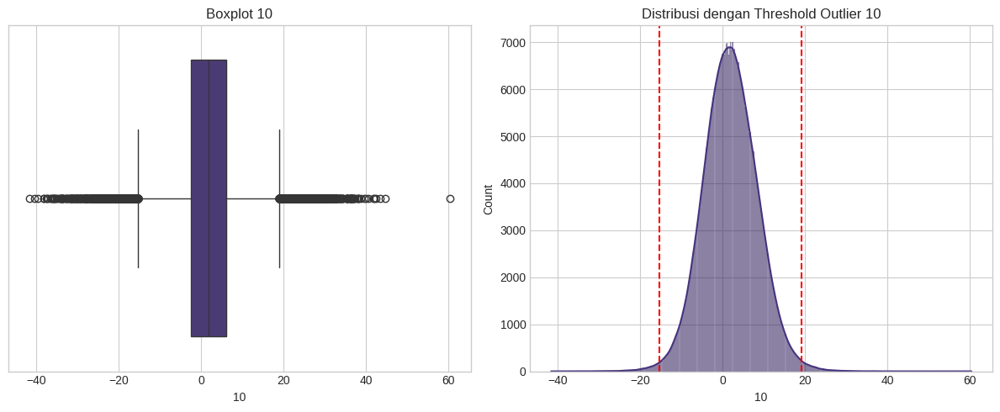

Kolom '10': 6238 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (1.21%)
  Threshold: < -15.333 atau > 19.035



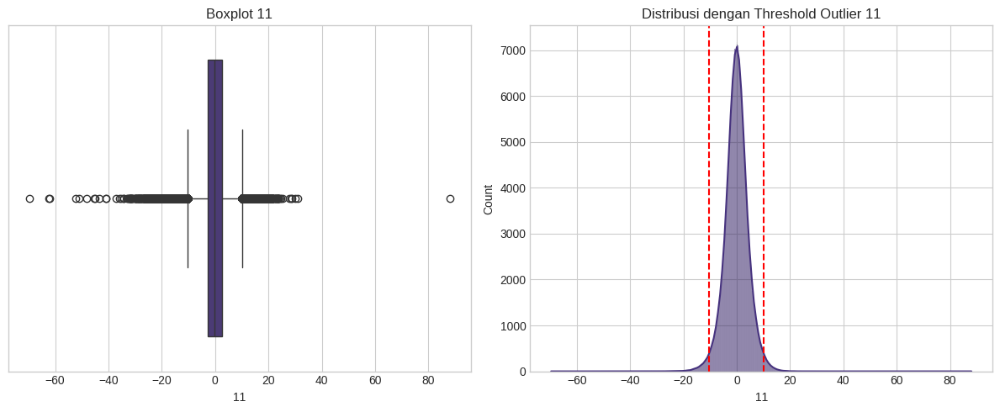

Kolom '11': 15801 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (3.07%)
  Threshold: < -10.284 atau > 10.067



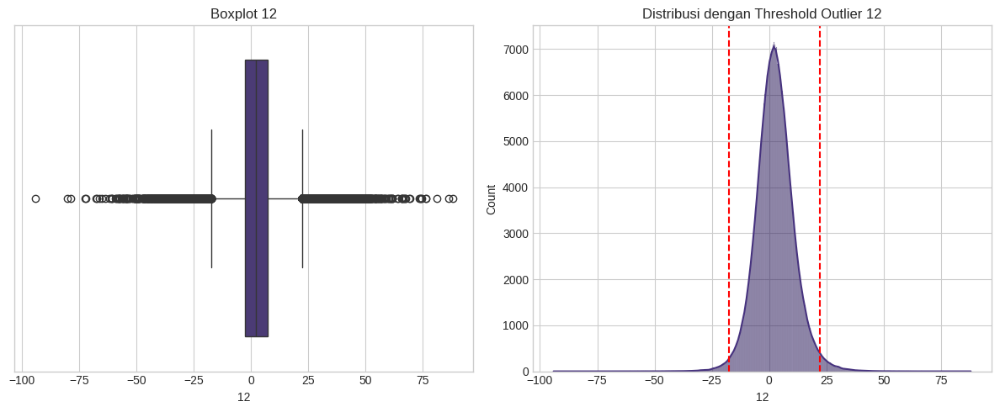

Kolom '12': 13604 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (2.64%)
  Threshold: < -17.416 atau > 22.226



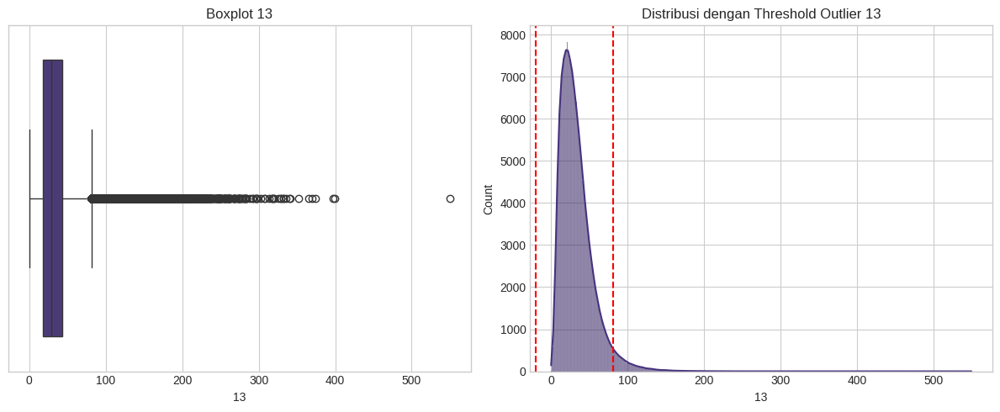

Kolom '13': 18676 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (3.62%)
  Threshold: < -19.535 atau > 81.203



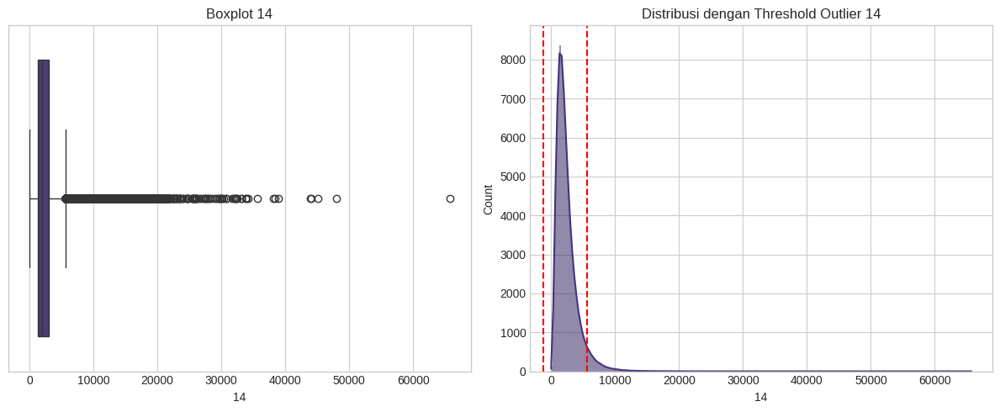

Kolom '14': 26229 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (5.09%)
  Threshold: < -1273.921 atau > 5631.524



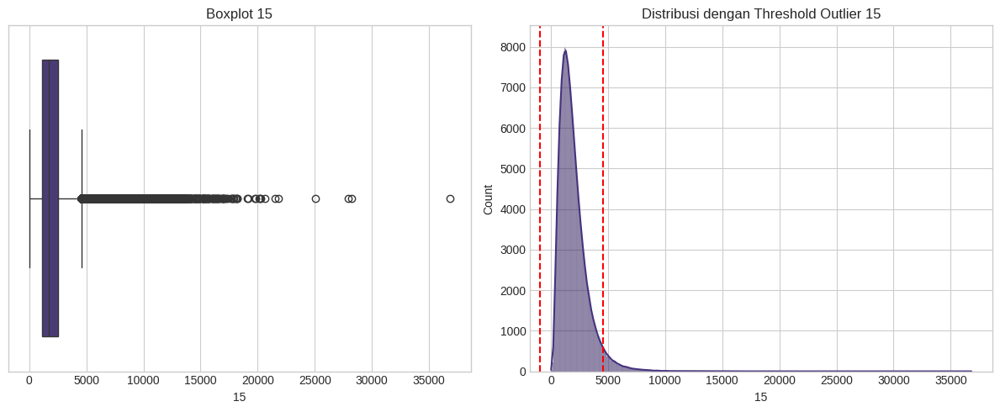

Kolom '15': 20571 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (3.99%)
  Threshold: < -950.166 atau > 4553.041



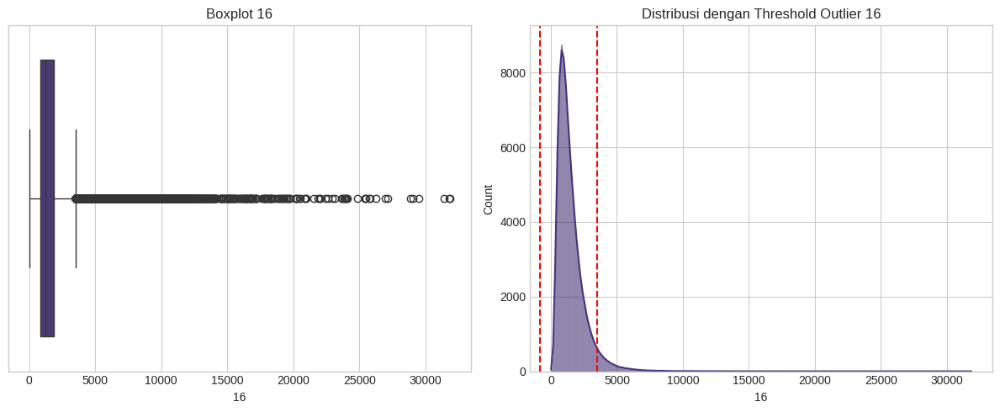

Kolom '16': 24678 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (4.79%)
  Threshold: < -800.756 atau > 3507.846



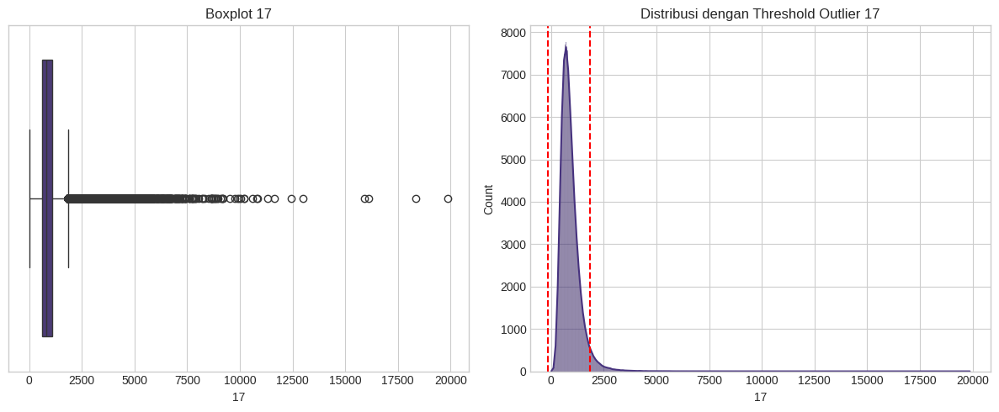

Kolom '17': 20037 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (3.89%)
  Threshold: < -134.931 atau > 1842.321



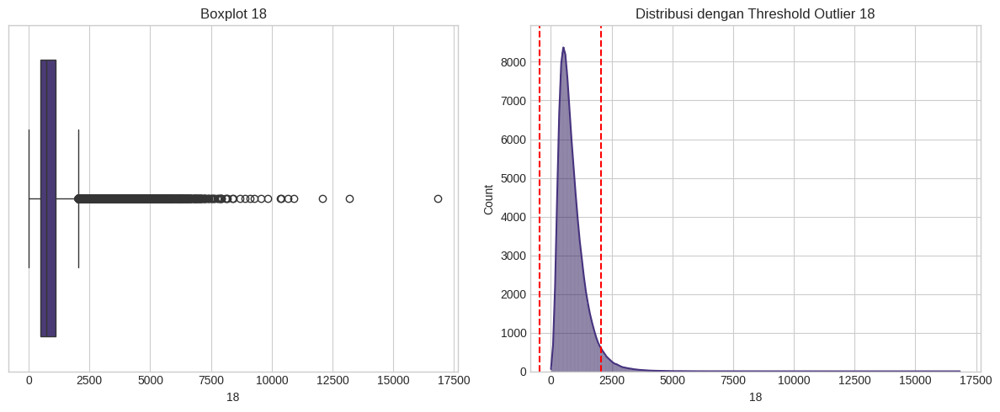

Kolom '18': 21412 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (4.15%)
  Threshold: < -451.728 atau > 2053.826



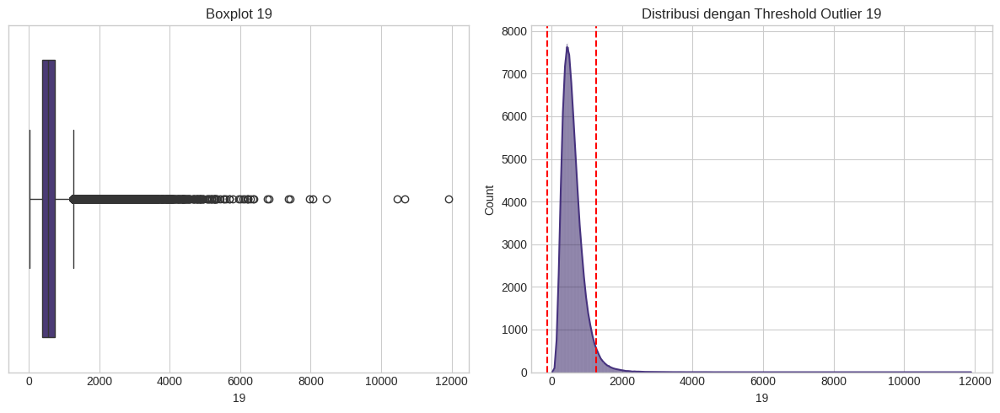

Kolom '19': 17750 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (3.44%)
  Threshold: < -130.174 atau > 1263.284



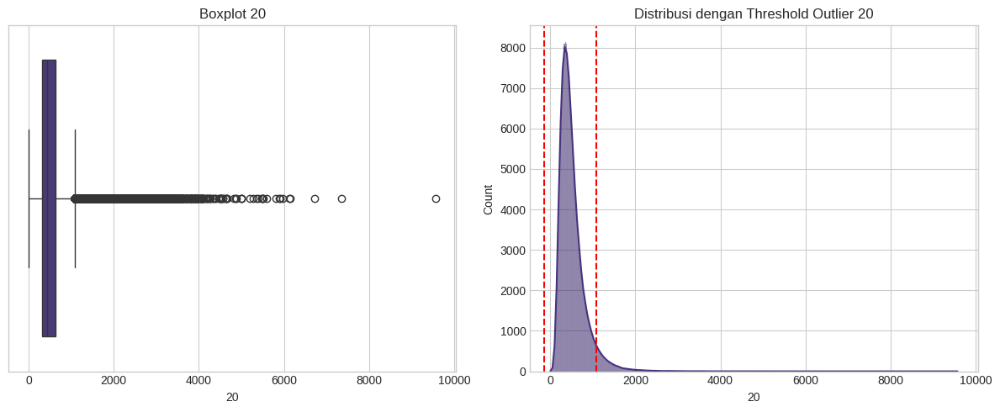

Kolom '20': 25463 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (4.94%)
  Threshold: < -143.912 atau > 1089.496



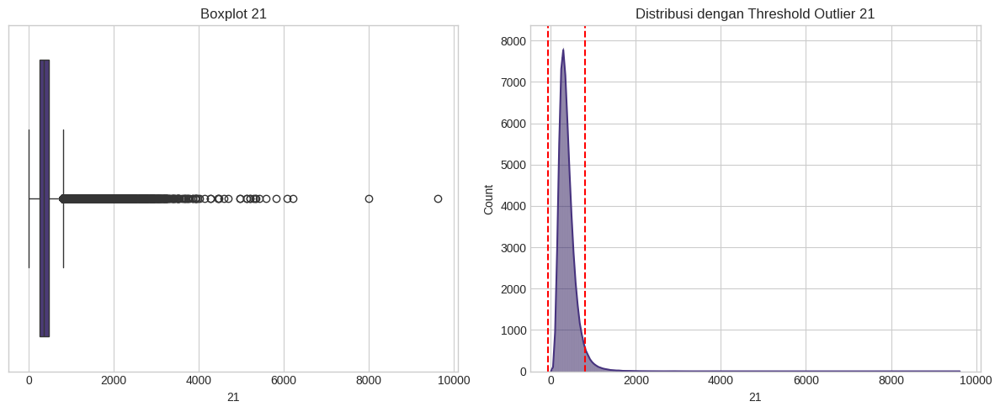

Kolom '21': 21147 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (4.10%)
  Threshold: < -70.258 atau > 803.875



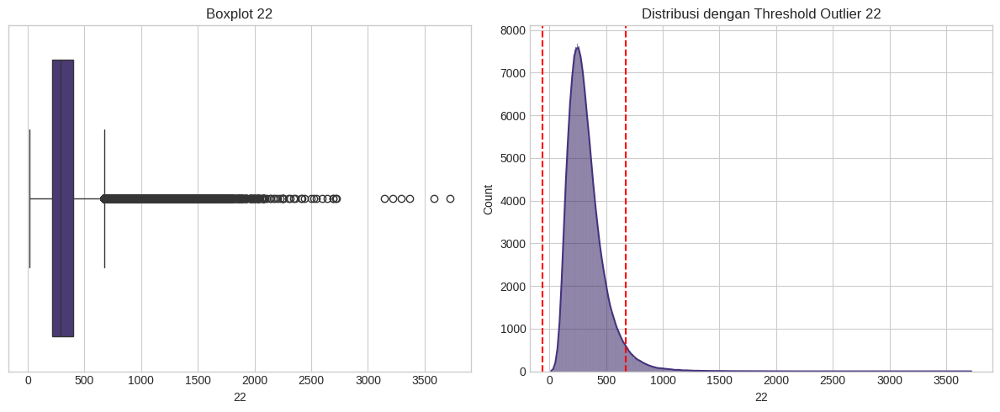

Kolom '22': 19197 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (3.73%)
  Threshold: < -61.196 atau > 672.704



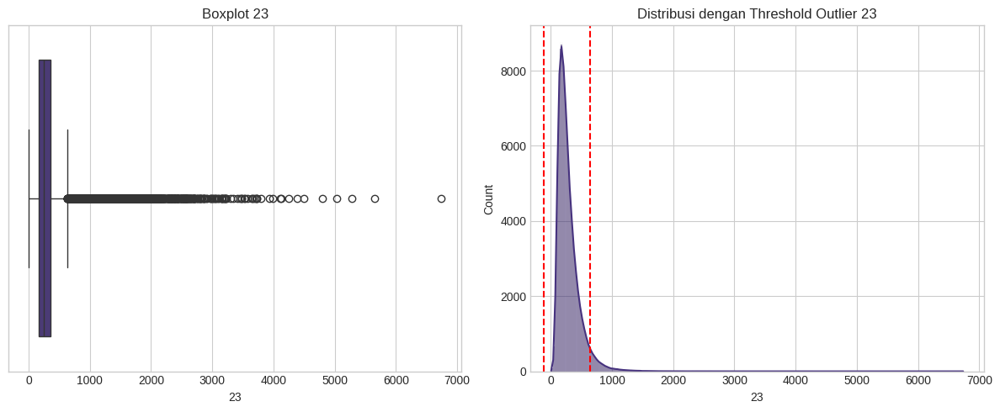

Kolom '23': 23812 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (4.62%)
  Threshold: < -115.011 atau > 638.901



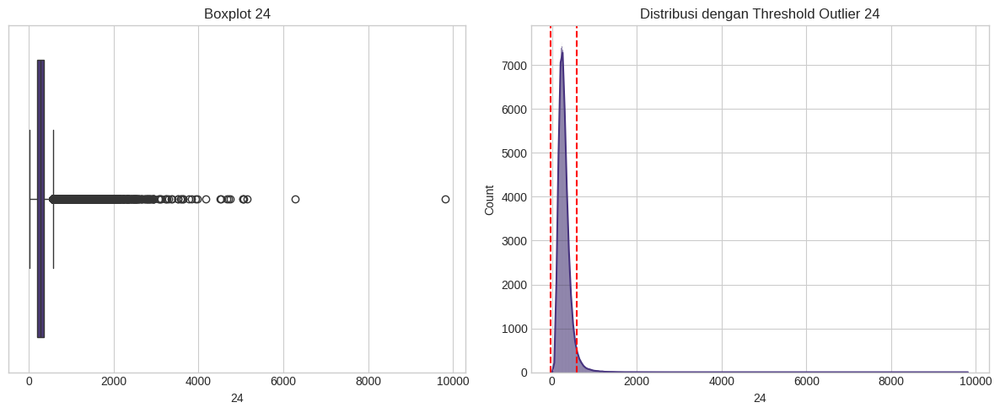

Kolom '24': 20380 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (3.95%)
  Threshold: < -30.429 atau > 577.412



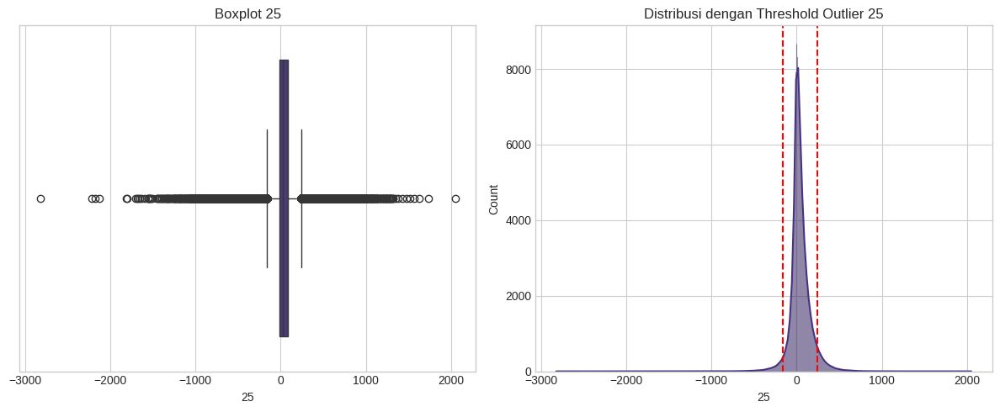

Kolom '25': 41997 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (8.15%)
  Threshold: < -162.269 atau > 239.386



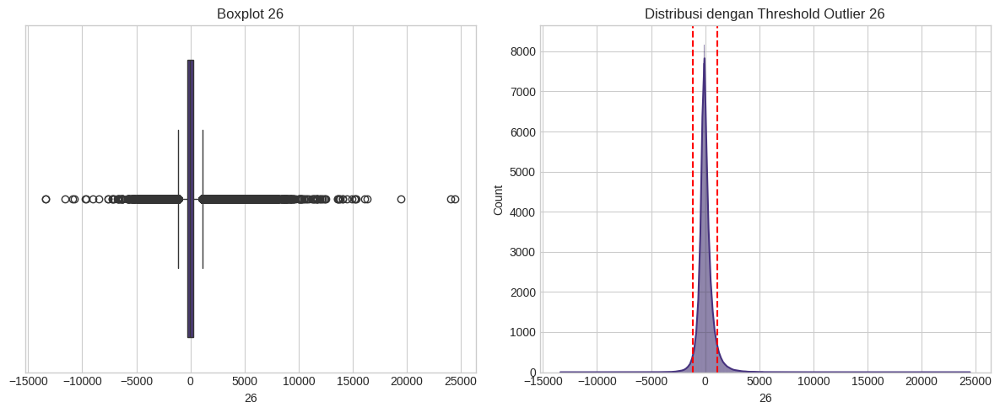

Kolom '26': 40195 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (7.80%)
  Threshold: < -1147.628 atau > 1143.151



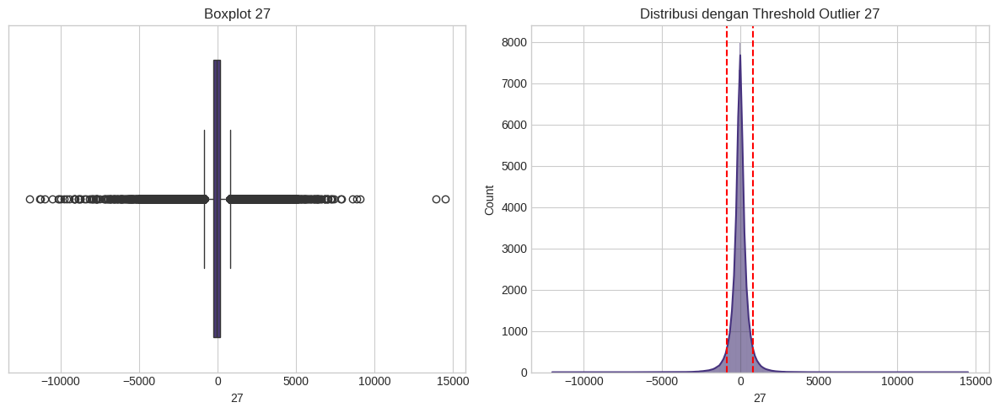

Kolom '27': 45593 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (8.85%)
  Threshold: < -878.105 atau > 794.823



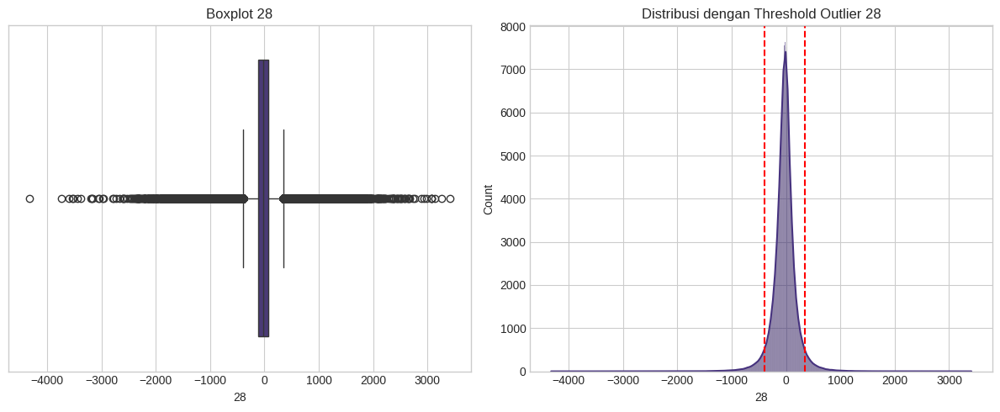

Kolom '28': 38307 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (7.43%)
  Threshold: < -395.130 atau > 342.401



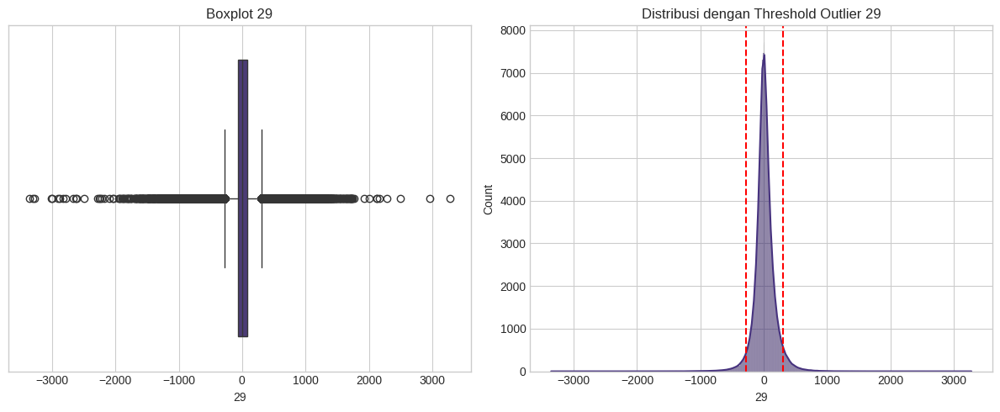

Kolom '29': 35703 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (6.93%)
  Threshold: < -277.164 atau > 301.465



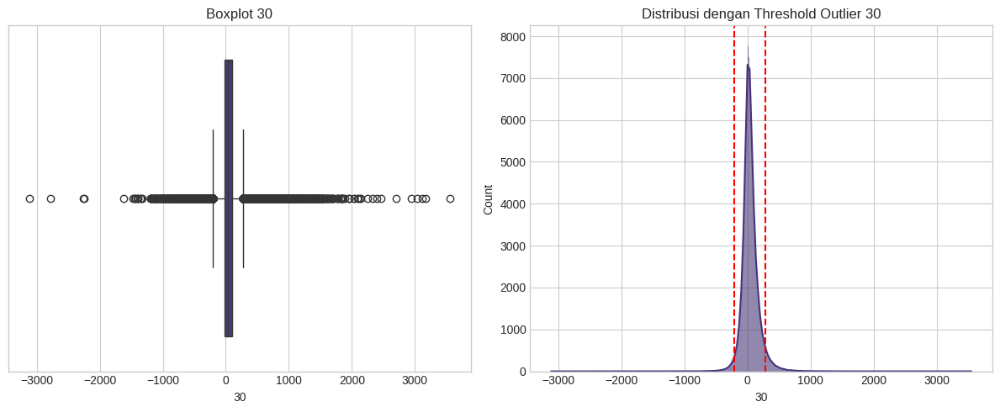

Kolom '30': 32371 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (6.28%)
  Threshold: < -207.258 atau > 280.257



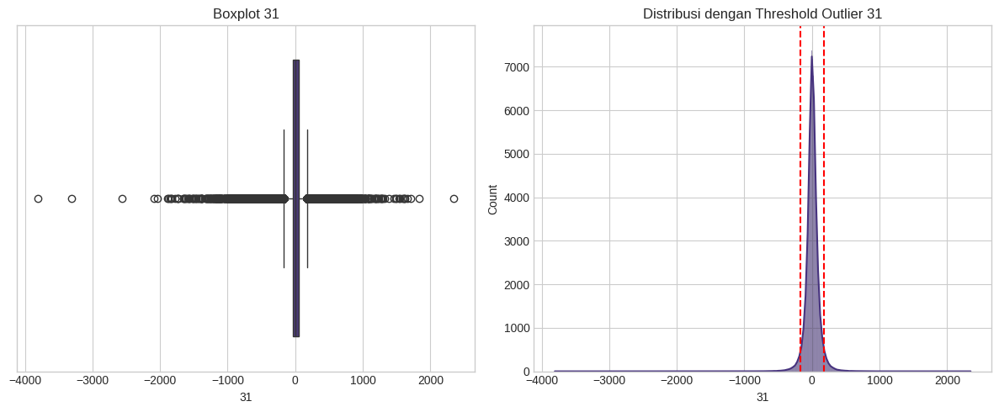

Kolom '31': 32665 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (6.34%)
  Threshold: < -169.541 atau > 179.655



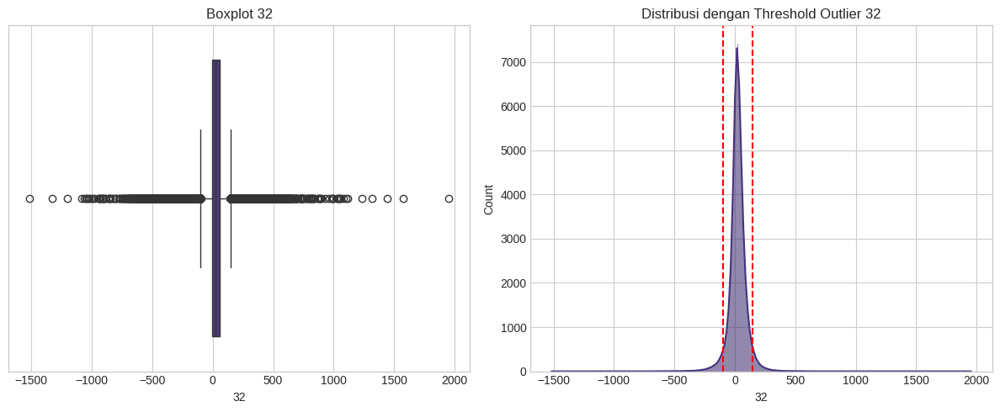

Kolom '32': 36307 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (7.05%)
  Threshold: < -99.598 atau > 148.756



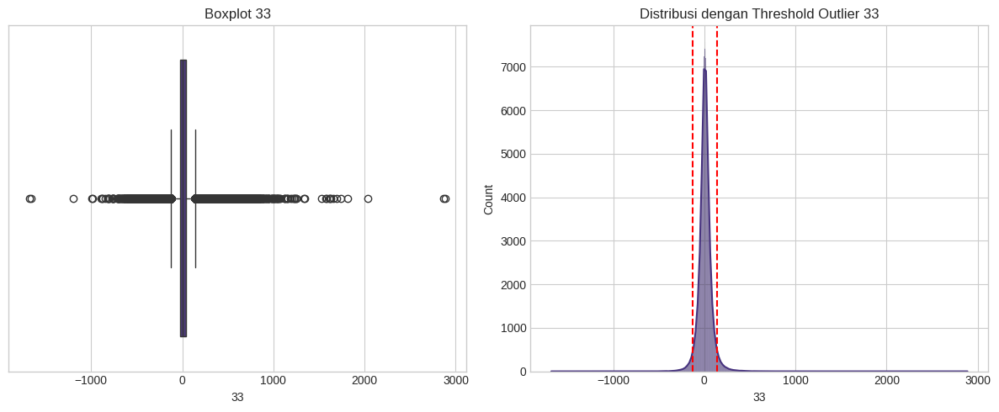

Kolom '33': 32755 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (6.36%)
  Threshold: < -123.414 atau > 139.621



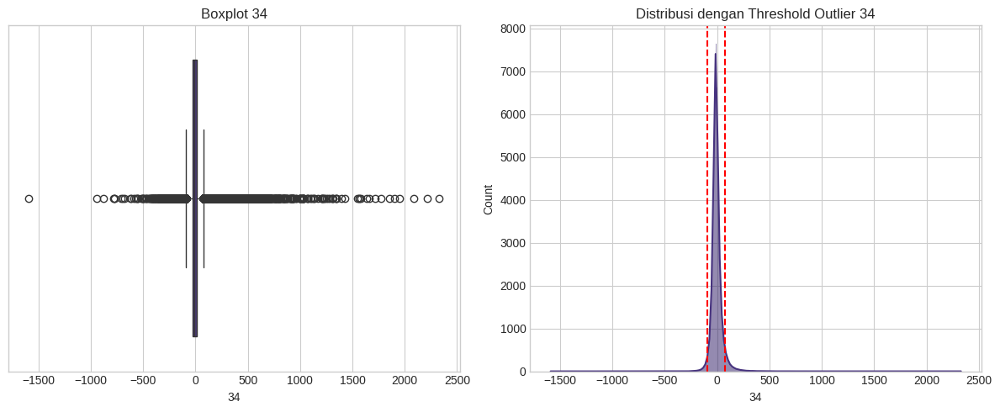

Kolom '34': 36874 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (7.16%)
  Threshold: < -90.138 atau > 73.758



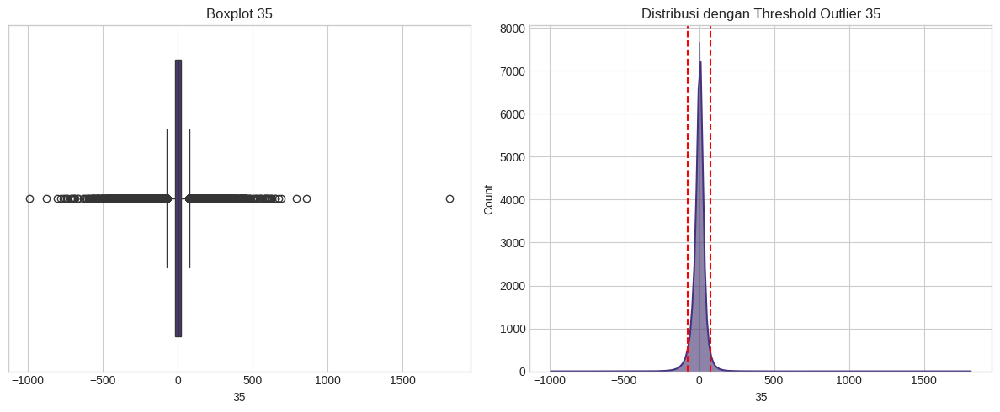

Kolom '35': 32979 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (6.40%)
  Threshold: < -73.678 atau > 77.490



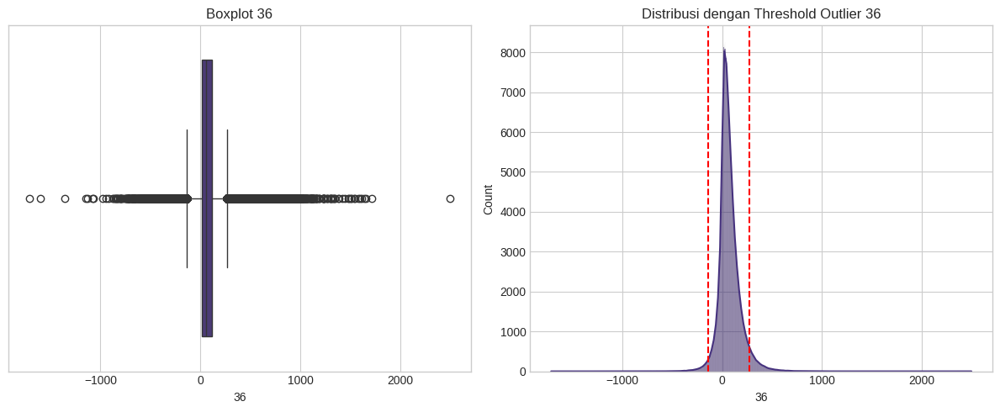

Kolom '36': 31192 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (6.05%)
  Threshold: < -139.066 atau > 270.390



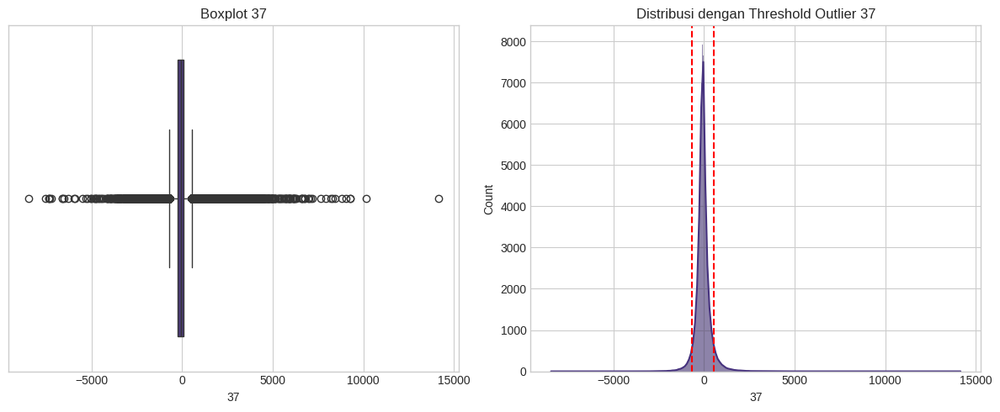

Kolom '37': 46192 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (8.96%)
  Threshold: < -688.054 atau > 549.977



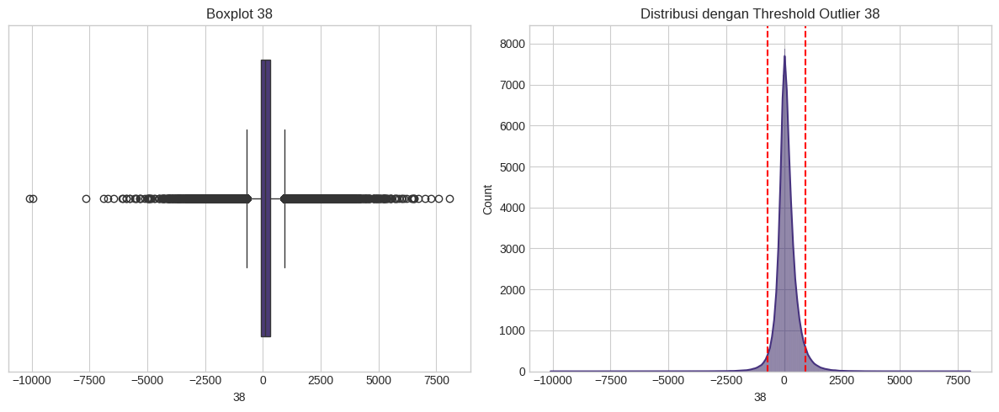

Kolom '38': 34211 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (6.64%)
  Threshold: < -709.761 atau > 917.382



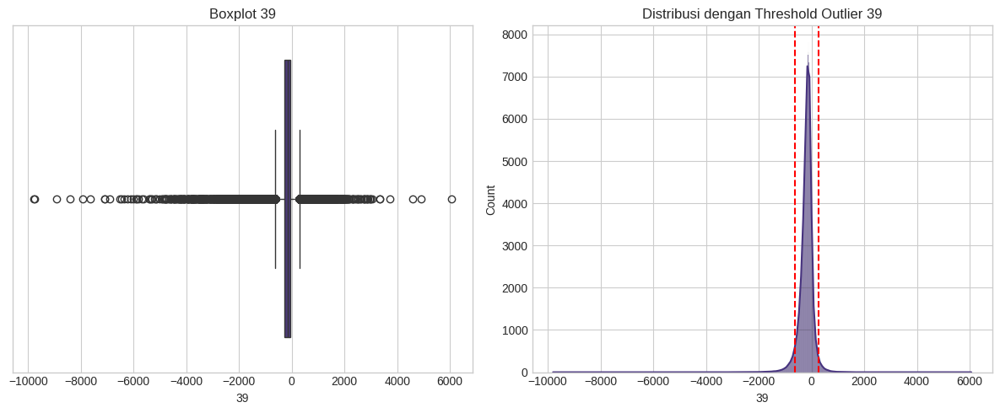

Kolom '39': 31276 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (6.07%)
  Threshold: < -633.891 atau > 283.908



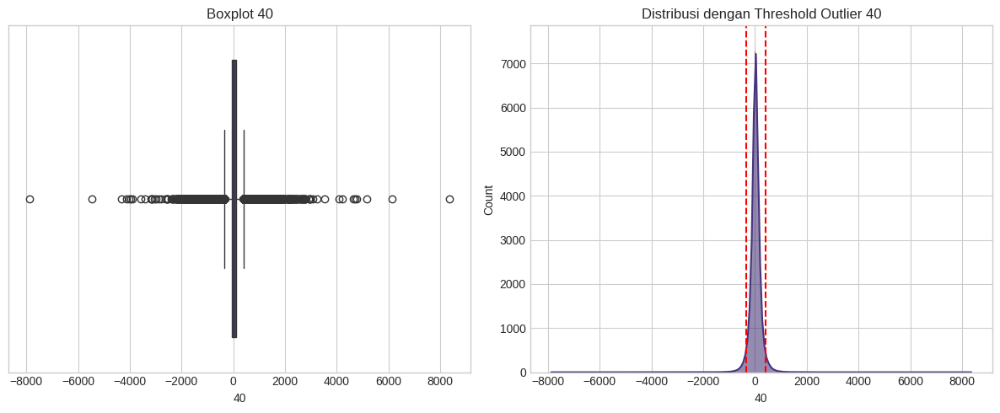

Kolom '40': 33041 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (6.41%)
  Threshold: < -346.837 atau > 392.268



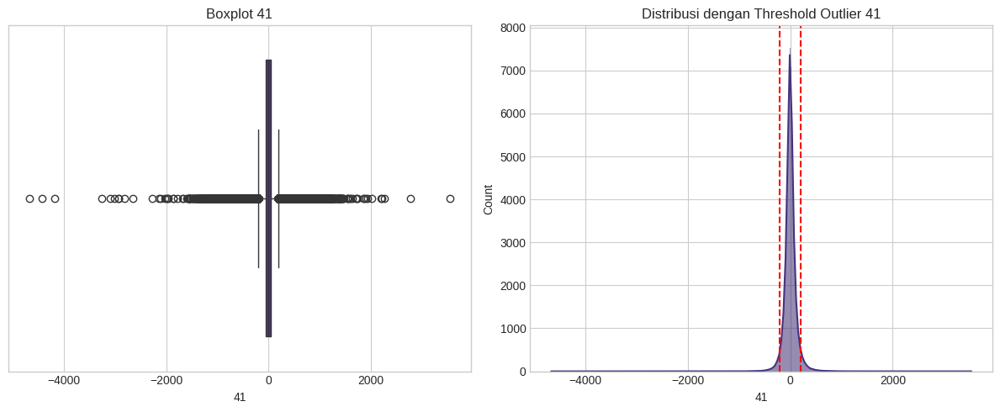

Kolom '41': 36646 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (7.11%)
  Threshold: < -204.032 atau > 197.319



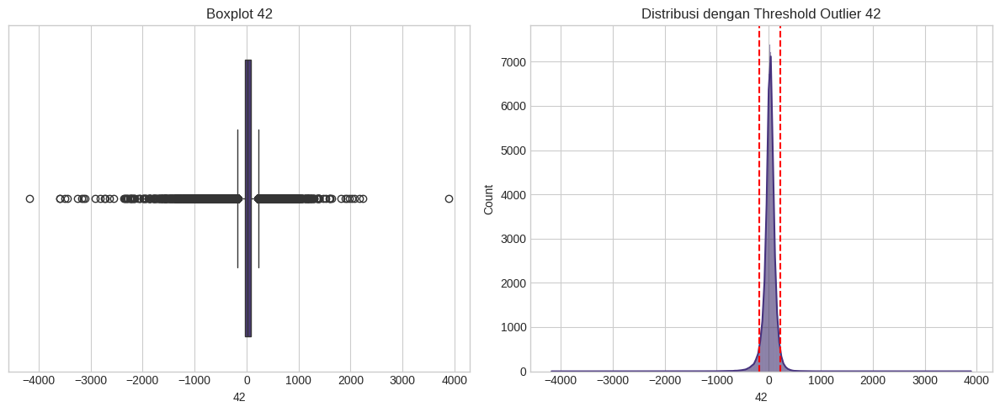

Kolom '42': 32249 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (6.26%)
  Threshold: < -181.650 atau > 230.162



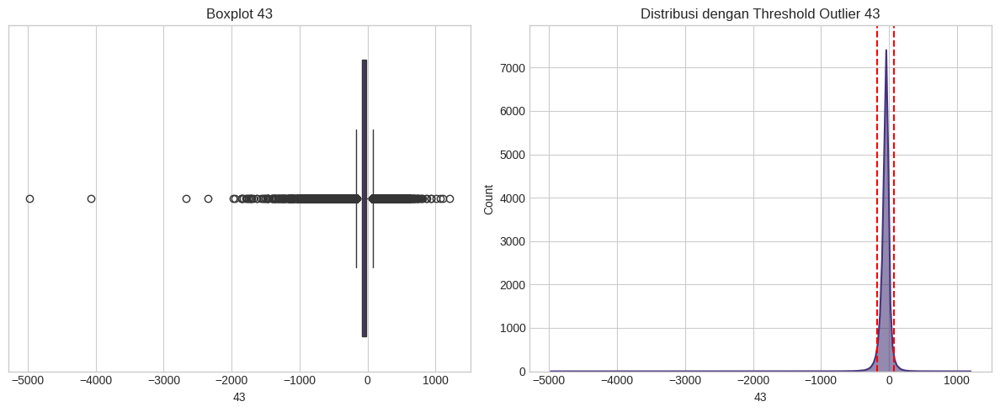

Kolom '43': 33150 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (6.43%)
  Threshold: < -170.915 atau > 73.764



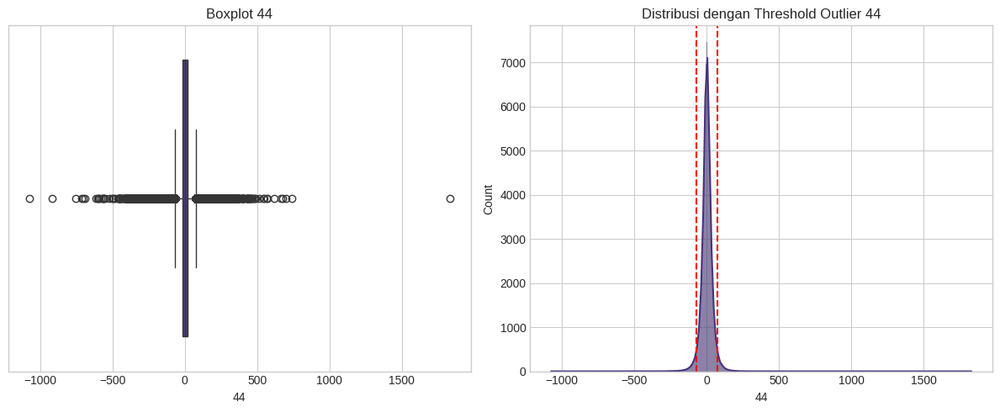

Kolom '44': 29314 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (5.69%)
  Threshold: < -68.936 atau > 76.011



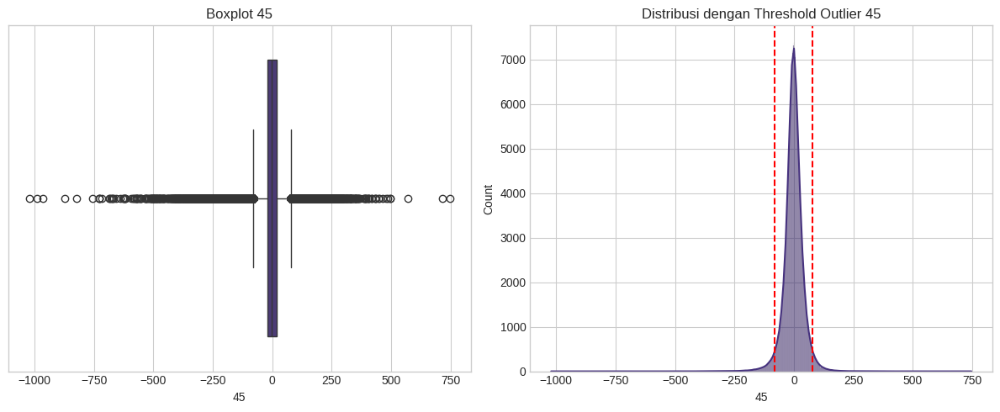

Kolom '45': 27241 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (5.29%)
  Threshold: < -80.692 atau > 79.214



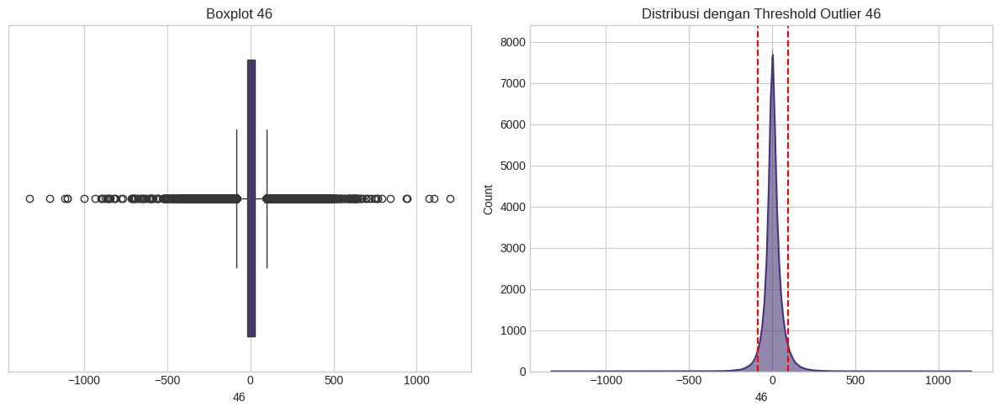

Kolom '46': 42450 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (8.24%)
  Threshold: < -85.315 atau > 96.013



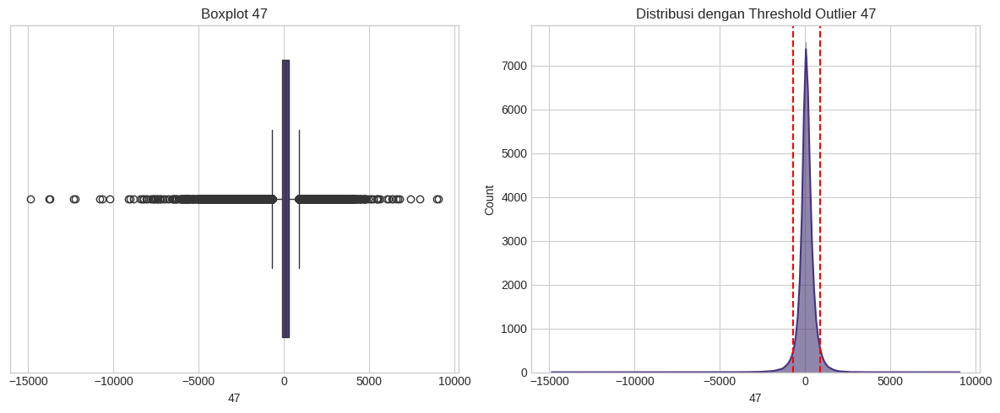

Kolom '47': 37142 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (7.21%)
  Threshold: < -707.855 atau > 876.641



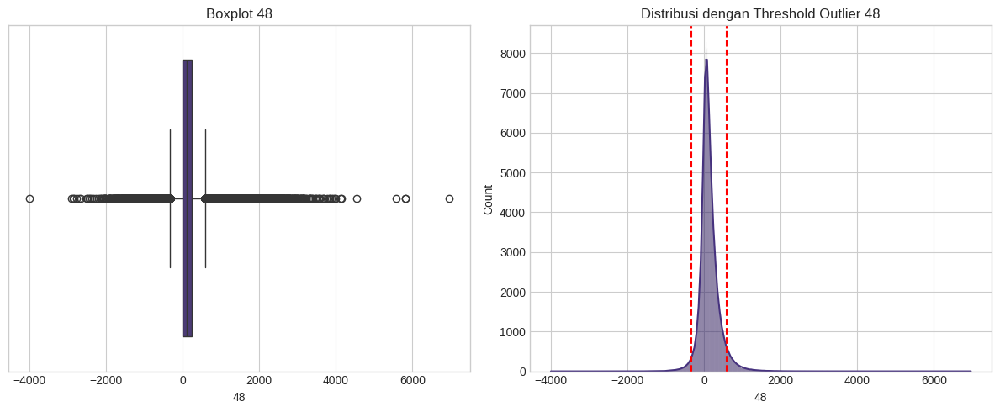

Kolom '48': 35544 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (6.90%)
  Threshold: < -335.475 atau > 587.190



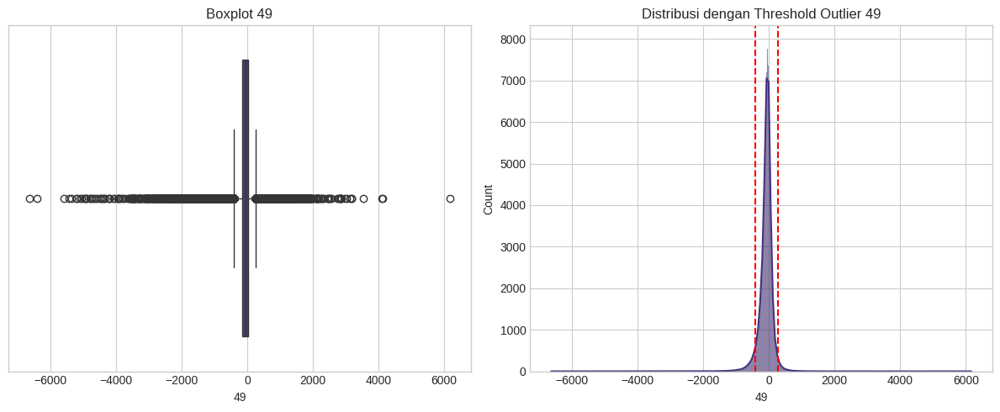

Kolom '49': 35981 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (6.98%)
  Threshold: < -412.241 atau > 266.836



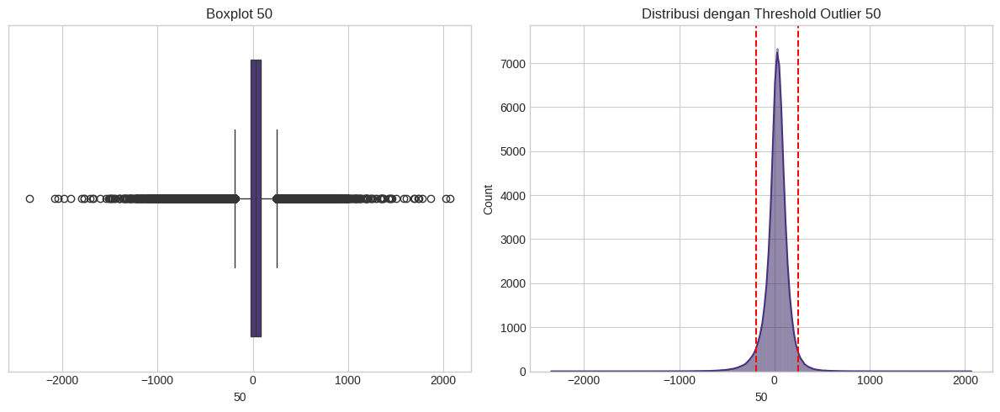

Kolom '50': 33049 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (6.41%)
  Threshold: < -189.776 atau > 250.857



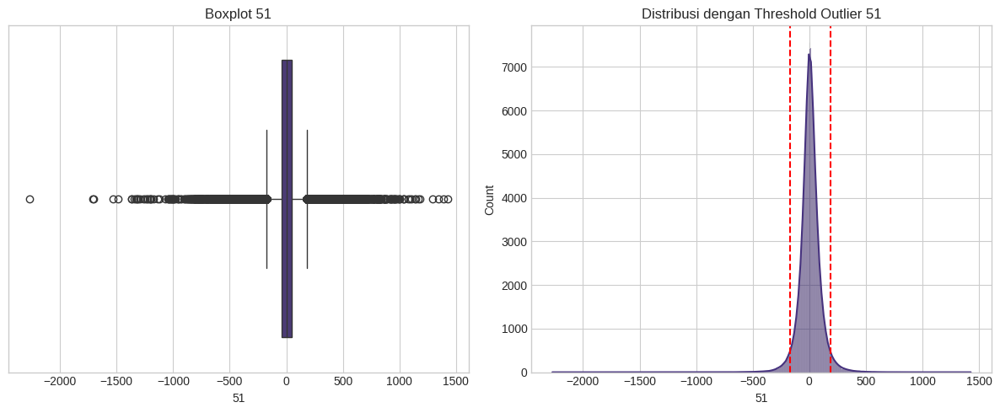

Kolom '51': 29753 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (5.77%)
  Threshold: < -172.600 atau > 184.473



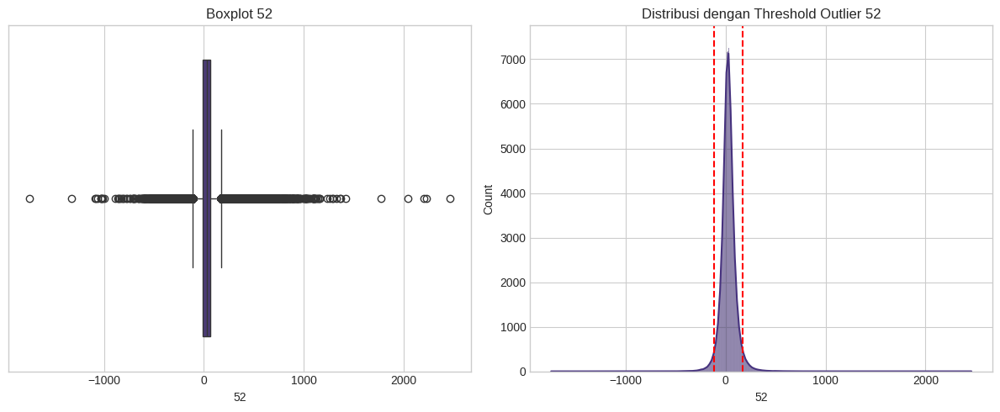

Kolom '52': 27773 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (5.39%)
  Threshold: < -116.434 atau > 169.767



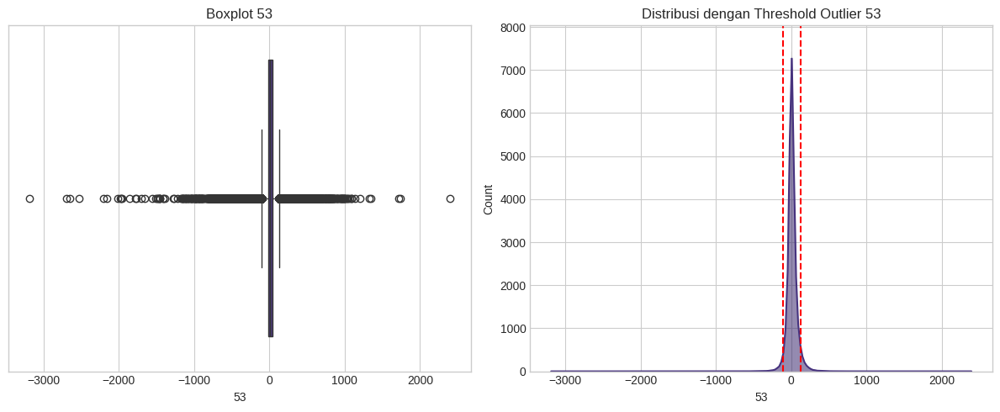

Kolom '53': 36203 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (7.03%)
  Threshold: < -104.416 atau > 125.795



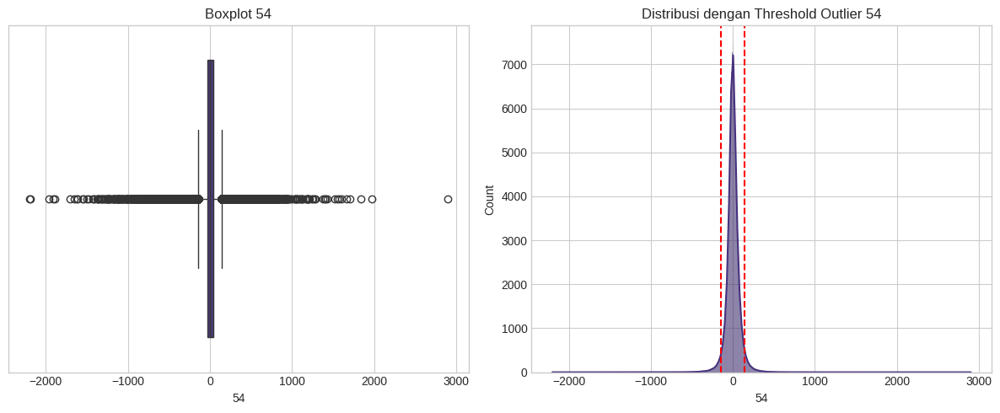

Kolom '54': 33013 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (6.41%)
  Threshold: < -140.772 atau > 144.051



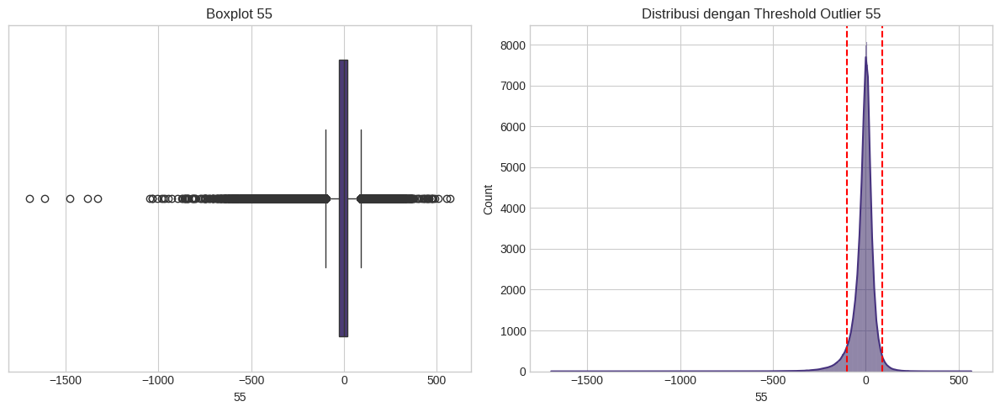

Kolom '55': 38483 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (7.47%)
  Threshold: < -100.187 atau > 89.870



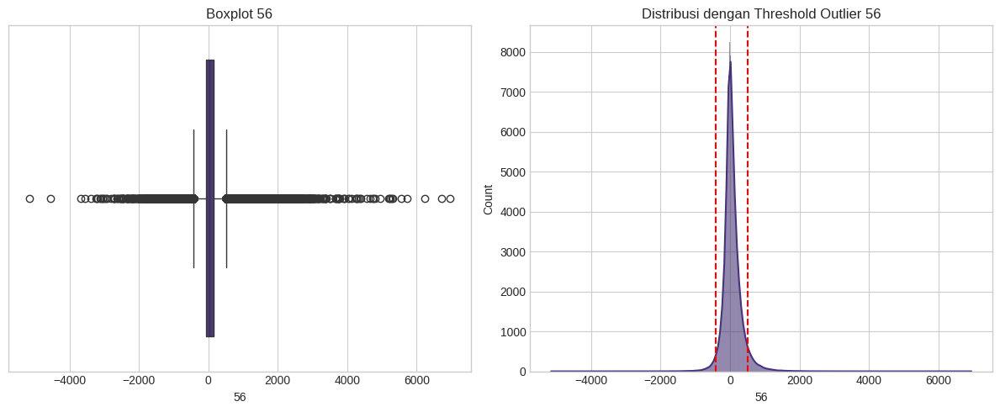

Kolom '56': 36559 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (7.09%)
  Threshold: < -416.891 atau > 512.029



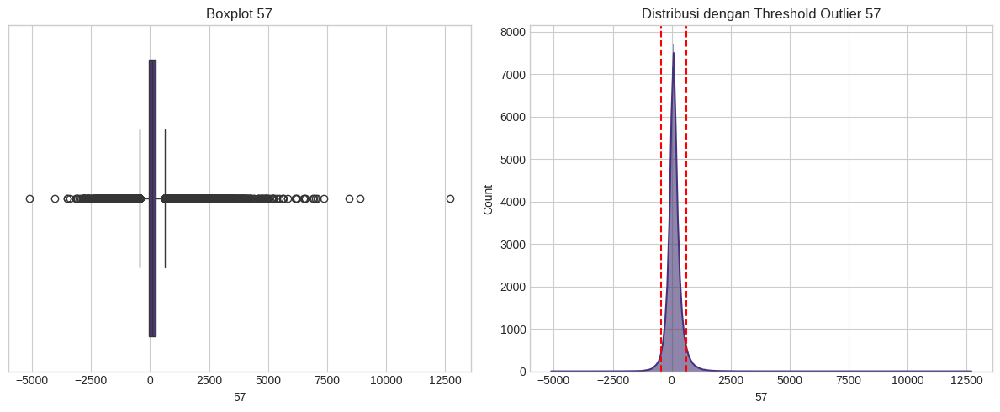

Kolom '57': 36936 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (7.17%)
  Threshold: < -434.973 atau > 621.534



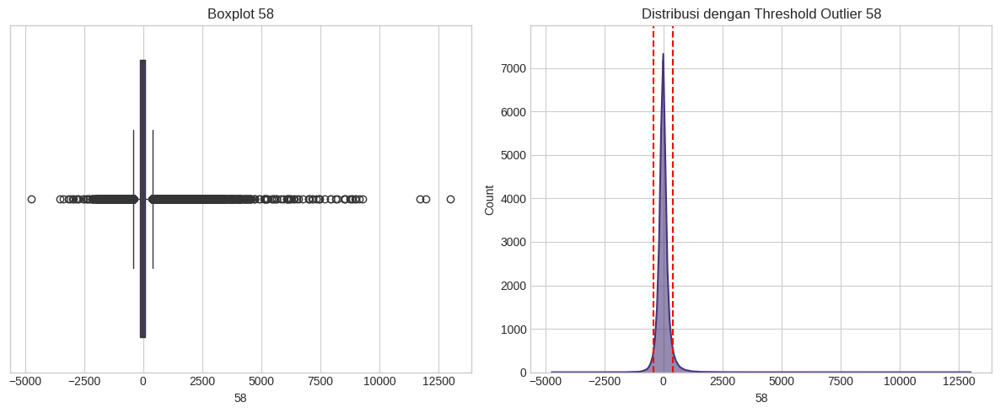

Kolom '58': 37566 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (7.29%)
  Threshold: < -423.514 atau > 392.961



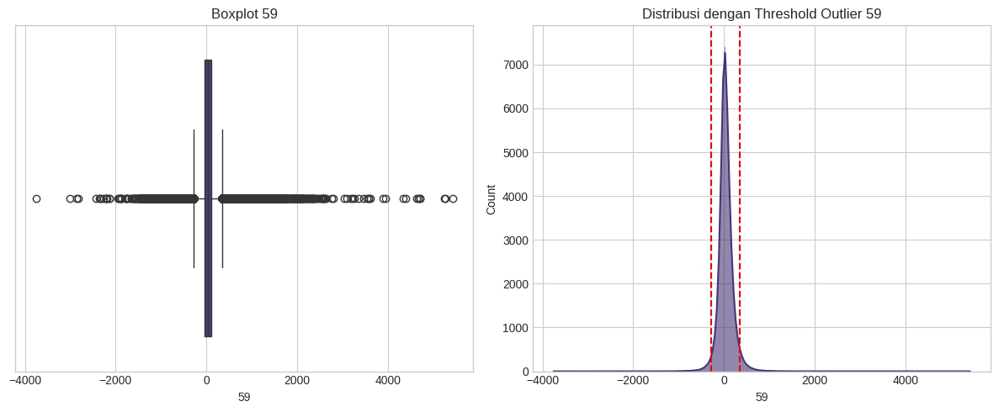

Kolom '59': 29319 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (5.69%)
  Threshold: < -277.590 atau > 344.270



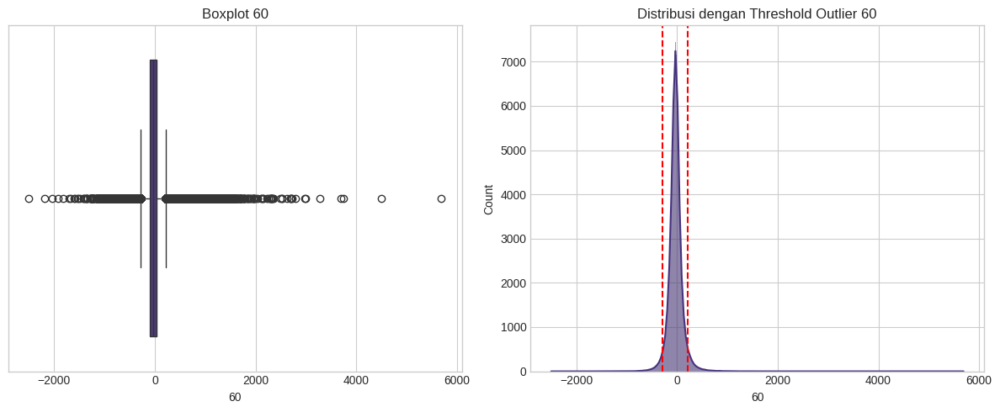

Kolom '60': 34511 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (6.70%)
  Threshold: < -282.068 atau > 218.346



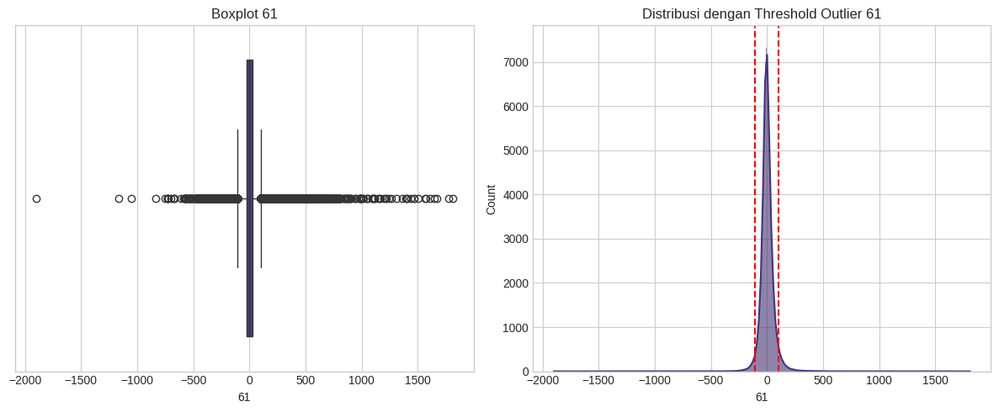

Kolom '61': 31085 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (6.03%)
  Threshold: < -103.886 atau > 105.907



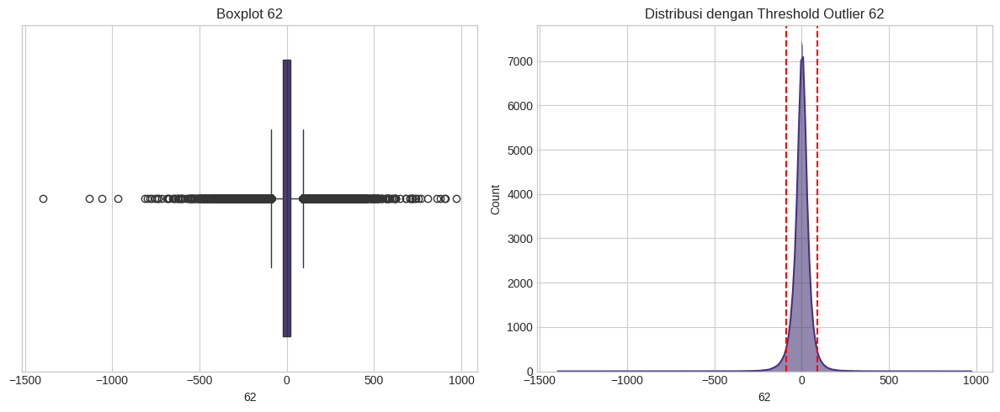

Kolom '62': 30603 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (5.94%)
  Threshold: < -89.576 atau > 91.622



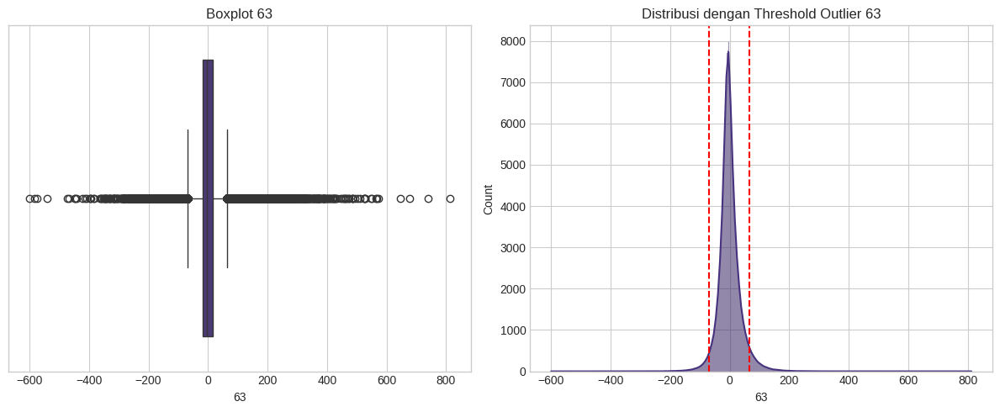

Kolom '63': 36061 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (7.00%)
  Threshold: < -69.066 atau > 65.196



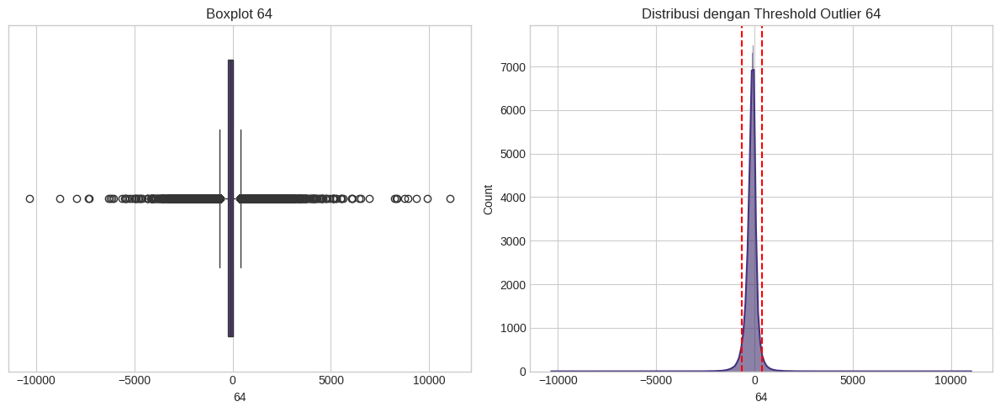

Kolom '64': 33646 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (6.53%)
  Threshold: < -659.159 atau > 397.351



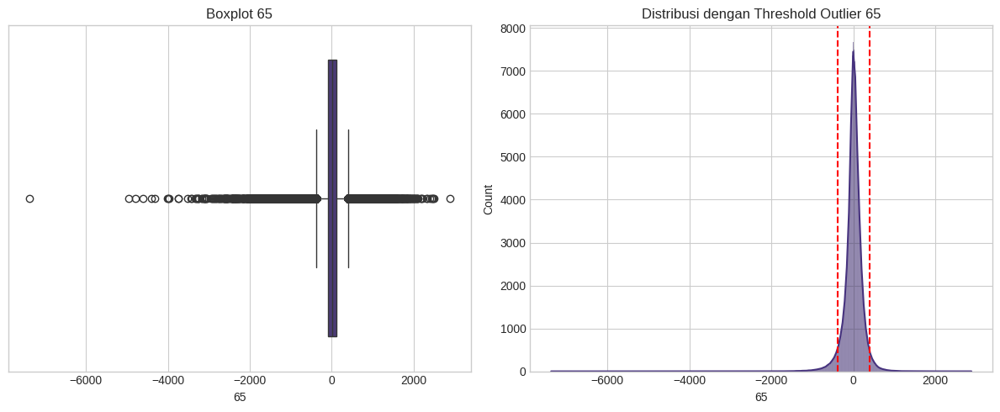

Kolom '65': 36526 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (7.09%)
  Threshold: < -376.506 atau > 394.987



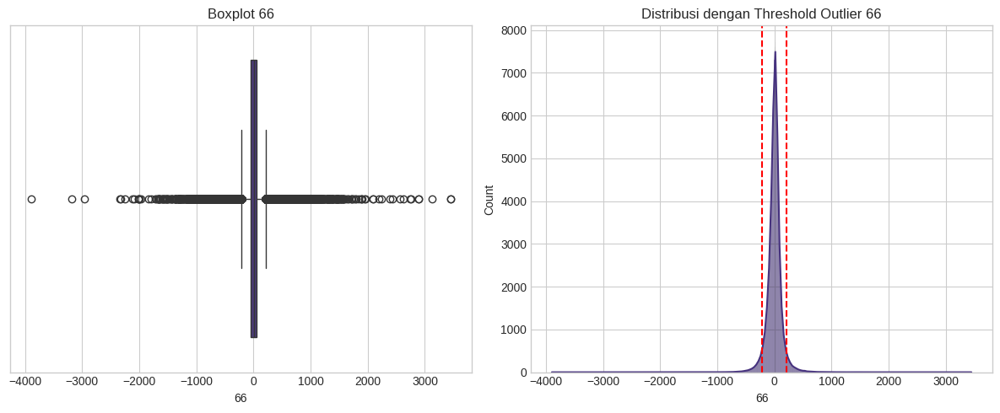

Kolom '66': 38303 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (7.43%)
  Threshold: < -211.458 atau > 213.528



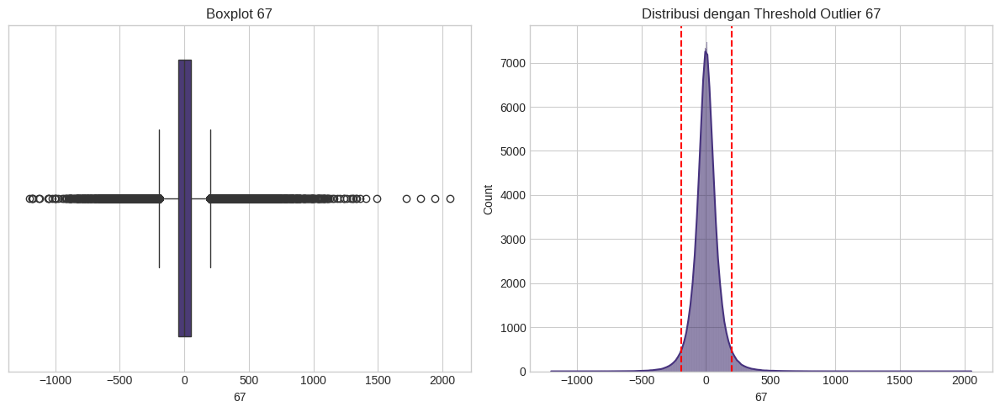

Kolom '67': 27972 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (5.43%)
  Threshold: < -193.475 atau > 198.630



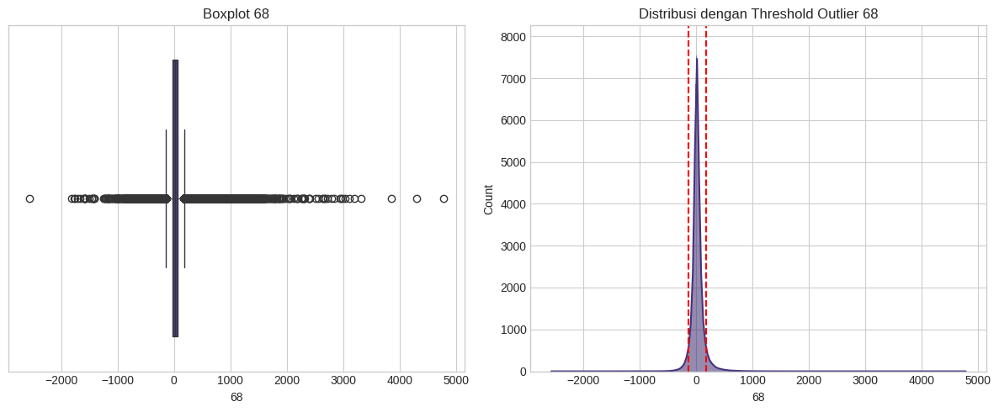

Kolom '68': 46753 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (9.07%)
  Threshold: < -140.305 atau > 181.991



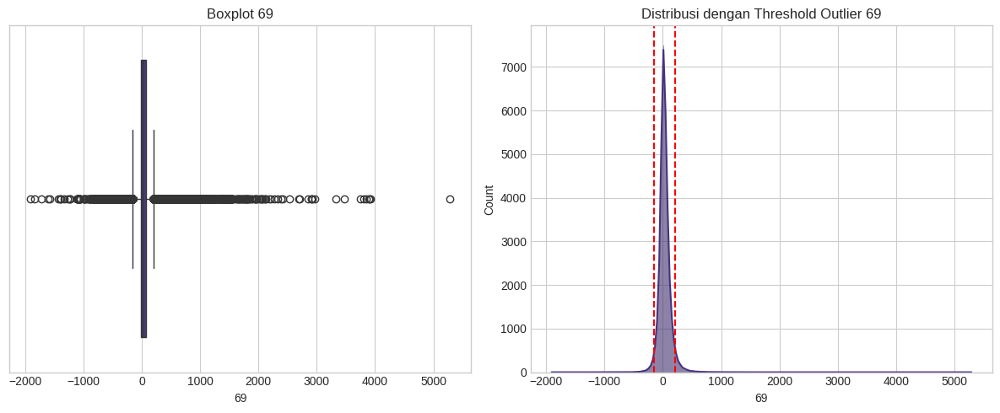

Kolom '69': 30418 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (5.90%)
  Threshold: < -157.771 atau > 210.652



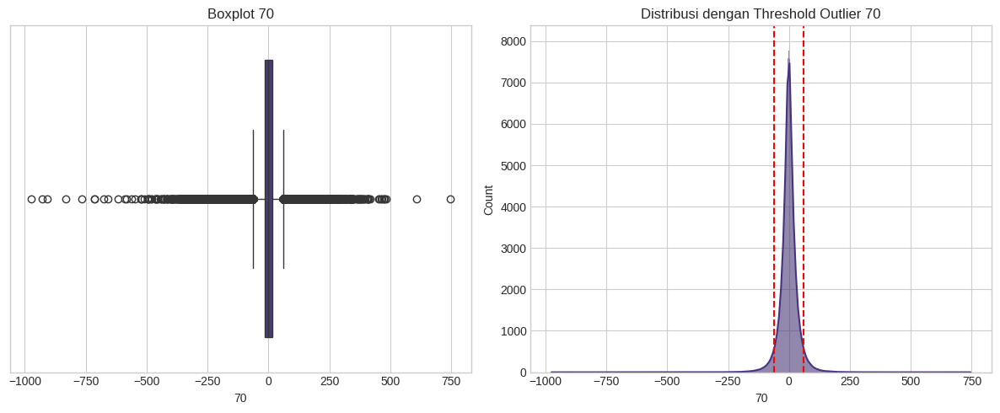

Kolom '70': 39290 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (7.62%)
  Threshold: < -62.503 atau > 61.136



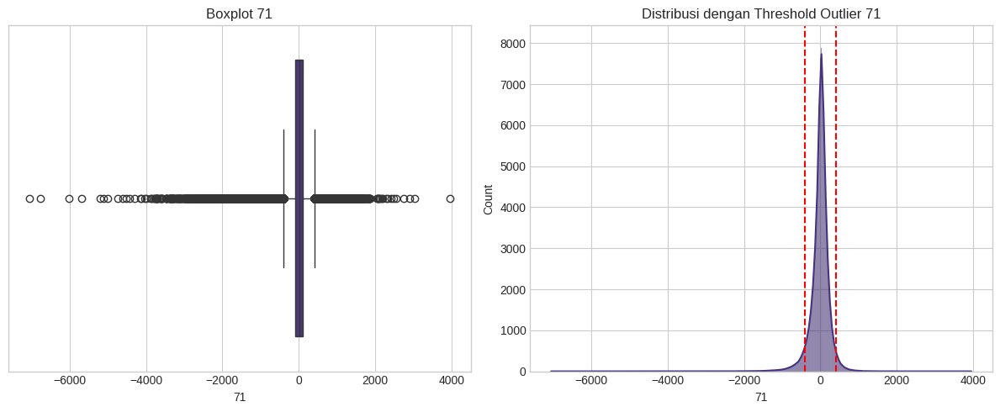

Kolom '71': 38359 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (7.44%)
  Threshold: < -405.320 atau > 418.838



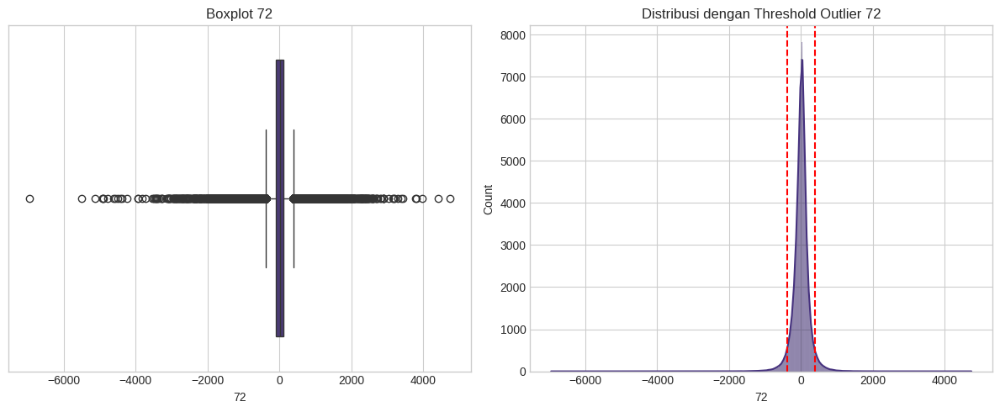

Kolom '72': 36616 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (7.11%)
  Threshold: < -382.034 atau > 394.911



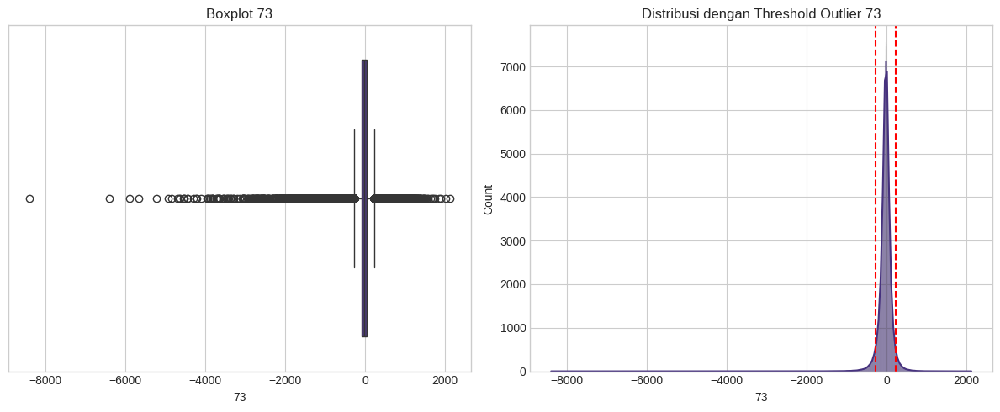

Kolom '73': 36783 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (7.14%)
  Threshold: < -279.876 atau > 235.965



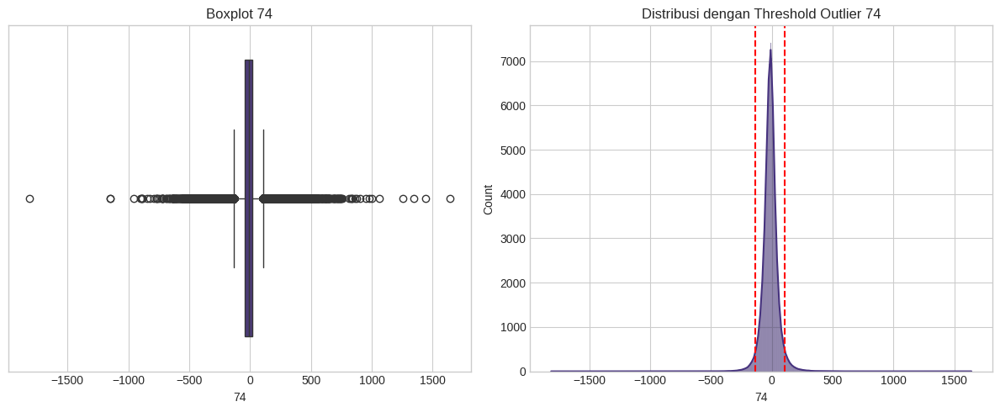

Kolom '74': 28878 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (5.60%)
  Threshold: < -133.197 atau > 107.620



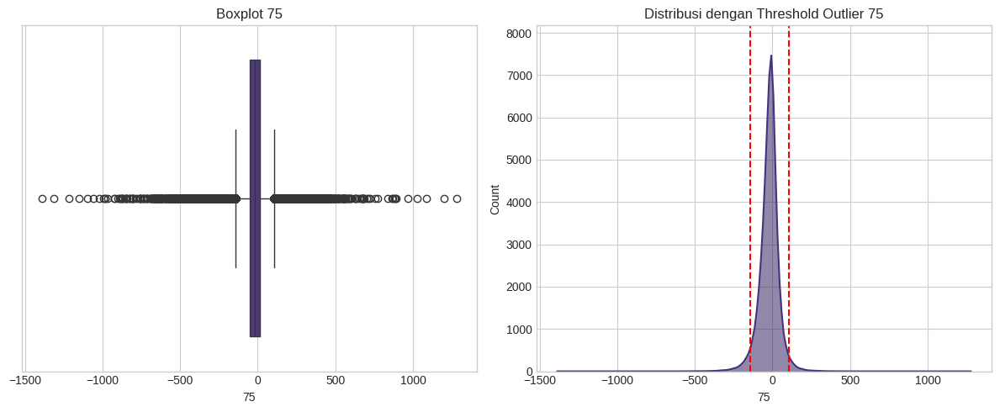

Kolom '75': 28404 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (5.51%)
  Threshold: < -144.259 atau > 104.945



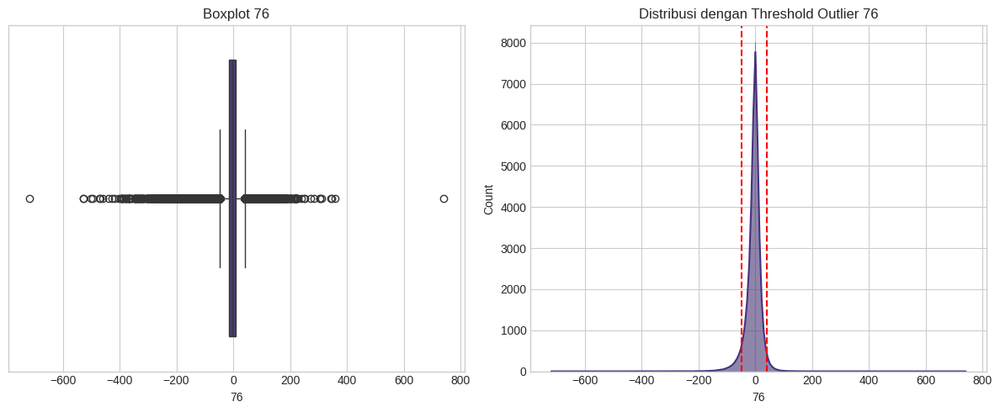

Kolom '76': 37052 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (7.19%)
  Threshold: < -48.949 atau > 41.471



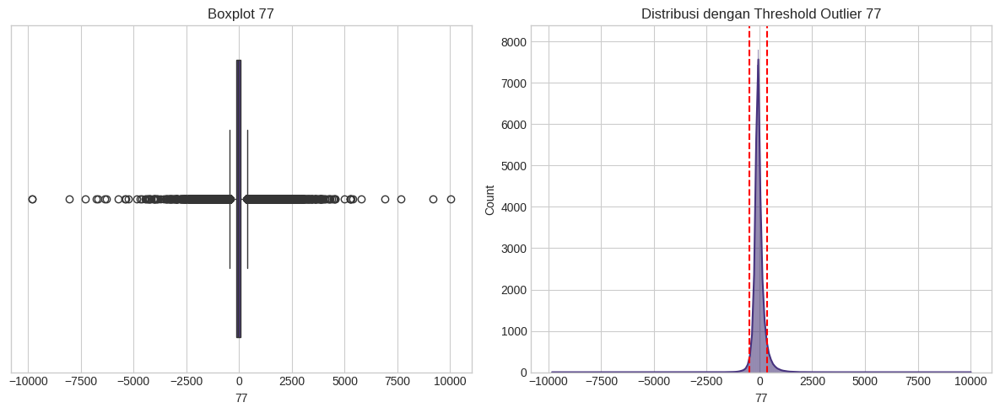

Kolom '77': 39713 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (7.71%)
  Threshold: < -467.140 atau > 379.729



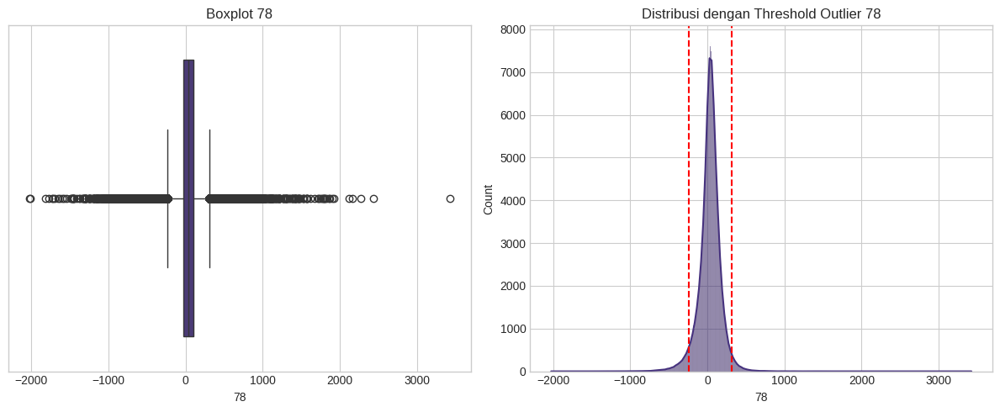

Kolom '78': 31172 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (6.05%)
  Threshold: < -237.569 atau > 311.344



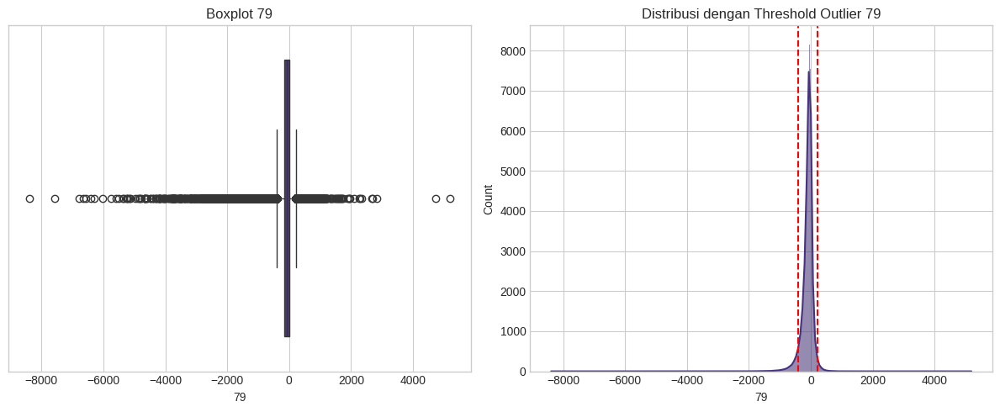

Kolom '79': 36192 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (7.02%)
  Threshold: < -397.623 atau > 226.843



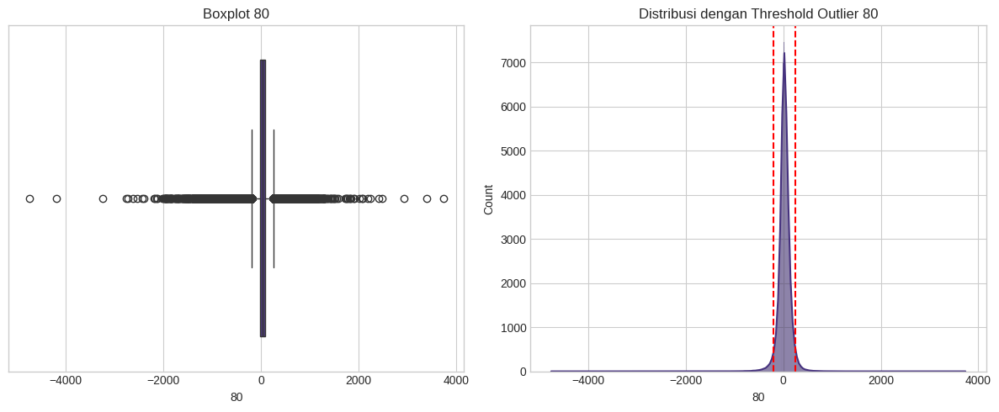

Kolom '80': 28085 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (5.45%)
  Threshold: < -198.299 atau > 256.011



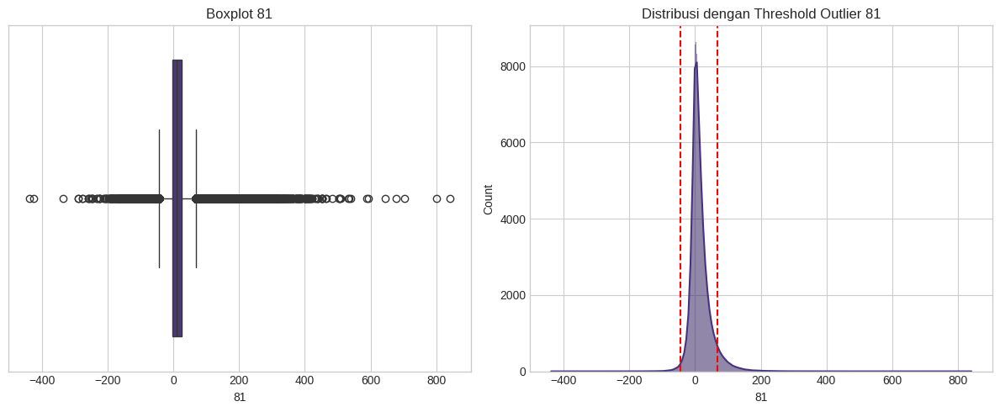

Kolom '81': 35178 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (6.83%)
  Threshold: < -43.943 atau > 68.405



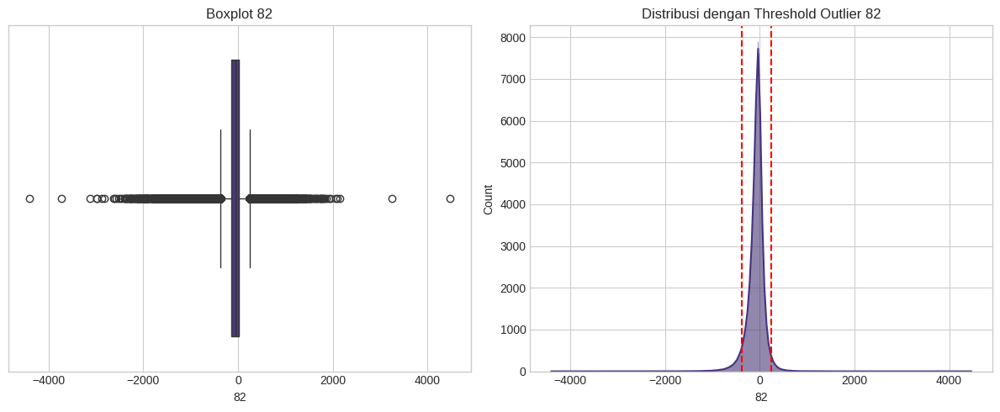

Kolom '82': 35310 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (6.85%)
  Threshold: < -369.106 atau > 243.030



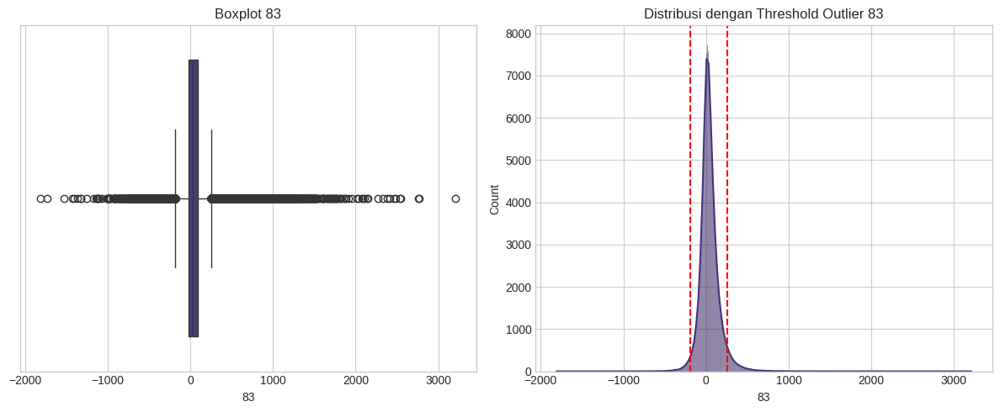

Kolom '83': 32033 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (6.22%)
  Threshold: < -186.960 atau > 255.635



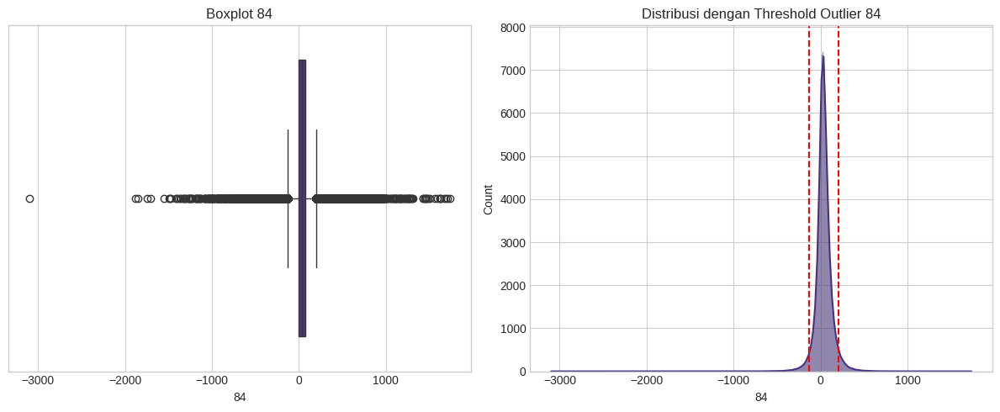

Kolom '84': 35553 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (6.90%)
  Threshold: < -128.353 atau > 201.469



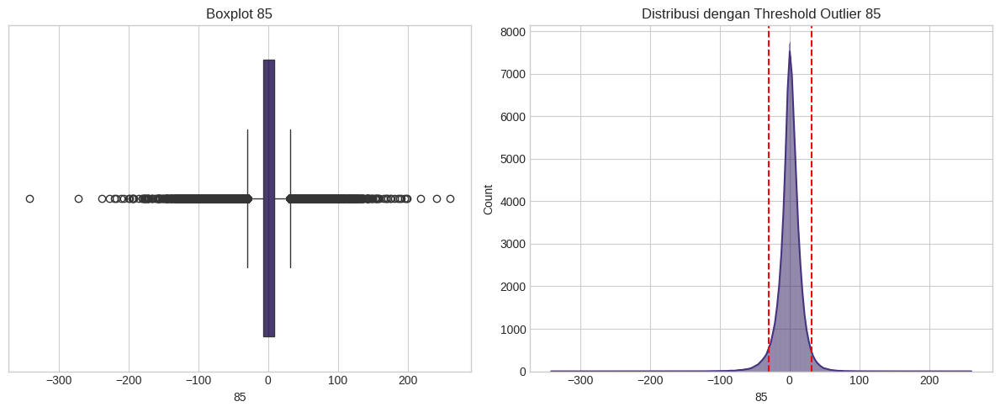

Kolom '85': 31618 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (6.14%)
  Threshold: < -29.660 atau > 31.350



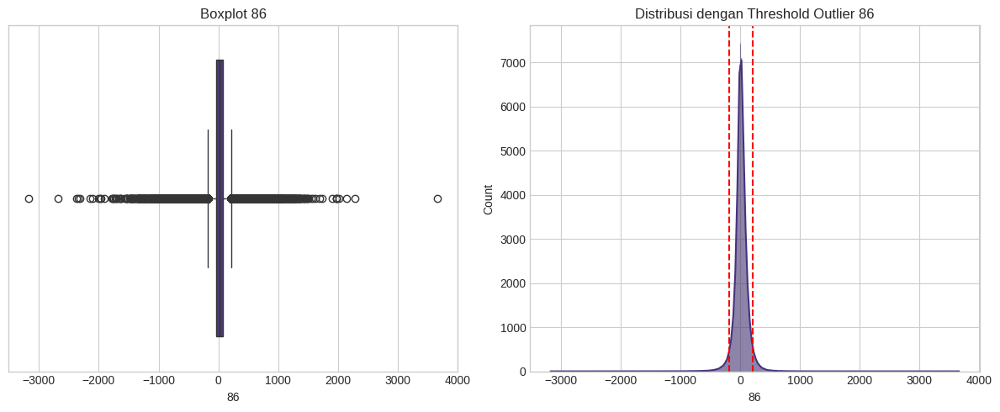

Kolom '86': 33876 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (6.57%)
  Threshold: < -180.644 atau > 216.858



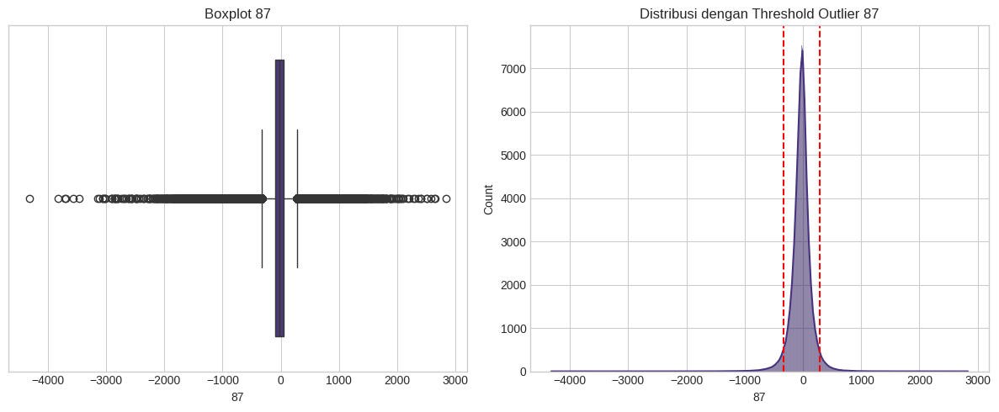

Kolom '87': 32702 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (6.35%)
  Threshold: < -332.410 atau > 283.269



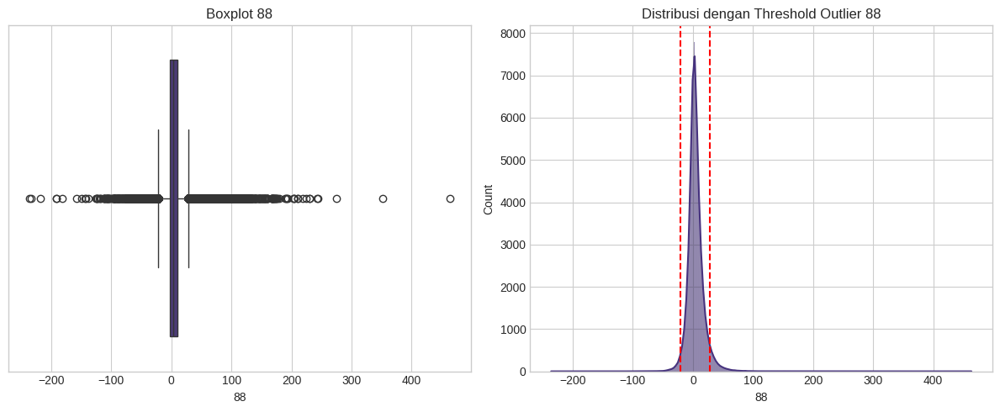

Kolom '88': 30399 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (5.90%)
  Threshold: < -21.367 atau > 28.768



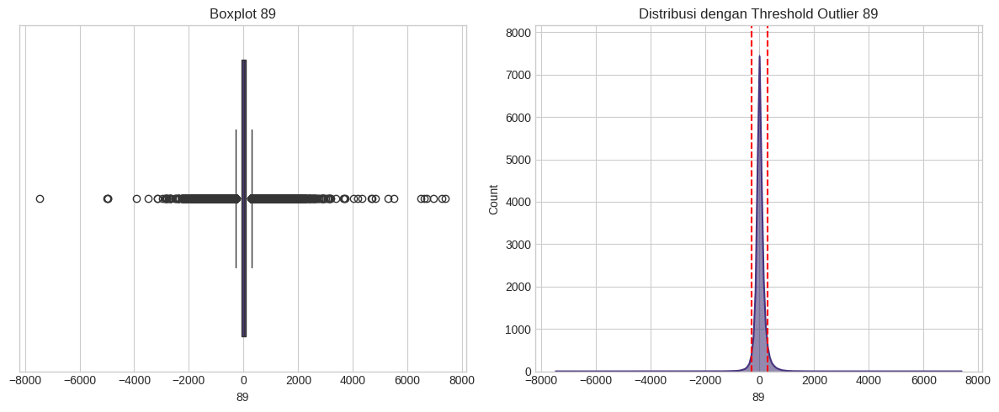

Kolom '89': 39148 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (7.60%)
  Threshold: < -278.301 atau > 305.143



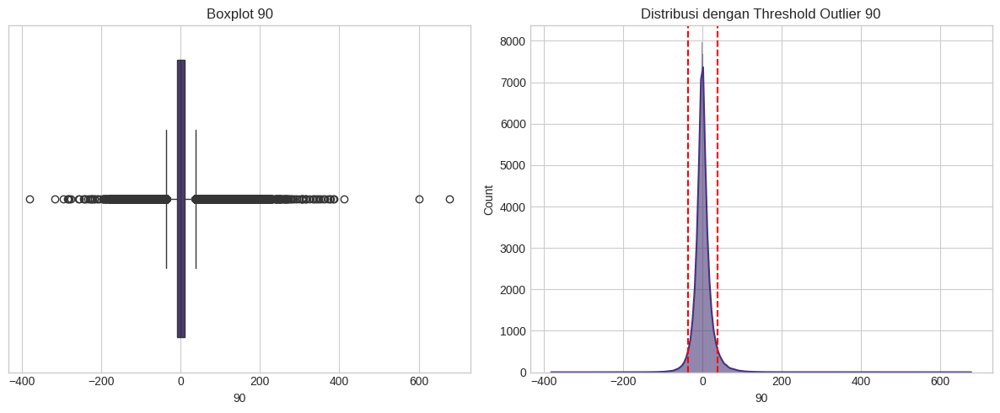

Kolom '90': 39477 outlier terdeteksi dengan metode IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR) (7.66%)
  Threshold: < -36.570 atau > 37.429

Total baris yang merupakan outlier: 325461 dari 515345 baris (63.15%)
Winsorizing outlier pada kolom '1': 10627 nilai dibatasi ke [28.136, 59.653]
Winsorizing outlier pada kolom '2': 14647 nilai dibatasi ke [-119.335, 129.399]
Winsorizing outlier pada kolom '3': 15629 nilai dibatasi ke [-73.304, 91.606]
Winsorizing outlier pada kolom '4': 22688 nilai dibatasi ke [-34.400, 34.700]
Winsorizing outlier pada kolom '5': 10454 nilai dibatasi ke [-63.279, 50.354]
Winsorizing outlier pada kolom '6': 11994 nilai dibatasi ke [-42.519, 21.689]
Winsorizing outlier pada kolom '7': 13903 nilai dibatasi ke [-36.714, 32.442]
Winsorizing outlier pada kolom '8': 14544 nilai dibatasi ke [-20.541, 16.986]
Winsorizing outlier pada kolom '9': 15398 nilai dibatasi ke [-20.677, 28.345]
Winsorizing outlier pada kolom '10': 6238 nilai dibatasi ke [-15.333, 19.035]
Winsorizing

In [ ]:
# Fungsi untuk mendeteksi outlier
def detect_outliers(df, method='iqr', cols=None, z_threshold=3.0, plot=True):
    """Mendeteksi outlier pada fitur numerik

    Parameters:
    df (DataFrame): DataFrame yang akan diperiksa
    method (str): Metode deteksi outlier ('iqr' atau 'zscore')
    cols (list): Daftar kolom yang akan diperiksa (default: semua kolom numerik)
    z_threshold (float): Threshold untuk metode z-score (default: 3.0)
    plot (bool): Apakah akan membuat plot outlier

    Returns:
    dict: Dictionary berisi indeks outlier untuk setiap kolom
    """
    if cols is None:
        cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()

    outliers_dict = {}

    for col in cols:
        if method == 'zscore':
            # Metode Z-Score
            z_scores = np.abs((df[col] - df[col].mean()) / df[col].std())
            outliers_idx = df.index[z_scores > z_threshold].tolist()
            threshold_low = df[col].mean() - z_threshold * df[col].std()
            threshold_high = df[col].mean() + z_threshold * df[col].std()
            method_desc = f"Z-Score (|z| > {z_threshold})"
        else:  # method == 'iqr'
            # Metode IQR
            Q1 = df[col].quantile(0.25)
            Q3 = df[col].quantile(0.75)
            IQR = Q3 - Q1
            threshold_low = Q1 - 1.5 * IQR
            threshold_high = Q3 + 1.5 * IQR
            outliers_idx = df.index[(df[col] < threshold_low) | (df[col] > threshold_high)].tolist()
            method_desc = "IQR (< Q1 - 1.5*IQR atau > Q3 + 1.5*IQR)"

        outliers_dict[col] = outliers_idx

        # Visualisasi outlier jika diminta
        if plot and len(outliers_idx) > 0:
            plt.figure(figsize=(12, 5))
            plt.subplot(1, 2, 1)
            sns.boxplot(x=df[col])
            plt.title(f"Boxplot {col}")

            plt.subplot(1, 2, 2)
            sns.histplot(df[col], kde=True)
            plt.axvline(threshold_low, color='r', linestyle='--')
            plt.axvline(threshold_high, color='r', linestyle='--')
            plt.title(f"Distribusi dengan Threshold Outlier {col}")
            plt.tight_layout()
            plt.show()

            print(f"Kolom '{col}': {len(outliers_idx)} outlier terdeteksi dengan metode {method_desc} ({len(outliers_idx)/len(df)*100:.2f}%)")
            print(f"  Threshold: < {threshold_low:.3f} atau > {threshold_high:.3f}")
            if len(outliers_idx) <= 10:
                print(f"  Nilai outlier: {df.loc[outliers_idx, col].tolist()}")
            print()

    # Hitung total baris yang merupakan outlier pada setiap kolom
    all_outliers = set()
    for outliers in outliers_dict.values():
        all_outliers.update(outliers)

    print(f"Total baris yang merupakan outlier: {len(all_outliers)} dari {len(df)} baris ({len(all_outliers)/len(df)*100:.2f}%)")

    return outliers_dict

# Fungsi untuk menangani outlier
def handle_outliers(df, outliers_dict, method='winsorize'):
    """Menangani outlier dengan berbagai metode

    Parameters:
    df (DataFrame): DataFrame yang akan diproses
    outliers_dict (dict): Dictionary berisi indeks outlier untuk setiap kolom (hasil dari detect_outliers)
    method (str): Metode untuk menangani outlier
                  'keep': Pertahankan outlier
                  'remove': Hapus baris dengan outlier
                  'winsorize': Batasi nilai outlier ke threshold
                  'log_transform': Transformasi log pada kolom dengan outlier

    Returns:
    DataFrame: DataFrame yang telah diproses
    """
    df_copy = df.copy()

    if method == 'keep':
        print("Outlier dipertahankan (tidak ada perubahan pada data).")
        return df_copy

    # Gabungkan semua indeks outlier
    all_outliers = set()
    for outliers in outliers_dict.values():
        all_outliers.update(outliers)

    if method == 'remove':
        # Hapus baris dengan outlier
        df_copy = df_copy.drop(index=list(all_outliers))
        print(f"Menghapus {len(all_outliers)} baris dengan outlier. Dimensi data sekarang: {df_copy.shape}")

    elif method == 'winsorize':
        # Batasi nilai outlier ke threshold (winsorizing)
        for col, outliers in outliers_dict.items():
            if len(outliers) > 0:
                # Hitung threshold (metode IQR)
                Q1 = df_copy[col].quantile(0.25)
                Q3 = df_copy[col].quantile(0.75)
                IQR = Q3 - Q1
                lower_bound = Q1 - 1.5 * IQR
                upper_bound = Q3 + 1.5 * IQR

                # Winsorize nilai outlier
                df_copy.loc[df_copy[col] < lower_bound, col] = lower_bound
                df_copy.loc[df_copy[col] > upper_bound, col] = upper_bound

                print(f"Winsorizing outlier pada kolom '{col}': {len(outliers)} nilai dibatasi ke [{lower_bound:.3f}, {upper_bound:.3f}]")

    elif method == 'log_transform':
        # Transformasi log pada kolom dengan outlier
        for col, outliers in outliers_dict.items():
            if len(outliers) > 0:
                # Periksa apakah semua nilai positif
                if df_copy[col].min() <= 0:
                    min_val = df_copy[col].min()
                    shift = abs(min_val) + 1 if min_val <= 0 else 0
                    print(f"Menggeser nilai kolom '{col}' dengan +{shift} untuk memastikan semua nilai positif sebelum transformasi log")
                    df_copy[col] = df_copy[col] + shift

                # Transformasi log
                df_copy[col] = np.log1p(df_copy[col])  # log(1+x) untuk menghindari log(0)
                print(f"Transformasi log(1+x) pada kolom '{col}' untuk mengatasi {len(outliers)} outlier")

    else:
        print(f"WARNING: Metode '{method}' tidak dikenal. Outlier dipertahankan.")

    return df_copy

# Deteksi outlier pada fitur numerik
num_cols = df_cleaned.select_dtypes(include=['int64', 'float64']).columns.tolist()
if target_column in num_cols:
    # Deteksi outlier hanya pada fitur, bukan target
    num_cols.remove(target_column)

# Deteksi outlier dengan metode IQR
outliers = detect_outliers(df_cleaned, method='iqr', cols=num_cols, plot=True)

# Tangani outlier dengan metode winsorizing
df_no_outliers = handle_outliers(df_cleaned, outliers, method='winsorize')

### 1.5 Persiapan Data untuk Pemodelan

Setelah melakukan pembersihan data, langkah selanjutnya adalah mempersiapkan data untuk pemodelan. Ini meliputi pemisahan fitur (X) dan target (y), serta pembagian data menjadi set pelatihan dan pengujian.

In [ ]:
# Pastikan target_column sudah ditentukan
if target_column is None or target_column not in df_no_outliers.columns:
    raise ValueError("Kolom target belum ditentukan atau tidak valid!")

# Pemisahan fitur dan target
X = df_no_outliers.drop(columns=[target_column])
y = df_no_outliers[target_column]

# Pisahkan data numerik dan kategorikal
num_features = X.select_dtypes(include=['int64', 'float64']).columns.tolist()
cat_features = X.select_dtypes(include=['object', 'category']).columns.tolist()

print(f"Jumlah fitur numerik: {len(num_features)}")
print(f"Jumlah fitur kategorikal: {len(cat_features)}")

# Pembagian data menjadi set pelatihan dan pengujian
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print(f"Dimensi X_train: {X_train.shape}")
print(f"Dimensi X_test: {X_test.shape}")
print(f"Dimensi y_train: {y_train.shape}")
print(f"Dimensi y_test: {y_test.shape}")

# Simpan fitur dan data yang telah dibersihkan untuk tahap selanjutnya
features_info = {
    'numerical': num_features,
    'categorical': cat_features,
    'target': target_column
}

print("\nTahap pengumpulan dan pembersihan data telah selesai.")
print("Data siap untuk tahap Feature Selection.")

Jumlah fitur numerik: 90
Jumlah fitur kategorikal: 0
Dimensi X_train: (412276, 90)
Dimensi X_test: (103069, 90)
Dimensi y_train: (412276,)
Dimensi y_test: (103069,)

Tahap pengumpulan dan pembersihan data telah selesai.
Data siap untuk tahap Feature Selection.


# 2. Feature Selection

Feature Selection adalah proses memilih subset fitur yang paling relevan dengan variabel target. Tujuan dari feature selection adalah:
- Mengurangi dimensi data (dimensionality reduction)
- Mengurangi overfitting
- Meningkatkan akurasi model
- Mengurangi waktu pelatihan
- Meningkatkan interpretabilitas model

Ada beberapa metode feature selection yang akan kita gunakan:
1. **Filter untuk Fitur Konstan dan Quasi-Konstan**
2. **Filter Berdasarkan Korelasi**
3. **Mutual Information**
4. **Chi-Square Test** (untuk masalah klasifikasi, tapi kita tetap bahas)
5. **ANOVA/MANOVA**
6. **Seleksi Berdasarkan Model**
7. **Recursive Feature Elimination (RFE)**

In [ ]:
# Memuat kembali library yang diperlukan dan data dari tahap sebelumnya
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import VarianceThreshold, SelectKBest, f_regression, mutual_info_regression
from sklearn.feature_selection import chi2, f_classif, SelectFromModel, RFE
from sklearn.linear_model import LinearRegression, Lasso
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings('ignore')

# Asumsikan data telah dimuat dan dibersihkan dari tahap sebelumnya
# Jika Anda menjalankan notebook ini secara terpisah, muat data Anda di sini
try:
    # Cek apakah variabel dari tahap sebelumnya tersedia
    X_train.shape
    print("Data dari tahap sebelumnya tersedia.")
except NameError:
    print("Data dari tahap sebelumnya tidak tersedia. Memuat data baru...")
    # Ganti DATA_PATH dengan path dataset Anda
    DATA_PATH = "your_dataset.csv"

    try:
        # Coba memuat dataset
        df = pd.read_csv(DATA_PATH)
    except Exception as e:
        print(f"Error saat memuat dataset: {e}")
        # Jika terjadi error, gunakan dataset contoh
        from sklearn.datasets import fetch_california_housing
        housing = fetch_california_housing()
        df = pd.DataFrame(housing.data, columns=housing.feature_names)
        df['target'] = housing.target
        print(f"Menggunakan dataset California Housing dengan {df.shape[0]} baris dan {df.shape[1]} kolom.")

    # Tentukan kolom target (ganti sesuai dataset Anda)
    target_column = 'target' if 'target' in df.columns else df.columns[-1]

    # Pemisahan fitur dan target
    X = df.drop(columns=[target_column])
    y = df[target_column]

    # Pisahkan data numerik dan kategorikal
    num_features = X.select_dtypes(include=['int64', 'float64']).columns.tolist()
    cat_features = X.select_dtypes(include=['object', 'category']).columns.tolist()

    # Pembagian data menjadi set pelatihan dan pengujian
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Simpan informasi fitur
    features_info = {
        'numerical': num_features,
        'categorical': cat_features,
        'target': target_column
    }

print(f"Dimensi X_train: {X_train.shape}")
print(f"Dimensi y_train: {y_train.shape}")

Data dari tahap sebelumnya tersedia.
Dimensi X_train: (412276, 90)
Dimensi y_train: (412276,)


## 2.1 Filter untuk Fitur Konstan dan Quasi-Konstan

Fitur konstan adalah fitur yang nilainya sama untuk semua sampel. Fitur quasi-konstan adalah fitur yang nilainya sama untuk sebagian besar sampel (misalnya, > 99% sampel memiliki nilai yang sama). Fitur-fitur ini tidak memberikan informasi yang berguna untuk model dan dapat dihapus.

Kita akan menggunakan `VarianceThreshold` dari scikit-learn untuk menghapus fitur dengan varians rendah.

In [ ]:
def remove_constant_features(X_train, X_test, threshold=0.01):
    """Menghapus fitur konstan dan quasi-konstan menggunakan VarianceThreshold

    Parameters:
    X_train (DataFrame): Data pelatihan
    X_test (DataFrame): Data pengujian
    threshold (float): Threshold varians untuk menghapus fitur (default: 0.01)

    Returns:
    tuple: (X_train_filtered, X_test_filtered, selected_features)
    """
    # Membuat objek VarianceThreshold
    var_threshold = VarianceThreshold(threshold=threshold)

    # Fit dan transform data pelatihan
    X_train_var = var_threshold.fit_transform(X_train)

    # Mendapatkan indeks fitur yang dipilih
    selected_features_mask = var_threshold.get_support()
    selected_features = X_train.columns[selected_features_mask].tolist()
    removed_features = X_train.columns[~selected_features_mask].tolist()

    # Transform data pengujian
    X_test_var = var_threshold.transform(X_test)

    # Konversi kembali ke DataFrame
    X_train_filtered = pd.DataFrame(X_train_var, columns=selected_features, index=X_train.index)
    X_test_filtered = pd.DataFrame(X_test_var, columns=selected_features, index=X_test.index)

    # Informasi tentang fitur yang dihapus
    print(f"Jumlah fitur sebelum filtering: {X_train.shape[1]}")
    print(f"Jumlah fitur setelah filtering: {X_train_filtered.shape[1]}")
    print(f"Jumlah fitur yang dihapus: {len(removed_features)}")

    if len(removed_features) > 0:
        print(f"Fitur yang dihapus: {removed_features}")

        # Tampilkan varians fitur yang dihapus
        variances = X_train[removed_features].var().sort_values()
        print("\nVarians fitur yang dihapus:")
        for feature, var in variances.items():
            print(f"  {feature}: {var:.6f}")

    return X_train_filtered, X_test_filtered, selected_features

# Menghapus fitur konstan dan quasi-konstan
X_train_const, X_test_const, selected_features_const = remove_constant_features(X_train, X_test, threshold=0.01)

Jumlah fitur sebelum filtering: 90
Jumlah fitur setelah filtering: 90
Jumlah fitur yang dihapus: 0


### Penjelasan Matematika - VarianceThreshold

VarianceThreshold menghapus fitur berdasarkan varians. Untuk suatu fitur $X$, varians dihitung dengan rumus:

$$\text{Var}(X) = \frac{\sum_{i=1}^{n} (x_i - \bar{x})^2}{n-1}$$

di mana:
- $x_i$ adalah nilai fitur untuk sampel ke-$i$
- $\bar{x}$ adalah nilai rata-rata fitur
- $n$ adalah jumlah sampel

Untuk fitur biner (0/1), varians dapat dihitung sebagai:

$$\text{Var}(X) = p(1-p)$$

di mana $p$ adalah proporsi sampel dengan nilai 1.

VarianceThreshold menghapus semua fitur dengan varians $\leq$ threshold. Fitur dengan varians rendah cenderung tidak memberikan informasi yang signifikan untuk pemodelan.

## 2.2 Filter Berdasarkan Korelasi

Fitur yang berkorelasi tinggi dapat menyebabkan multicollinearity yang mempengaruhi stabilitas dan interpretabilitas model. Kita dapat menghapus salah satu dari pasangan fitur yang berkorelasi tinggi untuk mengatasi masalah ini.

Ada dua pendekatan untuk menghapus fitur berdasarkan korelasi:
1. **Korelasi dengan Target**: Pilih fitur yang memiliki korelasi tinggi dengan target
2. **Korelasi antar Fitur**: Hapus fitur yang berkorelasi tinggi dengan fitur lain (multicollinearity)

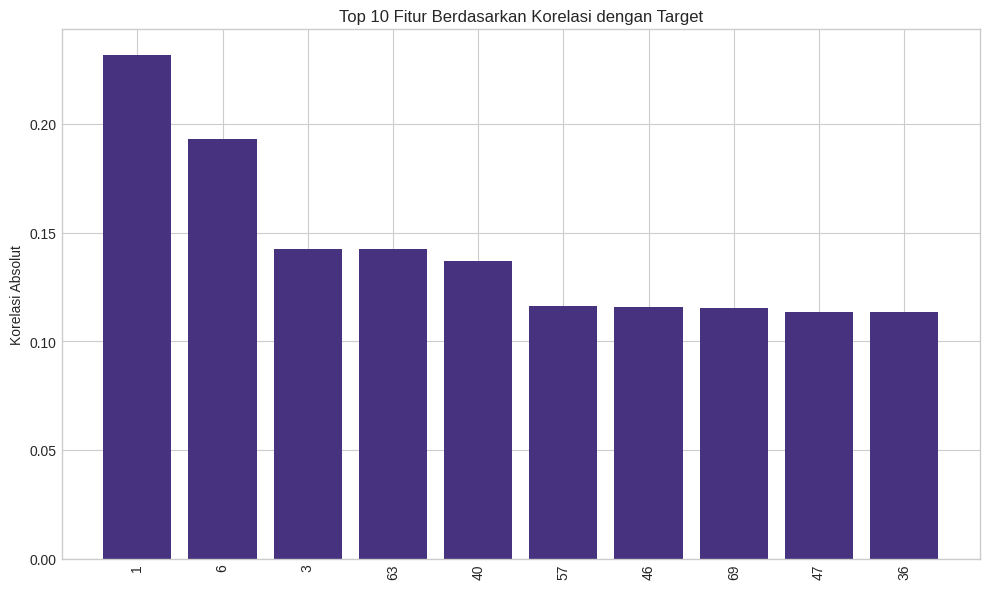

Top 10 fitur berdasarkan korelasi dengan target:
  1. 1: 0.2319
  2. 6: 0.1929
  3. 3: 0.1426
  4. 63: 0.1425
  5. 40: 0.1370
  6. 57: 0.1162
  7. 46: 0.1156
  8. 69: 0.1151
  9. 47: 0.1135
  10. 36: 0.1132


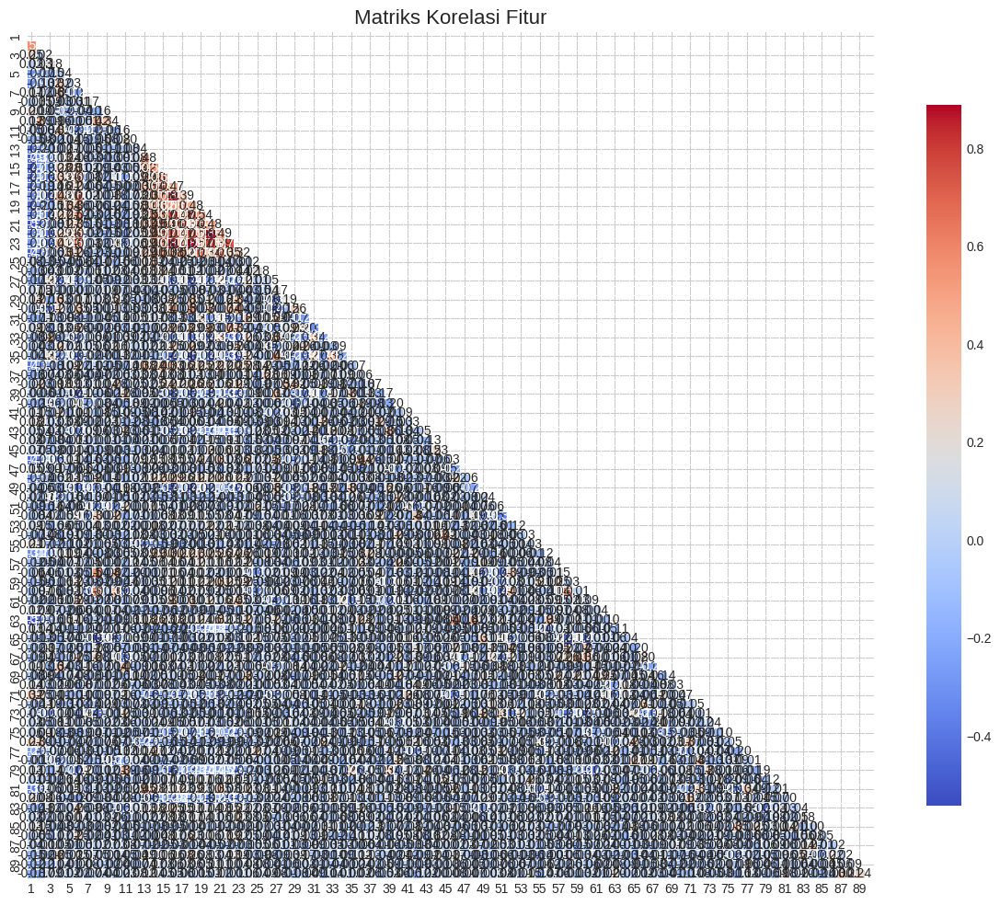

Pasangan fitur dengan korelasi > 0.8:
  18 dan 23: 0.8889
  20 dan 22: 0.8815
  16 dan 23: 0.8721
  16 dan 18: 0.8408


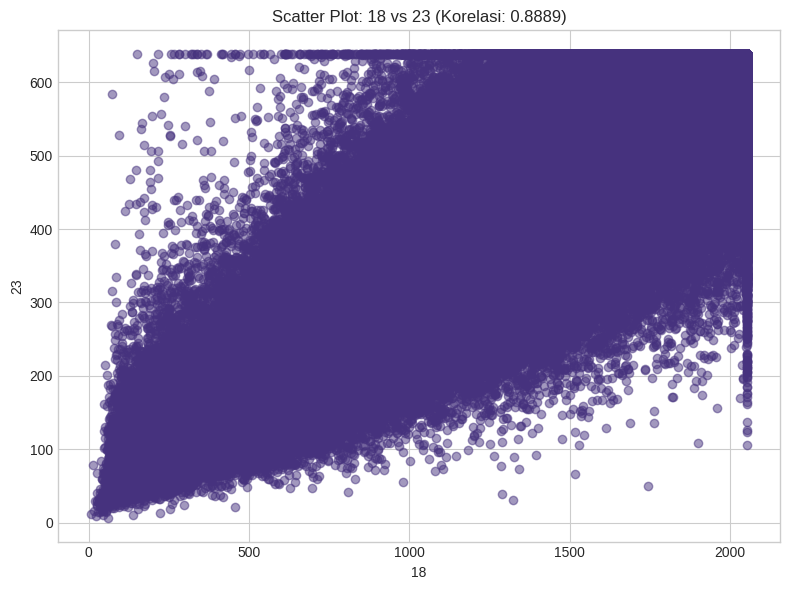

Jumlah fitur sebelum filtering: 90
Jumlah fitur setelah filtering: 87
Jumlah fitur yang dihapus: 3
Fitur yang dihapus: [18, 22, 23]


In [ ]:
def plot_feature_correlations_with_target(X, y, top_n=10):
    """Membuat plot korelasi fitur dengan target

    Parameters:
    X (DataFrame): Data fitur
    y (Series): Data target
    top_n (int): Jumlah fitur teratas yang akan ditampilkan
    """
    # Hitung korelasi fitur dengan target
    correlations = np.zeros(X.shape[1])
    for i, column in enumerate(X.columns):
        correlations[i] = np.abs(np.corrcoef(X[column], y)[0, 1])

    # Urut fitur berdasarkan korelasi
    indices = np.argsort(correlations)[::-1]
    top_indices = indices[:top_n]

    # Plot korelasi
    plt.figure(figsize=(10, 6))
    plt.title(f"Top {top_n} Fitur Berdasarkan Korelasi dengan Target")
    plt.bar(range(top_n), correlations[top_indices])
    plt.xticks(range(top_n), X.columns[top_indices], rotation=90)
    plt.ylabel('Korelasi Absolut')
    plt.tight_layout()
    plt.show()

    # Tampilkan korelasi
    print(f"Top {top_n} fitur berdasarkan korelasi dengan target:")
    for i in range(top_n):
        feature = X.columns[indices[i]]
        corr = correlations[indices[i]]
        print(f"  {i+1}. {feature}: {corr:.4f}")

def remove_correlated_features(X_train, X_test, threshold=0.8):
    """Menghapus fitur yang berkorelasi tinggi

    Parameters:
    X_train (DataFrame): Data pelatihan
    X_test (DataFrame): Data pengujian
    threshold (float): Threshold korelasi (default: 0.8)

    Returns:
    tuple: (X_train_filtered, X_test_filtered, selected_features)
    """
    # Hitung matriks korelasi
    corr_matrix = X_train.corr().abs()

    # Ambil segitiga atas dari matriks korelasi
    upper_tri = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

    # Temukan fitur yang berkorelasi tinggi
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > threshold)]

    # Visualisasi korelasi tinggi jika ada
    if len(to_drop) > 0:
        # Temukan pasangan fitur dengan korelasi tinggi
        high_corr_pairs = []
        for i in range(len(X_train.columns)):
            for j in range(i+1, len(X_train.columns)):
                if abs(corr_matrix.iloc[i, j]) > threshold:
                    high_corr_pairs.append((X_train.columns[i], X_train.columns[j], corr_matrix.iloc[i, j]))

        # Tampilkan pasangan fitur dengan korelasi tinggi
        high_corr_pairs.sort(key=lambda x: -abs(x[2]))  # Urutkan berdasarkan korelasi tertinggi
        print(f"Pasangan fitur dengan korelasi > {threshold}:")
        for f1, f2, corr in high_corr_pairs:
            print(f"  {f1} dan {f2}: {corr:.4f}")

        # Visualisasi pasangan fitur teratas
        if len(high_corr_pairs) > 0:
            top_pair = high_corr_pairs[0]
            plt.figure(figsize=(8, 6))
            plt.scatter(X_train[top_pair[0]], X_train[top_pair[1]], alpha=0.5)
            plt.xlabel(top_pair[0])
            plt.ylabel(top_pair[1])
            plt.title(f"Scatter Plot: {top_pair[0]} vs {top_pair[1]} (Korelasi: {top_pair[2]:.4f})")
            plt.tight_layout()
            plt.show()

    # Filter fitur
    X_train_filtered = X_train.drop(columns=to_drop)
    X_test_filtered = X_test.drop(columns=to_drop)
    selected_features = X_train_filtered.columns.tolist()

    # Informasi tentang fitur yang dihapus
    print(f"Jumlah fitur sebelum filtering: {X_train.shape[1]}")
    print(f"Jumlah fitur setelah filtering: {X_train_filtered.shape[1]}")
    print(f"Jumlah fitur yang dihapus: {len(to_drop)}")

    if len(to_drop) > 0:
        print(f"Fitur yang dihapus: {to_drop}")

    return X_train_filtered, X_test_filtered, selected_features

# Plot korelasi fitur dengan target
plot_feature_correlations_with_target(X_train_const, y_train)

# Visualisasi matriks korelasi
plt.figure(figsize=(12, 10))
corr_matrix = X_train_const.corr()
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
sns.heatmap(corr_matrix, mask=mask, annot=True, fmt=".2f", cmap='coolwarm',
            square=True, linewidths=0.5, cbar_kws={"shrink": 0.8})
plt.title('Matriks Korelasi Fitur', fontsize=16)
plt.tight_layout()
plt.show()

# Menghapus fitur yang berkorelasi tinggi
X_train_corr, X_test_corr, selected_features_corr = remove_correlated_features(X_train_const, X_test_const, threshold=0.8)

### Penjelasan Matematika - Korelasi

Korelasi Pearson antara dua variabel $X$ dan $Y$ dihitung dengan rumus:

$$\rho_{X,Y} = \frac{\text{Cov}(X,Y)}{\sigma_X \sigma_Y} = \frac{\sum_{i=1}^{n} (x_i - \bar{x})(y_i - \bar{y})}{\sqrt{\sum_{i=1}^{n} (x_i - \bar{x})^2} \sqrt{\sum_{i=1}^{n} (y_i - \bar{y})^2}}$$

di mana:
- $\text{Cov}(X,Y)$ adalah kovarians antara $X$ dan $Y$
- $\sigma_X$ dan $\sigma_Y$ adalah standar deviasi $X$ dan $Y$
- $\bar{x}$ dan $\bar{y}$ adalah nilai rata-rata $X$ dan $Y$

Korelasi bernilai antara -1 dan 1, di mana:
- Nilai mendekati 1 menunjukkan korelasi positif kuat
- Nilai mendekati -1 menunjukkan korelasi negatif kuat
- Nilai mendekati 0 menunjukkan korelasi lemah atau tidak ada korelasi

Multicollinearity terjadi ketika dua atau lebih fitur berkorelasi tinggi, yang dapat menyebabkan masalah dalam model regresi seperti instabilitas koefisien dan kesulitan dalam interpretasi.

## 2.3 Mutual Information

Mutual Information (MI) mengukur ketergantungan antara dua variabel. MI mengukur seberapa banyak informasi yang bisa diperoleh tentang satu variabel dengan mengetahui nilai variabel lainnya. Berbeda dengan korelasi yang hanya menangkap hubungan linear, MI dapat menangkap hubungan non-linear antara fitur dan target.

Kita akan menggunakan `mutual_info_regression` dari scikit-learn untuk menghitung MI antara fitur dan target.

In [ ]:
def select_features_mutual_info(X_train, X_test, y_train, k='all'):
    """Memilih fitur menggunakan Mutual Information

    Parameters:
    X_train (DataFrame): Data pelatihan
    X_test (DataFrame): Data pengujian
    y_train (Series): Target pelatihan
    k (int or 'all'): Jumlah fitur yang akan dipilih (default: 'all')

    Returns:
    tuple: (X_train_selected, X_test_selected, selected_features, mi_scores)
    """
    # Hitung Mutual Information
    mi_scores = mutual_info_regression(X_train, y_train)
    mi_scores = pd.Series(mi_scores, index=X_train.columns)
    mi_scores = mi_scores.sort_values(ascending=False)

    # Visualisasi skor Mutual Information
    plt.figure(figsize=(10, 6))
    mi_scores.plot.bar()
    plt.title('Skor Mutual Information')
    plt.ylabel('Mutual Information')
    plt.xlabel('Fitur')
    plt.tight_layout()
    plt.show()

    # Tampilkan skor MI
    print("Skor Mutual Information untuk setiap fitur:")
    for i, (feature, score) in enumerate(mi_scores.items()):
        print(f"  {i+1}. {feature}: {score:.4f}")

    # Pilih k fitur teratas
    if k == 'all':
        # Pilih semua fitur dengan MI > 0
        selected_features = mi_scores[mi_scores > 0].index.tolist()
        if not selected_features:  # Jika tidak ada fitur dengan MI > 0
            selected_features = mi_scores.index.tolist()
    else:
        # Pilih k fitur teratas
        k = min(k, len(mi_scores))
        selected_features = mi_scores.index[:k].tolist()

    # Filter fitur
    X_train_selected = X_train[selected_features]
    X_test_selected = X_test[selected_features]

    # Informasi tentang fitur yang dipilih
    print(f"Jumlah fitur sebelum seleksi: {X_train.shape[1]}")
    print(f"Jumlah fitur setelah seleksi: {X_train_selected.shape[1]}")
    print(f"Fitur yang dipilih: {selected_features}")

    return X_train_selected, X_test_selected, selected_features, mi_scores

# Pilih fitur menggunakan Mutual Information
X_train_mi, X_test_mi, selected_features_mi, mi_scores = select_features_mutual_info(
    X_train_corr, X_test_corr, y_train)

### Penjelasan Matematika - Mutual Information

Mutual Information (MI) mengukur ketergantungan antara dua variabel acak $X$ dan $Y$. MI didefinisikan sebagai:

$$I(X;Y) = \sum_{y \in Y} \sum_{x \in X} p(x,y) \log\left(\frac{p(x,y)}{p(x)p(y)}\right)$$

atau dalam bentuk entropi:

$$I(X;Y) = H(X) - H(X|Y) = H(Y) - H(Y|X) = H(X) + H(Y) - H(X,Y)$$

di mana:
- $H(X)$ adalah entropi dari variabel $X$
- $H(X|Y)$ adalah entropi kondisional $X$ diberikan $Y$
- $H(X,Y)$ adalah entropi gabungan dari $X$ dan $Y$

MI bernilai non-negatif. Semakin tinggi nilai MI, semakin banyak informasi yang diberikan oleh satu variabel tentang variabel lainnya. Nilai 0 menunjukkan bahwa dua variabel tidak tergantung.

Berbeda dengan korelasi, MI dapat menangkap hubungan non-linear. Misalnya, jika $Y = X^2$, korelasi mungkin mendekati 0 tetapi MI akan tinggi.

## 2.4 Chi-Square Test

Chi-Square Test digunakan untuk mengevaluasi ketergantungan antara dua variabel kategorikal. Dalam konteks feature selection, Chi-Square Test digunakan untuk mengevaluasi ketergantungan antara fitur kategorikal dan target kategorikal. Oleh karena itu, Chi-Square Test umumnya digunakan untuk masalah klasifikasi, bukan regresi.

Namun, untuk kelengkapan, kita akan membahas cara menggunakan Chi-Square Test untuk feature selection. Untuk menerapkannya pada masalah regresi, kita perlu mengubah target kontinu menjadi kategorikal (misalnya, dengan binning).

In [ ]:
def select_features_chi2(X_train, X_test, y_train, k='all'):
    """Memilih fitur menggunakan Chi-Square Test

    Parameters:
    X_train (DataFrame): Data pelatihan (harus non-negatif)
    X_test (DataFrame): Data pengujian (harus non-negatif)
    y_train (Series): Target pelatihan (perlu diubah menjadi kategorikal)
    k (int or 'all'): Jumlah fitur yang akan dipilih (default: 'all')

    Returns:
    tuple: (X_train_selected, X_test_selected, selected_features)
    """
    # Untuk Chi-Square Test, semua nilai harus non-negatif
    # Kita akan menggunakan MinMaxScaler untuk memastikan semua nilai non-negatif
    from sklearn.preprocessing import MinMaxScaler
    scaler = MinMaxScaler()
    X_train_scaled = pd.DataFrame(
        scaler.fit_transform(X_train),
        columns=X_train.columns,
        index=X_train.index
    )
    X_test_scaled = pd.DataFrame(
        scaler.transform(X_test),
        columns=X_test.columns,
        index=X_test.index
    )

    # Untuk Chi-Square Test, target perlu kategorikal
    # Kita akan mengubah target kontinu menjadi kategorikal dengan binning
    from sklearn.preprocessing import KBinsDiscretizer
    n_bins = min(10, len(np.unique(y_train)))  # Maksimal 10 bin atau jumlah nilai unik
    kbd = KBinsDiscretizer(n_bins=n_bins, encode='ordinal', strategy='quantile')
    y_train_binned = kbd.fit_transform(y_train.values.reshape(-1, 1)).ravel()

    # Hitung skor Chi-Square
    chi2_scores, p_values = chi2(X_train_scaled, y_train_binned)
    scores_df = pd.DataFrame({
        'Feature': X_train.columns,
        'Chi2 Score': chi2_scores,
        'p-value': p_values
    }).sort_values('Chi2 Score', ascending=False)

    # Visualisasi skor Chi-Square
    plt.figure(figsize=(10, 6))
    plt.bar(scores_df['Feature'], scores_df['Chi2 Score'])
    plt.title('Skor Chi-Square')
    plt.ylabel('Chi-Square Score')
    plt.xlabel('Fitur')
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

    # Tampilkan skor Chi-Square dan p-value
    print("Skor Chi-Square dan p-value untuk setiap fitur:")
    for i, row in scores_df.iterrows():
        print(f"  {i+1}. {row['Feature']}: Score = {row['Chi2 Score']:.4f}, p-value = {row['p-value']:.4f}")

    # Pilih fitur berdasarkan p-value
    if k == 'all':
        # Pilih fitur dengan p-value < 0.05 (signifikan secara statistik)
        selected_features = scores_df[scores_df['p-value'] < 0.05]['Feature'].tolist()
        if not selected_features:  # Jika tidak ada fitur signifikan
            selected_features = scores_df['Feature'].tolist()  # Pilih semua fitur
    else:
        # Pilih k fitur teratas
        k = min(k, len(scores_df))
        selected_features = scores_df['Feature'].tolist()[:k]

    # Filter fitur
    X_train_selected = X_train[selected_features]
    X_test_selected = X_test[selected_features]

    # Informasi tentang fitur yang dipilih
    print(f"Jumlah fitur sebelum seleksi: {X_train.shape[1]}")
    print(f"Jumlah fitur setelah seleksi: {X_train_selected.shape[1]}")
    print(f"Fitur yang dipilih: {selected_features}")

    return X_train_selected, X_test_selected, selected_features

# Catatan: Chi-Square Test umumnya digunakan untuk klasifikasi, bukan regresi
# Namun, kita tetap mendemonstrasikan penggunaannya
try:
    X_train_chi2, X_test_chi2, selected_features_chi2 = select_features_chi2(
        X_train_corr, X_test_corr, y_train)
except Exception as e:
    print(f"Error saat menjalankan Chi-Square Test: {e}")
    print("Chi-Square Test lebih sesuai untuk masalah klasifikasi dengan fitur dan target kategorikal.")
    X_train_chi2, X_test_chi2, selected_features_chi2 = X_train_corr, X_test_corr, X_train_corr.columns.tolist()

### Penjelasan Matematika - Chi-Square Test

Chi-Square Test mengevaluasi apakah ada hubungan yang signifikan antara dua variabel kategorikal. Statistik Chi-Square ($\chi^2$) dihitung sebagai:

$$\chi^2 = \sum_{i=1}^{n} \frac{(O_i - E_i)^2}{E_i}$$

di mana:
- $O_i$ adalah frekuensi observasi
- $E_i$ adalah frekuensi yang diharapkan jika tidak ada hubungan antara variabel
- $n$ adalah jumlah total kategori

Nilai $\chi^2$ yang tinggi menunjukkan bahwa ada hubungan yang signifikan antara dua variabel. Nilai $p$ yang rendah (biasanya < 0.05) menunjukkan bahwa kita dapat menolak hipotesis nol bahwa tidak ada hubungan antara dua variabel.

Dalam feature selection, Chi-Square Test digunakan untuk mengidentifikasi fitur kategorikal yang memiliki hubungan signifikan dengan target kategorikal. Fitur dengan nilai $\chi^2$ yang tinggi atau nilai $p$ yang rendah dianggap lebih relevan.

## 2.5 ANOVA/MANOVA

ANOVA (Analysis of Variance) digunakan untuk membandingkan mean dari tiga atau lebih kelompok untuk melihat apakah ada perbedaan yang signifikan. Dalam konteks feature selection, ANOVA digunakan untuk mengevaluasi hubungan antara fitur numerik dan target kategorikal.

MANOVA (Multivariate Analysis of Variance) adalah ekstensi dari ANOVA untuk kasus dengan lebih dari satu variabel dependen.

Untuk masalah regresi dengan target kontinu, kita akan menggunakan F-test (yang merupakan bentuk ANOVA) untuk mengevaluasi hubungan antara fitur dan target.

In [ ]:
def select_features_f_regression(X_train, X_test, y_train, k='all'):
    """Memilih fitur menggunakan F-test (ANOVA untuk regresi)

    Parameters:
    X_train (DataFrame): Data pelatihan
    X_test (DataFrame): Data pengujian
    y_train (Series): Target pelatihan
    k (int or 'all'): Jumlah fitur yang akan dipilih (default: 'all')

    Returns:
    tuple: (X_train_selected, X_test_selected, selected_features)
    """
    # Hitung skor F-test
    f_scores, p_values = f_regression(X_train, y_train)
    scores_df = pd.DataFrame({
        'Feature': X_train.columns,
        'F Score': f_scores,
        'p-value': p_values
    }).sort_values('F Score', ascending=False)

    # Visualisasi skor F-test
    plt.figure(figsize=(10, 6))
    plt.bar(scores_df['Feature'], scores_df['F Score'])
    plt.title('Skor F-test (ANOVA)')
    plt.ylabel('F Score')
    plt.xlabel('Fitur')
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

    # Tampilkan skor F-test dan p-value
    print("Skor F-test dan p-value untuk setiap fitur:")
    for i, row in scores_df.iterrows():
        print(f"  {i+1}. {row['Feature']}: F Score = {row['F Score']:.4f}, p-value = {row['p-value']:.4f}")

    # Pilih fitur berdasarkan p-value
    if k == 'all':
        # Pilih fitur dengan p-value < 0.05 (signifikan secara statistik)
        selected_features = scores_df[scores_df['p-value'] < 0.05]['Feature'].tolist()
        if not selected_features:  # Jika tidak ada fitur signifikan
            selected_features = scores_df['Feature'].tolist()  # Pilih semua fitur
    else:
        # Pilih k fitur teratas
        k = min(k, len(scores_df))
        selected_features = scores_df['Feature'].tolist()[:k]

    # Filter fitur
    X_train_selected = X_train[selected_features]
    X_test_selected = X_test[selected_features]

    # Informasi tentang fitur yang dipilih
    print(f"Jumlah fitur sebelum seleksi: {X_train.shape[1]}")
    print(f"Jumlah fitur setelah seleksi: {X_train_selected.shape[1]}")
    print(f"Fitur yang dipilih: {selected_features}")

    return X_train_selected, X_test_selected, selected_features

# Pilih fitur menggunakan F-test (ANOVA)
X_train_f, X_test_f, selected_features_f = select_features_f_regression(
    X_train_corr, X_test_corr, y_train)

### Penjelasan Matematika - ANOVA dan F-test

ANOVA membandingkan variasi antara kelompok (between-group variation) dengan variasi dalam kelompok (within-group variation) untuk menentukan apakah ada perbedaan yang signifikan antara kelompok.

Statistik F dihitung sebagai rasio antara Mean Square Between (MSB) dan Mean Square Within (MSW):

$$F = \frac{MSB}{MSW} = \frac{\sum_{i=1}^{k} n_i(\bar{x}_i - \bar{x})^2 / (k-1)}{\sum_{i=1}^{k} \sum_{j=1}^{n_i} (x_{ij} - \bar{x}_i)^2 / (N-k)}$$

di mana:
- $k$ adalah jumlah kelompok
- $n_i$ adalah jumlah sampel dalam kelompok ke-$i$
- $N$ adalah total jumlah sampel
- $\bar{x}_i$ adalah mean kelompok ke-$i$
- $\bar{x}$ adalah mean keseluruhan
- $x_{ij}$ adalah sampel ke-$j$ dalam kelompok ke-$i$

Nilai F yang tinggi menunjukkan bahwa ada perbedaan yang signifikan antara kelompok. Dalam konteks feature selection, F-test digunakan untuk mengidentifikasi fitur numerik yang memiliki hubungan signifikan dengan target.

## 2.6 Seleksi Berdasarkan Model (Model-Based Selection)

Seleksi berdasarkan model menggunakan model machine learning untuk menilai pentingnya fitur. Fitur yang lebih penting menurut model akan dipilih. Ada beberapa pendekatan untuk seleksi berdasarkan model:

1. **Seleksi berdasarkan koefisien**: Menggunakan koefisien dari model linear seperti Lasso
2. **Seleksi berdasarkan feature importance**: Menggunakan feature importance dari model tree-based seperti Random Forest

Kita akan menggunakan `SelectFromModel` dari scikit-learn untuk melakukan seleksi berdasarkan model.

In [ ]:
def select_features_model_based_optimized(X_train, X_test, y_train, model_type='lasso', threshold='mean',
                                         subset_size=None, visualize=False):
    """Fungsi feature selection yang dioptimalkan"""
    # Gunakan subset data jika diperlukan
    if subset_size and X_train.shape[0] > subset_size:
        idx = np.random.choice(X_train.shape[0], subset_size, replace=False)
        X_subset = X_train.iloc[idx]
        y_subset = y_train.iloc[idx]
    else:
        X_subset = X_train
        y_subset = y_train

    if model_type == 'lasso':
        # Lasso Regression
        model = Lasso(alpha=0.01, random_state=42)
        name = "Lasso Regression"
    else:  # model_type == 'random_forest'
        # Random Forest yang dioptimalkan
        model = RandomForestRegressor(
            n_estimators=50,      # Kurangi jumlah estimators
            max_depth=15,         # Batasi kedalaman
            min_samples_leaf=5,   # Hindari overfitting
            n_jobs=-1,            # Gunakan semua core CPU
            random_state=42
        )
        name = "Random Forest"

    # Fit model sekali saja
    print(f"Melatih model {name}...")
    model.fit(X_subset, y_subset)

    # Ambil feature importance
    if model_type == 'lasso':
        importances = np.abs(model.coef_)
    else:
        importances = model.feature_importances_

    # Buat DataFrame feature importance
    feature_importances = pd.DataFrame({
        'Feature': X_train.columns,
        'Importance': importances
    }).sort_values('Importance', ascending=False)

    # Visualisasi hanya jika diperlukan
    if visualize:
        plt.figure(figsize=(10, 6))
        # Tampilkan hanya top 20 fitur untuk visualisasi lebih cepat
        top_features = feature_importances.head(20)
        plt.bar(top_features['Feature'], top_features['Importance'])
        plt.title(f'Top 20 Feature Importance dari {name}')
        plt.ylabel('Importance')
        plt.xlabel('Fitur')
        plt.xticks(rotation=90)
        plt.tight_layout()
        plt.show()

    # Tampilkan hanya top 10 feature importance
    print(f"Top 10 Feature Importance dari {name}:")
    for i, row in feature_importances.head(10).iterrows():
        print(f"  {i+1}. {row['Feature']}: {row['Importance']:.4f}")

    # Gunakan model yang sudah dilatih untuk seleksi fitur
    # tanpa perlu melatih ulang di SelectFromModel
    selector = SelectFromModel(model, threshold=threshold, prefit=True)

    # Transform data
    X_train_selected = selector.transform(X_train)
    X_test_selected = selector.transform(X_test)

    # Ambil fitur yang dipilih
    selected_mask = selector.get_support()
    selected_features = X_train.columns[selected_mask].tolist()

    # Konversi kembali ke DataFrame
    X_train_selected = pd.DataFrame(
        X_train_selected,
        columns=selected_features,
        index=X_train.index
    )
    X_test_selected = pd.DataFrame(
        X_test_selected,
        columns=selected_features,
        index=X_test.index
    )

    print(f"Jumlah fitur sebelum seleksi: {X_train.shape[1]}")
    print(f"Jumlah fitur setelah seleksi: {X_train_selected.shape[1]}")
    print(f"Fitur yang dipilih: {selected_features}")

    return X_train_selected, X_test_selected, selected_features, feature_importances

# Penggunaan:
# Untuk Lasso (seharusnya cepat)
X_train_lasso, X_test_lasso, selected_features_lasso, lasso_importances = select_features_model_based_optimized(
    X_train_corr, X_test_corr, y_train, model_type='lasso', threshold='mean')

# Untuk Random Forest (dioptimalkan)
X_train_rf, X_test_rf, selected_features_rf, rf_importances = select_features_model_based_optimized(
    X_train_corr, X_test_corr, y_train,
    model_type='random_forest',
    threshold='mean',
    subset_size=50000,  # Gunakan 50rb sampel saja untuk model RF
    visualize=True     # Skip visualisasi untuk kecepatan
)

### Penjelasan Matematika - Seleksi Berdasarkan Model

#### Lasso Regression

Lasso (Least Absolute Shrinkage and Selection Operator) adalah teknik regresi yang melakukan regularisasi L1, yang dapat mengurangi koefisien fitur menjadi nol, secara efektif melakukan feature selection.

Fungsi objektif Lasso diberikan oleh:

$$\min_{\beta} \frac{1}{2n} \|y - X\beta\|_2^2 + \alpha \|\beta\|_1$$

di mana:
- $\beta$ adalah vektor koefisien
- $\|y - X\beta\|_2^2$ adalah Mean Squared Error (MSE)
- $\|\beta\|_1$ adalah norma L1 dari koefisien (jumlah nilai absolut koefisien)
- $\alpha$ adalah parameter regularisasi

Karena regularisasi L1, beberapa koefisien menjadi nol. Fitur dengan koefisien non-nol dipertahankan, sementara fitur dengan koefisien nol dihapus.

#### Random Forest Feature Importance

Random Forest menilai pentingnya fitur berdasarkan seberapa banyak setiap fitur mengurangi impurity (biasanya diukur dengan Gini impurity atau entropy) saat digunakan untuk split.

Feature importance dihitung sebagai penurunan rata-rata impurity yang dibawa oleh fitur tersebut. Secara formal, untuk suatu fitur $f$, feature importance dapat dihitung sebagai:

$$I(f) = \sum_{t \in T: v(t) = f} p(t) \Delta i(t)$$

di mana:
- $T$ adalah himpunan semua node dalam pohon
- $v(t)$ adalah fitur yang digunakan untuk split pada node $t$
- $p(t)$ adalah proporsi sampel yang mencapai node $t$
- $\Delta i(t)$ adalah penurunan impurity yang dihasilkan oleh split pada node $t$

Untuk Random Forest, feature importance adalah rata-rata dari feature importance setiap pohon dalam forest.

## 2.7 Recursive Feature Elimination (RFE)

Recursive Feature Elimination (RFE) adalah teknik feature selection yang bekerja dengan cara menghapus fitur secara rekursif dan membangun model dengan fitur yang tersisa. RFE menggunakan model untuk menilai pentingnya fitur dan menghapus fitur yang paling tidak penting pada setiap iterasi.

Kita akan menggunakan `RFE` dari scikit-learn untuk melakukan Recursive Feature Elimination.

In [ ]:
def select_features_rfe_optimized(X_train, X_test, y_train, model_type='linear',
                                n_features_to_select=None, subset_size=50000,
                                step=0.3, visualize=False):
    """RFE yang dioptimasi untuk kecepatan"""
    # Gunakan subset data untuk RFE
    if subset_size and X_train.shape[0] > subset_size:
        print(f"Menggunakan {subset_size} sampel (dari {X_train.shape[0]}) untuk RFE...")
        idx = np.random.choice(X_train.shape[0], subset_size, replace=False)
        X_subset = X_train.iloc[idx]
        y_subset = y_train.iloc[idx]
    else:
        X_subset = X_train
        y_subset = y_train

    if model_type == 'linear':
        # Linear Regression
        model = LinearRegression()
        name = "Linear Regression"
    else:  # model_type == 'random_forest'
        # Random Forest yang dioptimasi
        model = RandomForestRegressor(
            n_estimators=50,       # Kurangi jumlah pohon
            max_depth=15,          # Batasi kedalaman
            min_samples_leaf=5,
            n_jobs=-1,             # Paralelisasi
            random_state=42
        )
        name = "Random Forest"

    # Parameter n_features_to_select
    if n_features_to_select is None:
        n_features_to_select = max(1, X_train.shape[1] // 2)

    print(f"Menjalankan RFE dengan {name}...")
    print(f"Target: {n_features_to_select} fitur dari {X_train.shape[1]} fitur")

    # PENTING: Parameter step yang dioptimasi - hapus banyak fitur per iterasi
    # Jika step= nilai float, akan menghapus proporsi fitur tersebut tiap iterasi
    rfe = RFE(
        estimator=model,
        n_features_to_select=n_features_to_select,
        step=step,                # Hapus 30% fitur per iterasi (sangat mempercepat)
        verbose=1                 # Tampilkan progress
    )

    # Fit RFE
    rfe.fit(X_subset, y_subset)

    # Ambil ranking dan transform data lengkap
    ranking = pd.DataFrame({
        'Feature': X_train.columns,
        'Ranking': rfe.ranking_
    }).sort_values('Ranking')

    selected_mask = rfe.support_
    selected_features = X_train.columns[selected_mask].tolist()

    X_train_selected = pd.DataFrame(
        rfe.transform(X_train),
        columns=selected_features,
        index=X_train.index
    )
    X_test_selected = pd.DataFrame(
        rfe.transform(X_test),
        columns=selected_features,
        index=X_test.index
    )

    # Visualisasi hanya jika diminta
    if visualize:
        plt.figure(figsize=(10, 6))
        # Visualisasi hanya top 20 fitur untuk kecepatan
        top_features = ranking.head(20)
        plt.bar(top_features['Feature'], 1/top_features['Ranking'])
        plt.title(f'Top 20 Feature Ranking dari RFE dengan {name}')
        plt.ylabel('1/Ranking (lebih tinggi = lebih penting)')
        plt.xlabel('Fitur')
        plt.xticks(rotation=90)
        plt.tight_layout()
        plt.show()

    # Tampilkan hanya sebagian ranking untuk kecepatan
    print(f"\nTop 10 Feature Ranking dari RFE dengan {name}:")
    for i, row in ranking.head(10).iterrows():
        status = "Dipilih" if row['Ranking'] == 1 else "Tidak dipilih"
        print(f"  {i+1}. {row['Feature']}: Ranking = {row['Ranking']} ({status})")

    print(f"\nJumlah fitur sebelum seleksi: {X_train.shape[1]}")
    print(f"Jumlah fitur setelah seleksi: {X_train_selected.shape[1]}")
    print(f"Fitur yang dipilih: {selected_features}")

    return X_train_selected, X_test_selected, selected_features, ranking

# Pilih fitur menggunakan RFE dengan Linear Regression (cepat)
X_train_rfe_lr, X_test_rfe_lr, selected_features_rfe_lr, ranking_lr = select_features_rfe_optimized(
    X_train_corr, X_test_corr, y_train,
    model_type='linear',
    visualize=True)

# Pilih fitur menggunakan RFE dengan Random Forest (dioptimasi)
X_train_rfe_rf, X_test_rfe_rf, selected_features_rfe_rf, ranking_rf = select_features_rfe_optimized(
    X_train_corr, X_test_corr, y_train,
    model_type='random_forest',
    subset_size=50000,  # Gunakan subset
    step=0.3,           # Hapus 30% fitur per iterasi
    visualize=True)    # Skip visualisasi

### Penjelasan Matematika - Recursive Feature Elimination (RFE)

RFE adalah teknik wrapper-based untuk feature selection yang bekerja dengan cara berikut:

1. Latih model dengan semua fitur
2. Hitung pentingnya setiap fitur (koefisien untuk model linear, feature importance untuk model tree-based)
3. Hapus fitur dengan pentingnya terendah
4. Ulangi langkah 1-3 hingga jumlah fitur yang diinginkan tersisa

RFE memberikan ranking untuk setiap fitur, di mana 1 adalah fitur yang paling penting (dipilih) dan ranking > 1 adalah fitur yang dihapus pada iterasi tertentu. Semakin tinggi ranking, semakin cepat fitur dihapus dalam proses eliminasi.

Secara formal, algoritma RFE dapat dijelaskan sebagai berikut:

1. Inisialisasi himpunan fitur $F = \{f_1, f_2, \ldots, f_n\}$
2. Untuk setiap $i$ dari 1 hingga $n - k$ (di mana $k$ adalah jumlah fitur yang diinginkan):
   a. Latih model $M$ dengan fitur dalam $F$
   b. Hitung pentingnya setiap fitur $I(f)$ untuk semua $f \in F$
   c. Temukan fitur $f_{min}$ dengan pentingnya terendah
   d. Hapus $f_{min}$ dari $F$, sehingga $F = F \setminus \{f_{min}\}$
   e. Tetapkan ranking $R(f_{min}) = n - i + 1$
3. Untuk setiap fitur yang tersisa $f \in F$, tetapkan ranking $R(f) = 1$

Fitur dengan ranking 1 adalah fitur yang paling penting dan dipilih oleh RFE.

## 2.8 Perbandingan Metode Feature Selection

Setelah mengimplementasikan berbagai metode feature selection, kita dapat membandingkan hasilnya untuk melihat fitur mana yang secara konsisten dipilih oleh berbagai metode. Fitur yang dipilih oleh banyak metode cenderung lebih penting dan relevan untuk model.

In [ ]:
def compare_feature_selection_methods(methods_dict):
    """Membandingkan hasil dari berbagai metode feature selection

    Parameters:
    methods_dict (dict): Dictionary berisi nama metode dan fitur yang dipilih

    Returns:
    list: Fitur yang dipilih berdasarkan voting
    """
    # Hitung berapa kali setiap fitur dipilih
    all_features = set()
    for features in methods_dict.values():
        all_features.update(features)

    feature_counts = {feature: 0 for feature in all_features}
    for method, features in methods_dict.items():
        for feature in features:
            feature_counts[feature] += 1

    # Urutkan fitur berdasarkan jumlah metode yang memilihnya
    feature_counts = {k: v for k, v in sorted(feature_counts.items(), key=lambda item: -item[1])}

    # Buat DataFrame untuk visualisasi
    feature_votes = pd.DataFrame({
        'Feature': list(feature_counts.keys()),
        'Votes': list(feature_counts.values())
    })

    # Visualisasi voting
    plt.figure(figsize=(12, 6))
    plt.bar(feature_votes['Feature'], feature_votes['Votes'])
    plt.title('Jumlah Metode yang Memilih Setiap Fitur')
    plt.ylabel('Jumlah Metode')
    plt.xlabel('Fitur')
    plt.xticks(rotation=90)
    plt.axhline(y=len(methods_dict)/2, color='r', linestyle='--',
                label=f'Threshold (>50% metode)')
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Tampilkan hasil voting
    print("Hasil voting dari berbagai metode feature selection:")
    for i, row in feature_votes.iterrows():
        print(f"  {i+1}. {row['Feature']}: {row['Votes']} dari {len(methods_dict)} metode")

    # Pilih fitur yang dipilih oleh lebih dari 50% metode
    threshold = len(methods_dict) / 2
    selected_features = feature_votes[feature_votes['Votes'] > threshold]['Feature'].tolist()

    # Jika tidak ada fitur yang dipilih oleh lebih dari 50% metode, pilih fitur teratas
    if not selected_features:
        n_top = max(3, len(all_features) // 3)  # Pilih setidaknya 3 fitur atau 1/3 dari total fitur
        selected_features = feature_votes['Feature'].tolist()[:n_top]

    print(f"\nFitur yang dipilih berdasarkan voting (dipilih oleh >50% metode): {selected_features}")

    # Buat DataFrame yang menunjukkan fitur yang dipilih oleh setiap metode
    method_features = pd.DataFrame(index=list(all_features))
    for method, features in methods_dict.items():
        method_features[method] = [1 if feature in features else 0 for feature in method_features.index]

    # Hitung jumlah metode yang memilih setiap fitur
    method_features['Total'] = method_features.sum(axis=1)
    method_features = method_features.sort_values('Total', ascending=False)

    # Visualisasi heatmap
    plt.figure(figsize=(12, 8))
    sns.heatmap(method_features.drop('Total', axis=1), cmap='viridis', annot=True, fmt='d',
                cbar_kws={'label': 'Selected (1) / Not Selected (0)'})
    plt.title('Fitur yang Dipilih oleh Setiap Metode Feature Selection')
    plt.tight_layout()
    plt.show()

    return selected_features

# Buat dictionary berisi nama metode dan fitur yang dipilih
feature_selection_methods = {
    'Mutual Information': selected_features_mi,
    'F-test (ANOVA)': selected_features_f,
    'Lasso': selected_features_lasso,
    'Random Forest': selected_features_rf,
    'RFE (Linear)': selected_features_rfe_lr,
    'RFE (Random Forest)': selected_features_rfe_rf
}

# Bandingkan metode feature selection
selected_features_final = compare_feature_selection_methods(feature_selection_methods)

# Buat dataset final dengan fitur yang dipilih
X_train_final = X_train[selected_features_final]
X_test_final = X_test[selected_features_final]

print(f"\nDimensi X_train_final: {X_train_final.shape}")
print(f"Dimensi X_test_final: {X_test_final.shape}")
print(f"Fitur yang dipilih untuk model final: {selected_features_final}")

## 2.9 Kesimpulan Feature Selection

Pada bagian ini, kita telah mengimplementasikan dan membandingkan berbagai metode feature selection:

1. **Filter untuk Fitur Konstan dan Quasi-Konstan**: Menghapus fitur dengan varians rendah
2. **Filter Berdasarkan Korelasi**: Menghapus fitur yang berkorelasi tinggi untuk mengatasi multicollinearity
3. **Mutual Information**: Memilih fitur berdasarkan ketergantungan non-linear dengan target
4. **Chi-Square Test**: Mengevaluasi ketergantungan antara fitur kategorikal dan target kategorikal
5. **ANOVA/F-test**: Mengevaluasi hubungan antara fitur numerik dan target kontinu
6. **Seleksi Berdasarkan Model**: Menggunakan model machine learning (Lasso dan Random Forest) untuk menilai pentingnya fitur
7. **Recursive Feature Elimination (RFE)**: Menghapus fitur secara rekursif berdasarkan pentingnya

Setelah membandingkan hasil dari berbagai metode, kita telah memilih subset fitur yang konsisten dipilih oleh banyak metode. Fitur-fitur ini akan digunakan dalam tahap Feature Engineering dan pemodelan selanjutnya.

Feature selection adalah langkah penting dalam pipeline machine learning yang membantu mengurangi dimensi data, menghindari overfitting, dan meningkatkan interpretabilitas model.

# 3. Feature Engineering

Feature Engineering adalah proses transformasi fitur yang ada atau pembuatan fitur baru untuk meningkatkan kinerja model machine learning. Feature Engineering yang efektif dapat secara signifikan meningkatkan performa model.

Pada bagian ini, kita akan melakukan berbagai teknik Feature Engineering:
1. **Transformasi Data**: Scaling, Normalization, Log Transform, dll.
2. **Encoding untuk Fitur Kategorikal**: Label Encoding, One-Hot Encoding, dll.
3. **Polynomial Features**: Membuat fitur polinomial untuk menangkap hubungan non-linear.
4. **Interaksi antar Fitur**: Membuat fitur baru dari interaksi fitur yang ada.
5. **Feature Extraction dan Dimensionality Reduction**: PCA, LDA, dll.
6. **Binning**: Mengubah fitur numerik kontinyu menjadi fitur kategorikal.
7. **Handling Date/Time Features**: Mengekstrak informasi dari fitur tanggal/waktu.

In [ ]:
# Import library yang diperlukan
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler, PowerTransformer
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, OrdinalEncoder
from sklearn.preprocessing import PolynomialFeatures
from sklearn.decomposition import PCA
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings('ignore')

# Asumsikan data telah dimuat dan diseleksi dari tahap sebelumnya
# Jika Anda menjalankan notebook ini secara terpisah, muat data Anda di sini
try:
    # Cek apakah variabel dari tahap sebelumnya tersedia
    X_train_final.shape
    print("Data dari tahap sebelumnya tersedia.")
except NameError:
    print("Data dari tahap sebelumnya tidak tersedia. Memuat data baru...")
    # Ganti DATA_PATH dengan path dataset Anda
    DATA_PATH = "your_dataset.csv"

    try:
        # Coba memuat dataset
        df = pd.read_csv(DATA_PATH)
    except Exception as e:
        print(f"Error saat memuat dataset: {e}")
        # Jika terjadi error, gunakan dataset contoh
        from sklearn.datasets import fetch_california_housing
        housing = fetch_california_housing()
        df = pd.DataFrame(housing.data, columns=housing.feature_names)
        df['target'] = housing.target
        print(f"Menggunakan dataset California Housing dengan {df.shape[0]} baris dan {df.shape[1]} kolom.")

    # Tentukan kolom target (ganti sesuai dataset Anda)
    target_column = 'target' if 'target' in df.columns else df.columns[-1]

    # Pemisahan fitur dan target
    X = df.drop(columns=[target_column])
    y = df[target_column]

    # Pisahkan data numerik dan kategorikal
    num_features = X.select_dtypes(include=['int64', 'float64']).columns.tolist()
    cat_features = X.select_dtypes(include=['object', 'category']).columns.tolist()

    # Pembagian data menjadi set pelatihan dan pengujian
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Simpan sebagai dataset final untuk tahap feature engineering
    X_train_final = X_train
    X_test_final = X_test
    selected_features_final = X_train.columns.tolist()

print(f"Dimensi X_train_final: {X_train_final.shape}")
print(f"Dimensi X_test_final: {X_test_final.shape}")
print(f"Fitur yang akan digunakan: {selected_features_final}")

## 3.1 Transformasi Data

Transformasi data adalah proses mengubah distribusi fitur numerik untuk membuatnya lebih sesuai dengan asumsi model machine learning atau untuk meningkatkan kinerja model. Beberapa transformasi umum meliputi:

1. **Scaling**: Mengubah fitur numerik agar memiliki skala yang sama
   - Standard Scaling (Z-score): $(x - \mu) / \sigma$
   - Min-Max Scaling: $(x - min) / (max - min)$
   - Robust Scaling: $(x - median) / IQR$

2. **Transformasi Non-Linear**: Mengubah bentuk distribusi fitur
   - Log Transform: $\log(x)$ atau $\log(1+x)$ untuk nilai non-negatif
   - Square Root Transform: $\sqrt{x}$ untuk nilai non-negatif
   - Box-Cox Transform: $(x^\lambda - 1) / \lambda$ jika $\lambda \neq 0$ dan $\log(x)$ jika $\lambda = 0$
   - Yeo-Johnson Transform: Ekstensi Box-Cox yang dapat menangani nilai negatif

3. **Discretization/Binning**: Mengubah fitur kontinu menjadi kategorikal

Mari kita implementasikan transformasi ini satu per satu.

In [ ]:
def plot_feature_distributions(X, title, n_cols=3, figsize=(18, 15)):
    """Visualisasi distribusi fitur"""
    n_features = X.shape[1]
    n_rows = (n_features + n_cols - 1) // n_cols
    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
    axes = axes.flatten() if n_rows > 1 else [axes] if n_cols == 1 else axes

    for i, col in enumerate(X.columns):
        if i < len(axes):
            sns.histplot(X[col], kde=True, ax=axes[i])
            axes[i].set_title(f"{col}")
            axes[i].set_xlabel("")

    # Hide empty subplots
    for j in range(n_features, len(axes)):
        axes[j].set_visible(False)

    plt.suptitle(title, fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

# Visualisasi distribusi fitur sebelum transformasi
plot_feature_distributions(X_train_final, "Distribusi Fitur Sebelum Transformasi")

### 3.1.1 Scaling

Scaling adalah proses mengubah skala fitur numerik agar memiliki skala yang sama. Ini penting untuk model-model yang sensitif terhadap skala fitur, seperti algoritma berbasis jarak (KNN, SVM) dan model regresi dengan regularisasi.

Kita akan mengimplementasikan tiga metode scaling yang umum digunakan:
1. **Standard Scaling (Z-score)**
2. **Min-Max Scaling**
3. **Robust Scaling**

In [ ]:
def apply_scaling(X_train, X_test, scaler_type='standard'):
    """Menerapkan scaling pada fitur numerik

    Parameters:
    X_train (DataFrame): Data pelatihan
    X_test (DataFrame): Data pengujian
    scaler_type (str): Jenis scaler ('standard', 'minmax', atau 'robust')

    Returns:
    tuple: (X_train_scaled, X_test_scaled, scaler)
    """
    if scaler_type == 'standard':
        scaler = StandardScaler()
        name = "Standard Scaling (Z-score)"
    elif scaler_type == 'minmax':
        scaler = MinMaxScaler()
        name = "Min-Max Scaling [0, 1]"
    elif scaler_type == 'robust':
        scaler = RobustScaler()
        name = "Robust Scaling (median & IQR)"
    else:
        raise ValueError("scaler_type harus 'standard', 'minmax', atau 'robust'")

    # Fit scaler pada data pelatihan
    X_train_scaled = pd.DataFrame(
        scaler.fit_transform(X_train),
        columns=X_train.columns,
        index=X_train.index
    )

    # Transform data pengujian
    X_test_scaled = pd.DataFrame(
        scaler.transform(X_test),
        columns=X_test.columns,
        index=X_test.index
    )

    # Visualisasi distribusi setelah scaling
    plot_feature_distributions(X_train_scaled, f"Distribusi Fitur Setelah {name}")

    # Tampilkan statistik setelah scaling
    print(f"Statistik setelah {name}:")
    print(X_train_scaled.describe().T[['mean', 'std', 'min', 'max']])

    return X_train_scaled, X_test_scaled, scaler

# Implementasikan berbagai metode scaling
X_train_std, X_test_std, std_scaler = apply_scaling(X_train_final, X_test_final, 'standard')
X_train_minmax, X_test_minmax, minmax_scaler = apply_scaling(X_train_final, X_test_final, 'minmax')
X_train_robust, X_test_robust, robust_scaler = apply_scaling(X_train_final, X_test_final, 'robust')

### Penjelasan Matematika - Scaling

#### Standard Scaling (Z-score)

Standard Scaling mengubah fitur sehingga memiliki mean 0 dan standar deviasi 1. Untuk fitur $X$, nilai yang ditransformasi $X'$ dihitung sebagai:

$$X' = \frac{X - \mu}{\sigma}$$

di mana $\mu$ adalah mean dan $\sigma$ adalah standar deviasi dari $X$.

Standard Scaling berguna ketika fitur memiliki distribusi yang mendekati normal (Gaussian), tetapi dengan skala yang berbeda.

#### Min-Max Scaling

Min-Max Scaling mengubah fitur sehingga berada dalam rentang tertentu, biasanya [0, 1]. Nilai yang ditransformasi dihitung sebagai:

$$X' = \frac{X - X_{min}}{X_{max} - X_{min}}$$

di mana $X_{min}$ dan $X_{max}$ adalah nilai minimum dan maksimum dari $X$.

Min-Max Scaling berguna ketika kita tahu rentang fitur yang diharapkan dan ketika distribusi tidak dekat dengan normal.

#### Robust Scaling

Robust Scaling menggunakan statistik yang lebih robust terhadap outlier (median dan IQR) daripada mean dan standar deviasi. Nilai yang ditransformasi dihitung sebagai:

$$X' = \frac{X - median(X)}{IQR(X)}$$

di mana $IQR(X) = Q3(X) - Q1(X)$ adalah Interquartile Range dari $X$.

Robust Scaling berguna ketika data memiliki outlier yang signifikan, karena median dan IQR kurang sensitif terhadap outlier dibandingkan mean dan standar deviasi.

### 3.1.2 Transformasi Non-Linear

Transformasi non-linear dapat membantu mengatasi skewness dalam distribusi fitur, membuat distribusi lebih mendekati normal, dan mengatasi asumsi linearitas dalam model. Beberapa transformasi non-linear yang umum digunakan antara lain:

1. **Log Transform**: $\log(x)$ atau $\log(1+x)$ untuk nilai non-negatif
2. **Square Root Transform**: $\sqrt{x}$ untuk nilai non-negatif
3. **Box-Cox Transform**: Mencari parameter $\lambda$ terbaik untuk transformasi $(x^\lambda - 1) / \lambda$ jika $\lambda \neq 0$ dan $\log(x)$ jika $\lambda = 0$
4. **Yeo-Johnson Transform**: Ekstensi Box-Cox yang dapat menangani nilai negatif

In [ ]:
def apply_non_linear_transform(X_train, X_test, transform_type='log'):
    """Menerapkan transformasi non-linear pada fitur numerik

    Parameters:
    X_train (DataFrame): Data pelatihan
    X_test (DataFrame): Data pengujian
    transform_type (str): Jenis transformasi ('log', 'sqrt', 'boxcox', atau 'yeojohnson')

    Returns:
    tuple: (X_train_transformed, X_test_transformed)
    """
    X_train_transformed = X_train.copy()
    X_test_transformed = X_test.copy()

    if transform_type == 'log':
        # Log transform: log(1+x) untuk menangani nilai nol
        for col in X_train.columns:
            # Periksa apakah data memiliki nilai negatif
            if X_train[col].min() < 0 or X_test[col].min() < 0:
                print(f"Kolom '{col}' memiliki nilai negatif, menambahkan offset")
                # Tambahkan offset untuk membuat semua nilai positif
                offset = abs(min(X_train[col].min(), X_test[col].min())) + 1
                X_train_transformed[col] = np.log1p(X_train[col] + offset)
                X_test_transformed[col] = np.log1p(X_test[col] + offset)
            else:
                X_train_transformed[col] = np.log1p(X_train[col])
                X_test_transformed[col] = np.log1p(X_test[col])
        name = "Log Transform (log(1+x))"

    elif transform_type == 'sqrt':
        # Square root transform
        for col in X_train.columns:
            # Periksa apakah data memiliki nilai negatif
            if X_train[col].min() < 0 or X_test[col].min() < 0:
                print(f"Kolom '{col}' memiliki nilai negatif, menambahkan offset")
                # Tambahkan offset untuk membuat semua nilai positif
                offset = abs(min(X_train[col].min(), X_test[col].min())) + 1
                X_train_transformed[col] = np.sqrt(X_train[col] + offset)
                X_test_transformed[col] = np.sqrt(X_test[col] + offset)
            else:
                X_train_transformed[col] = np.sqrt(X_train[col])
                X_test_transformed[col] = np.sqrt(X_test[col])
        name = "Square Root Transform (sqrt(x))"

    elif transform_type in ['box-cox', 'yeo-johnson']:
        # Box-Cox or Yeo-Johnson transform
        pt = PowerTransformer(method=transform_type)
        X_train_array = pt.fit_transform(X_train)
        X_test_array = pt.transform(X_test)

        X_train_transformed = pd.DataFrame(
            X_train_array,
            columns=X_train.columns,
            index=X_train.index
        )
        X_test_transformed = pd.DataFrame(
            X_test_array,
            columns=X_test.columns,
            index=X_test.index
        )

        if transform_type == 'box-cox':
            name = "Box-Cox Transform"
            # Tampilkan lambda yang ditemukan untuk setiap fitur
            print("Lambda Box-Cox untuk setiap fitur:")
            for i, col in enumerate(X_train.columns):
                print(f"  {col}: lambda = {pt.lambdas_[i]:.4f}")
        else:  # yeojohnson
            name = "Yeo-Johnson Transform"
            # Tampilkan lambda yang ditemukan untuk setiap fitur
            print("Lambda Yeo-Johnson untuk setiap fitur:")
            for i, col in enumerate(X_train.columns):
                print(f"  {col}: lambda = {pt.lambdas_[i]:.4f}")
    else:
        raise ValueError("transform_type harus 'log', 'sqrt', 'box-cox', atau 'yeo-johnson'")

    # Visualisasi distribusi setelah transformasi
    plot_feature_distributions(X_train_transformed, f"Distribusi Fitur Setelah {name}")

    # Tampilkan statistik setelah transformasi
    print(f"Statistik setelah {name}:")
    print(X_train_transformed.describe().T[['mean', 'std', 'min', 'max']])

    return X_train_transformed, X_test_transformed

# Implementasikan berbagai transformasi non-linear
# Catatan: Box-Cox hanya untuk data positif, Yeo-Johnson dapat menangani data negatif
X_train_log, X_test_log = apply_non_linear_transform(X_train_final, X_test_final, 'log')
X_train_sqrt, X_test_sqrt = apply_non_linear_transform(X_train_final, X_test_final, 'sqrt')

# Cek apakah ada fitur dengan nilai negatif
has_negative = any([X_train_final[col].min() < 0 for col in X_train_final.columns])
if has_negative:
    print("\nBeberapa fitur memiliki nilai negatif, menggunakan Yeo-Johnson Transform...")
    X_train_yj, X_test_yj = apply_non_linear_transform(X_train_final, X_test_final, 'yeo-johnson')
else:
    print("\nSemua fitur memiliki nilai non-negatif, menggunakan Box-Cox Transform...")
    X_train_bc, X_test_bc = apply_non_linear_transform(X_train_final, X_test_final, 'box-cox')

### Penjelasan Matematika - Transformasi Non-Linear

#### Log Transform

Log Transform mengambil logaritma natural dari fitur. Untuk menghindari masalah dengan nilai nol atau negatif, kita sering menggunakan transformasi $\log(1+x)$ (log1p).

$$X' = \log(1 + X)$$

Log Transform berguna untuk data dengan distribusi yang right-skewed (ekor panjang ke kanan) dan untuk fitur yang memiliki hubungan multiplikatif dengan target.

#### Square Root Transform

Square Root Transform mengambil akar kuadrat dari fitur.

$$X' = \sqrt{X}$$

Square Root Transform, seperti Log Transform, juga berguna untuk data dengan distribusi right-skewed, tetapi dengan skewness yang lebih moderat.

#### Box-Cox Transform

Box-Cox Transform adalah keluarga transformasi power yang mencari parameter $\lambda$ terbaik untuk membuat distribusi mendekati normal. Transformasi didefinisikan sebagai:

$$X'(\lambda) = \begin{cases}
\frac{X^\lambda - 1}{\lambda} & \text{jika } \lambda \neq 0 \\
\log(X) & \text{jika } \lambda = 0
\end{cases}$$

Box-Cox Transform hanya bekerja untuk data positif.

#### Yeo-Johnson Transform

Yeo-Johnson Transform adalah ekstensi Box-Cox yang dapat menangani nilai negatif. Transformasi didefinisikan sebagai:

$$X'(\lambda) = \begin{cases}
\frac{(X+1)^\lambda - 1}{\lambda} & \text{jika } \lambda \neq 0, X \geq 0 \\
\log(X+1) & \text{jika } \lambda = 0, X \geq 0 \\
\frac{-((-X+1)^{2-\lambda} - 1)}{2-\lambda} & \text{jika } \lambda \neq 2, X < 0 \\
-\log(-X+1) & \text{jika } \lambda = 2, X < 0
\end{cases}$$

Yeo-Johnson Transform berguna ketika data memiliki nilai negatif dan kita ingin membuat distribusi lebih mendekati normal.

### 3.1.3 Discretization/Binning

Discretization atau binning adalah proses mengubah fitur numerik kontinyu menjadi fitur kategorikal diskrit. Ini dapat membantu mengatasi non-linearitas dan outlier. Ada beberapa strategi binning yang umum digunakan:

1. **Equal-width binning**: Membagi rentang nilai menjadi bin dengan lebar yang sama
2. **Equal-frequency binning**: Membagi data sehingga setiap bin memiliki jumlah sampel yang sama
3. **K-means binning**: Menggunakan K-means clustering untuk menentukan bin
4. **Decision Tree binning**: Menggunakan decision tree untuk menentukan bin

In [ ]:
def apply_binning(X_train, X_test, column, n_bins=5, strategy='uniform'):
    """Menerapkan binning pada kolom tertentu

    Parameters:
    X_train (DataFrame): Data pelatihan
    X_test (DataFrame): Data pengujian
    column (str): Nama kolom yang akan di-binning
    n_bins (int): Jumlah bin
    strategy (str): Strategi binning ('uniform', 'quantile', atau 'kmeans')

    Returns:
    tuple: (X_train_binned, X_test_binned, bin_edges)
    """
    from sklearn.preprocessing import KBinsDiscretizer

    # Buat X_train dan X_test baru dengan kolom yang akan di-binning
    X_train_binned = X_train.copy()
    X_test_binned = X_test.copy()

    # Buat objek KBinsDiscretizer
    kbd = KBinsDiscretizer(n_bins=n_bins, encode='ordinal', strategy=strategy)

    # Reshape data menjadi 2D karena KBinsDiscretizer memerlukan input 2D
    X_train_col = X_train[column].values.reshape(-1, 1)
    X_test_col = X_test[column].values.reshape(-1, 1)

    # Fit dan transform data pelatihan
    X_train_binned[f"{column}_binned"] = kbd.fit_transform(X_train_col).flatten().astype(int)

    # Transform data pengujian
    X_test_binned[f"{column}_binned"] = kbd.transform(X_test_col).flatten().astype(int)

    # Dapatkan bin edges
    bin_edges = kbd.bin_edges_[0]

    # Visualisasi hasil binning
    plt.figure(figsize=(12, 5))

    # Plot histogram fitur asli
    plt.subplot(1, 2, 1)
    plt.hist(X_train[column], bins=n_bins, alpha=0.7)
    for edge in bin_edges:
        plt.axvline(edge, color='r', linestyle='--', alpha=0.5)
    plt.title(f"Distribusi {column} dengan Bin Edges")
    plt.xlabel(column)
    plt.ylabel("Frekuensi")

    # Plot histogram fitur yang di-binning
    plt.subplot(1, 2, 2)
    plt.hist(X_train_binned[f"{column}_binned"], bins=n_bins, alpha=0.7)
    plt.title(f"Distribusi {column}_binned")
    plt.xlabel(f"{column}_binned")
    plt.ylabel("Frekuensi")

    plt.tight_layout()
    plt.show()

    # Informasi tentang bin
    print(f"Binning {column} dengan strategi {strategy}:")
    print(f"Jumlah bin: {n_bins}")
    print(f"Bin edges: {bin_edges}")

    # Distribusi sampel dalam setiap bin
    bin_counts = X_train_binned[f"{column}_binned"].value_counts().sort_index()
    print("\nDistribusi sampel dalam setiap bin:")
    for bin_idx, count in bin_counts.items():
        print(f"  Bin {bin_idx}: {count} sampel ({count/len(X_train)*100:.2f}%)")

    return X_train_binned, X_test_binned, bin_edges

# Implementasikan binning pada kolom tertentu
# Pilih kolom untuk binning (misalnya, kolom pertama)
column_to_bin = X_train_final.columns[0]

# Terapkan berbagai strategi binning
X_train_bin_uniform, X_test_bin_uniform, bin_edges_uniform = apply_binning(
    X_train_final, X_test_final, column_to_bin, n_bins=5, strategy='uniform')

X_train_bin_quantile, X_test_bin_quantile, bin_edges_quantile = apply_binning(
    X_train_final, X_test_final, column_to_bin, n_bins=5, strategy='quantile')

X_train_bin_kmeans, X_test_bin_kmeans, bin_edges_kmeans = apply_binning(
    X_train_final, X_test_final, column_to_bin, n_bins=5, strategy='kmeans')

### Penjelasan Matematika - Binning

Binning mengubah fitur numerik kontinyu menjadi fitur kategorikal diskrit. Ini bekerja dengan membagi rentang nilai fitur menjadi beberapa interval (bin) dan mengassign sampel ke bin tertentu berdasarkan nilai fitur.

#### Equal-width binning (Uniform)

Equal-width binning membagi rentang nilai menjadi bin dengan lebar yang sama. Untuk fitur dengan rentang $[min, max]$ dan $k$ bin, lebar setiap bin adalah:

$$bin\_width = \frac{max - min}{k}$$

Batas-batas bin adalah $[min, min + bin\_width, min + 2 \times bin\_width, \ldots, max]$.

#### Equal-frequency binning (Quantile)

Equal-frequency binning membagi data sehingga setiap bin memiliki jumlah sampel yang kira-kira sama. Untuk $k$ bin, batas-batas bin adalah kuantil dari distribusi fitur:

$$bin\_edges = [min, q_{1/k}, q_{2/k}, \ldots, q_{(k-1)/k}, max]$$

di mana $q_{p}$ adalah kuantil ke-$p$ dari distribusi fitur.

#### K-means binning

K-means binning menggunakan algoritma K-means clustering untuk menentukan bin. K-means membagi data menjadi $k$ cluster sehingga jumlah squared distances dari setiap titik ke centroid cluster-nya diminimalkan. Batas-batas bin ditentukan sebagai titik tengah antara centroid yang berdekatan.

Binning berguna untuk mengatasi non-linearitas dan outlier, serta untuk mengubah data kontinu menjadi kategorikal untuk model yang memerlukan fitur kategorikal.

## 3.2 Encoding untuk Fitur Kategorikal

Fitur kategorikal tidak dapat digunakan langsung oleh sebagian besar algoritma machine learning karena algoritma tersebut mengharapkan input numerik. Oleh karena itu, kita perlu mengubah fitur kategorikal menjadi representasi numerik. Ada beberapa metode encoding yang umum digunakan:

1. **Label Encoding**: Mengubah setiap kategori menjadi nilai numerik unik
2. **One-Hot Encoding**: Membuat fitur dummy binary (0/1) untuk setiap kategori
3. **Ordinal Encoding**: Mirip dengan Label Encoding, tetapi menetapkan nilai berdasarkan urutan kategori
4. **Target Encoding**: Mengubah kategori menjadi mean dari target untuk sampel dalam kategori tersebut
5. **Binary Encoding**: Mengubah kategori menjadi representasi binary
6. **Hash Encoding**: Menggunakan fungsi hash untuk mengurangi dimensi
7. **Embedding**: Mempelajari representasi yang lebih padat melalui neural network

In [ ]:
def apply_categorical_encoding(X_train, X_test, cat_columns, encoding_type='onehot'):
    """Menerapkan encoding pada fitur kategorikal

    Parameters:
    X_train (DataFrame): Data pelatihan
    X_test (DataFrame): Data pengujian
    cat_columns (list): Daftar kolom kategorikal
    encoding_type (str): Jenis encoding ('label', 'onehot', 'ordinal', atau 'target')

    Returns:
    tuple: (X_train_encoded, X_test_encoded, encoder)
    """
    X_train_encoded = X_train.copy()
    X_test_encoded = X_test.copy()

    # Jika tidak ada kolom kategorikal, kembalikan data asli
    if not cat_columns:
        print("Tidak ada kolom kategorikal yang perlu di-encoding.")
        return X_train, X_test, None

    if encoding_type == 'label':
        # Label Encoding
        for col in cat_columns:
            le = LabelEncoder()
            X_train_encoded[col] = le.fit_transform(X_train[col])
            X_test_encoded[col] = le.transform(X_test[col])

        print(f"Label Encoding diterapkan pada {len(cat_columns)} kolom kategorikal.")
        print("Mapping untuk kolom kategorikal:")
        for col in cat_columns:
            le = LabelEncoder()
            le.fit(pd.concat([X_train[col], X_test[col]]))
            mapping = {i: label for i, label in enumerate(le.classes_)}
            print(f"  {col}: {mapping}")

        encoder = {col: LabelEncoder().fit(pd.concat([X_train[col], X_test[col]])) for col in cat_columns}

    elif encoding_type == 'onehot':
        # One-Hot Encoding
        ohe = OneHotEncoder(sparse=False, handle_unknown='ignore')
        ohe.fit(X_train[cat_columns])

        # Transform data pelatihan
        ohe_columns = [f"{col}_{cat}" for col, cats in zip(cat_columns, ohe.categories_) for cat in cats]
        X_train_ohe = pd.DataFrame(
            ohe.transform(X_train[cat_columns]),
            columns=ohe_columns,
            index=X_train.index
        )

        # Transform data pengujian
        X_test_ohe = pd.DataFrame(
            ohe.transform(X_test[cat_columns]),
            columns=ohe_columns,
            index=X_test.index
        )

        # Gabungkan dengan kolom non-kategorikal
        X_train_encoded = pd.concat([X_train.drop(columns=cat_columns), X_train_ohe], axis=1)
        X_test_encoded = pd.concat([X_test.drop(columns=cat_columns), X_test_ohe], axis=1)

        print(f"One-Hot Encoding diterapkan pada {len(cat_columns)} kolom kategorikal.")
        print(f"Jumlah kolom setelah One-Hot Encoding: {X_train_encoded.shape[1]}")

        encoder = ohe

    elif encoding_type == 'ordinal':
        # Ordinal Encoding
        encoders = {}
        for col in cat_columns:
            oe = OrdinalEncoder()
            X_train_encoded[col] = oe.fit_transform(X_train[[col]])
            X_test_encoded[col] = oe.transform(X_test[[col]])
            encoders[col] = oe

        print(f"Ordinal Encoding diterapkan pada {len(cat_columns)} kolom kategorikal.")
        print("Mapping untuk kolom kategorikal:")
        for col, oe in encoders.items():
            mapping = {i: label for i, label in enumerate(oe.categories_[0])}
            print(f"  {col}: {mapping}")

        encoder = encoders

    elif encoding_type == 'target':
        # Target Encoding
        from category_encoders import TargetEncoder

        te = TargetEncoder()
        X_train_encoded = X_train.copy()
        X_test_encoded = X_test.copy()

        # Asumsikan bahwa y_train tersedia
        try:
            # Fit dan transform
            X_train_encoded[cat_columns] = te.fit_transform(X_train[cat_columns], y_train)
            X_test_encoded[cat_columns] = te.transform(X_test[cat_columns])

            print(f"Target Encoding diterapkan pada {len(cat_columns)} kolom kategorikal.")
            encoder = te
        except NameError:
            print("ERROR: y_train tidak tersedia untuk Target Encoding.")
            print("Menggunakan Label Encoding sebagai alternatif.")
            return apply_categorical_encoding(X_train, X_test, cat_columns, 'label')
    else:
        raise ValueError("encoding_type harus 'label', 'onehot', 'ordinal', atau 'target'")

    return X_train_encoded, X_test_encoded, encoder

# Implementasikan encoding untuk fitur kategorikal
# Temukan kolom kategorikal dalam dataset
try:
    cat_columns = X_train_final.select_dtypes(include=['object', 'category']).columns.tolist()
    print(f"Kolom kategorikal dalam dataset: {cat_columns}")
except Exception as e:
    print(f"Error saat mendeteksi kolom kategorikal: {e}")
    # Jika tidak ada kolom kategorikal, buat contoh kolom kategorikal
    # dari fitur binning yang telah dibuat sebelumnya
    print("Membuat contoh kolom kategorikal dari hasil binning...")
    cat_columns = [f"{column_to_bin}_binned"]

    # Pastikan X_train_final memiliki kolom binned
    if f"{column_to_bin}_binned" not in X_train_final.columns:
        X_train_final = X_train_bin_quantile.copy()
        X_test_final = X_test_bin_quantile.copy()

    # Konversi kolom binned menjadi tipe kategorikal
    X_train_final[f"{column_to_bin}_binned"] = X_train_final[f"{column_to_bin}_binned"].astype('category')
    X_test_final[f"{column_to_bin}_binned"] = X_test_final[f"{column_to_bin}_binned"].astype('category')

    print(f"Kolom kategorikal yang dibuat: {cat_columns}")

# Terapkan berbagai metode encoding
if cat_columns:
    X_train_label, X_test_label, label_encoder = apply_categorical_encoding(
        X_train_final, X_test_final, cat_columns, 'label')

    X_train_onehot, X_test_onehot, onehot_encoder = apply_categorical_encoding(
        X_train_final, X_test_final, cat_columns, 'onehot')

    X_train_ordinal, X_test_ordinal, ordinal_encoder = apply_categorical_encoding(
        X_train_final, X_test_final, cat_columns, 'ordinal')

    # Target Encoding memerlukan y_train, yang mungkin tidak tersedia
    try:
        y_train  # Cek apakah y_train tersedia
        X_train_target, X_test_target, target_encoder = apply_categorical_encoding(
            X_train_final, X_test_final, cat_columns, 'target')
    except NameError:
        print("\nTarget Encoding tidak diterapkan karena y_train tidak tersedia.")
else:
    print("\nTidak ada kolom kategorikal yang perlu di-encoding.")

### Penjelasan Matematika - Categorical Encoding

#### Label Encoding

Label Encoding mengubah setiap kategori menjadi nilai numerik unik. Misal, kategori ['red', 'green', 'blue'] menjadi [0, 1, 2]. Label Encoding sederhana tetapi dapat membuat model salah menginterpretasikan hubungan ordinal antara kategori. Misalnya, model mungkin menganggap 'blue' (2) "lebih besar" daripada 'red' (0).

#### One-Hot Encoding

One-Hot Encoding membuat fitur dummy binary (0/1) untuk setiap kategori. Misalnya, kategori ['red', 'green', 'blue'] menjadi:

| red | green | blue |
|-----|-------|------|
| 1   | 0     | 0    |
| 0   | 1     | 0    |
| 0   | 0     | 1    |

One-Hot Encoding menghilangkan masalah ordinalitas dari Label Encoding, tetapi dapat menyebabkan "curse of dimensionality" jika jumlah kategori besar.

#### Ordinal Encoding

Ordinal Encoding mirip dengan Label Encoding, tetapi menetapkan nilai berdasarkan urutan kategori. Misalnya, untuk kategori ordinal seperti ['low', 'medium', 'high'], kita dapat mengubahnya menjadi [0, 1, 2] di mana urutan angka menyimpan informasi ordinal.

#### Target Encoding

Target Encoding mengubah kategori menjadi mean dari target untuk sampel dalam kategori tersebut. Misalnya, jika target mean untuk kategori 'red', 'green', dan 'blue' adalah 0.3, 0.5, dan 0.7, maka encoding-nya adalah [0.3, 0.5, 0.7].

Secara formal, untuk kategori $c$, Target Encoding menghitung:

$$TE(c) = \frac{\sum_{i \in c} y_i}{|c|}$$

di mana $\sum_{i \in c} y_i$ adalah jumlah target untuk semua sampel dalam kategori $c$, dan $|c|$ adalah jumlah sampel dalam kategori $c$.

Target Encoding berguna untuk kolom kategorikal dengan banyak kategori dan dapat menangkap informasi dari target.

## 3.3 Polynomial Features

Polynomial Features membuat fitur polinomial dari fitur yang ada untuk menangkap hubungan non-linear. Misalnya, untuk fitur $X_1$ dan $X_2$, polynomial features orde 2 akan mencakup $X_1$, $X_2$, $X_1^2$, $X_1 X_2$, dan $X_2^2$.

Polynomial Features berguna ketika hubungan antara fitur dan target tidak linear. Namun, perlu diingat bahwa menambahkan polynomial features dapat meningkatkan kompleksitas model dan risiko overfitting.

In [ ]:
def create_polynomial_features(X_train, X_test, degree=2, interaction_only=False):
    """Membuat polynomial features dari fitur yang ada

    Parameters:
    X_train (DataFrame): Data pelatihan
    X_test (DataFrame): Data pengujian
    degree (int): Derajat polinomial (default: 2)
    interaction_only (bool): Hanya buat fitur interaksi (default: False)

    Returns:
    tuple: (X_train_poly, X_test_poly, poly)
    """
    # Buat copy untuk menghindari modifikasi DataFrame asli
    X_train = X_train.copy()
    X_test = X_test.copy()

    # Konversi nama kolom menjadi string
    X_train.columns = X_train.columns.astype(str)
    X_test.columns = X_test.columns.astype(str)

    # Buat objek PolynomialFeatures
    poly = PolynomialFeatures(degree=degree, include_bias=False, interaction_only=interaction_only)

    # Fit dan transform data pelatihan
    X_train_poly_array = poly.fit_transform(X_train)

    # Dapatkan nama fitur polynomial
    feature_names = poly.get_feature_names_out(X_train.columns)

    # Konversi ke DataFrame
    X_train_poly = pd.DataFrame(
        X_train_poly_array,
        columns=feature_names,
        index=X_train.index
    )

    # Transform data pengujian
    X_test_poly = pd.DataFrame(
        poly.transform(X_test),
        columns=feature_names,
        index=X_test.index
    )

    # Informasi tentang polynomial features
    n_original = X_train.shape[1]
    n_poly = X_train_poly.shape[1]

    print(f"Polynomial Features (degree={degree}, interaction_only={interaction_only}):")
    print(f"Jumlah fitur asli: {n_original}")
    print(f"Jumlah fitur setelah transformasi: {n_poly}")
    print(f"Jumlah fitur baru: {n_poly - n_original}")

    # Tampilkan beberapa fitur polynomial
    new_features = [f for f in feature_names if f not in X_train.columns]
    if len(new_features) > 10:
        print(f"\nContoh fitur polynomial baru (10 dari {len(new_features)}):")
        for f in new_features[:10]:
            print(f"  {f}")
        print("  ...")
    else:
        print("\nSemua fitur polynomial baru:")
        for f in new_features:
            print(f"  {f}")

    return X_train_poly, X_test_poly, poly

### Penjelasan Matematika - Polynomial Features

Polynomial Features membuat fitur baru dengan menghitung produk dan pangkat dari fitur asli. Untuk fitur $X_1, X_2, \ldots, X_n$ dan derajat polinomial $d$, Polynomial Features akan mencakup semua kombinasi $X_1^{a_1} X_2^{a_2} \ldots X_n^{a_n}$ di mana $0 \leq a_1 + a_2 + \ldots + a_n \leq d$.

Misalnya, untuk fitur $X_1$ dan $X_2$ dan derajat polinomial $d=2$, Polynomial Features akan mencakup:
- $X_1$
- $X_2$
- $X_1^2$
- $X_1 X_2$
- $X_2^2$

Dengan `interaction_only=True`, hanya fitur interaksi (cross-terms) yang dibuat, tanpa fitur kuadrat atau pangkat yang lebih tinggi dari fitur individual. Misalnya, untuk $d=2$, hanya $X_1 X_2$ yang ditambahkan.

Jumlah fitur yang dihasilkan oleh PolynomialFeatures dengan derajat $d$ dan $n$ fitur asli adalah:

$$\binom{n+d}{d} - 1$$

Dengan `interaction_only=True`, jumlah fitur adalah:

$$\sum_{i=1}^{d} \binom{n}{i}$$

Polynomial Features berguna untuk menangkap hubungan non-linear antara fitur dan target. Misalnya, jika hubungan sebenarnya adalah kuadratik, seperti $y = \beta_0 + \beta_1 x + \beta_2 x^2$, maka menambahkan fitur $x^2$ akan memungkinkan model linear untuk menangkap hubungan non-linear ini.

## 3.4 Feature Extraction dan Dimensionality Reduction

Feature Extraction dan Dimensionality Reduction bertujuan untuk mengurangi dimensi data dengan mempertahankan sebanyak mungkin informasi. Ini berguna ketika dataset memiliki banyak fitur, yang dapat menyebabkan curse of dimensionality dan overfitting.

Beberapa teknik umum untuk dimensionality reduction:
1. **Principal Component Analysis (PCA)**: Menemukan kombinasi linear dari fitur yang memaksimalkan varians
2. **Linear Discriminant Analysis (LDA)**: Menemukan kombinasi linear yang memaksimalkan pemisahan antar kelas (untuk klasifikasi)
3. **t-SNE**: Memetakan data ke dimensi rendah dengan mempertahankan hubungan antar titik yang berdekatan
4. **UMAP**: Menggabungkan aspek dari t-SNE dan spectral embedding

Dalam konteks regresi, PCA adalah teknik yang paling umum digunakan.

In [ ]:
def apply_pca(X_train, X_test, n_components='auto', variance_threshold=0.95):
    """Menerapkan PCA untuk dimensionality reduction

    Parameters:
    X_train (DataFrame): Data pelatihan
    X_test (DataFrame): Data pengujian
    n_components (int or 'auto'): Jumlah komponen PCA atau 'auto' untuk memilih berdasarkan variance_threshold
    variance_threshold (float): Threshold untuk memilih jumlah komponen (untuk n_components='auto')

    Returns:
    tuple: (X_train_pca, X_test_pca, pca)
    """
    # Jika n_components='auto', tentukan jumlah komponen berdasarkan variance_threshold
    if n_components == 'auto':
        # Hitung PCA dengan jumlah komponen maksimum
        full_pca = PCA()
        full_pca.fit(X_train)

        # Hitung cumulative explained variance
        cum_var = np.cumsum(full_pca.explained_variance_ratio_)

        # Temukan jumlah komponen yang diperlukan untuk mencapai threshold
        n_components = np.argmax(cum_var >= variance_threshold) + 1
        print(f"Auto-selected {n_components} components to explain {variance_threshold*100:.1f}% of variance")

    # Terapkan PCA dengan jumlah komponen yang ditentukan
    pca = PCA(n_components=n_components)
    X_train_pca = pca.fit_transform(X_train)
    X_test_pca = pca.transform(X_test)

    # Konversi ke DataFrame
    pca_cols = [f"PC{i+1}" for i in range(n_components)]
    X_train_pca = pd.DataFrame(X_train_pca, columns=pca_cols, index=X_train.index)
    X_test_pca = pd.DataFrame(X_test_pca, columns=pca_cols, index=X_test.index)

    # Visualisasi explained variance
    plt.figure(figsize=(10, 6))
    plt.bar(range(1, n_components+1), pca.explained_variance_ratio_, alpha=0.7)
    plt.step(range(1, n_components+1), np.cumsum(pca.explained_variance_ratio_), where='mid', color='red')
    plt.ylabel('Explained Variance Ratio')
    plt.xlabel('Principal Components')
    plt.title('Explained Variance by Principal Components')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Informasi tentang hasil PCA
    print(f"PCA dengan {n_components} komponen:")
    print(f"Dimensi sebelum PCA: {X_train.shape}")
    print(f"Dimensi setelah PCA: {X_train_pca.shape}")
    print(f"Total explained variance: {sum(pca.explained_variance_ratio_)*100:.2f}%")

    # Tampilkan explained variance untuk setiap komponen
    print("\nExplained variance untuk setiap komponen:")
    for i, var in enumerate(pca.explained_variance_ratio_):
        print(f"  PC{i+1}: {var*100:.2f}% (cumulative: {sum(pca.explained_variance_ratio_[:i+1])*100:.2f}%)")

    # Jika jumlah fitur asli tidak terlalu banyak, tampilkan top features untuk setiap PC
    if X_train.shape[1] <= 20:
        print("\nTop features untuk setiap komponen:")
        for i in range(n_components):
            # Ambil loadings untuk komponen ini
            loadings = pd.Series(pca.components_[i], index=X_train.columns)
            top_loadings = loadings.abs().sort_values(ascending=False)

            # Tampilkan top 3 features atau semua features jika kurang dari 3
            n_top = min(3, len(top_loadings))
            top_features = top_loadings.index[:n_top]
            top_values = top_loadings.values[:n_top]

            print(f"  PC{i+1}: {', '.join([f'{feat} ({val:.3f})' for feat, val in zip(top_features, top_values)])}")

    # Visualisasi distribusi komponen PCA
    plot_feature_distributions(X_train_pca, "Distribusi Principal Components")

    # Jika jumlah komponen > 1, visualisasi scatter plot PC1 vs PC2
    if n_components >= 2:
        plt.figure(figsize=(8, 6))
        plt.scatter(X_train_pca['PC1'], X_train_pca['PC2'], alpha=0.5)
        plt.title('PC1 vs PC2')
        plt.xlabel('PC1')
        plt.ylabel('PC2')
        plt.grid(True)
        plt.tight_layout()
        plt.show()

    return X_train_pca, X_test_pca, pca

# Implementasikan PCA
# Gunakan data yang telah di-scaled untuk PCA
X_train_pca, X_test_pca, pca_model = apply_pca(X_train_std, X_test_std, n_components='auto')

### Penjelasan Matematika - Principal Component Analysis (PCA)

PCA adalah teknik untuk mengurangi dimensi data dengan mempertahankan sebanyak mungkin varians dalam data. PCA menemukan kombinasi linear dari fitur asli, disebut principal components (PC), yang tidak berkorelasi dan menangkap sebanyak mungkin varians dalam data.

#### Algoritma PCA:

1. Standardisasi data (mean = 0, std = 1)
2. Hitung matriks kovarians (atau matriks korelasi)
3. Hitung eigenvectors dan eigenvalues dari matriks kovarians
4. Urutkan eigenvectors berdasarkan eigenvalues (dari tertinggi ke terendah)
5. Pilih top-k eigenvectors untuk membentuk matriks transformasi
6. Transform data menggunakan matriks transformasi

#### Principal Components dan Explained Variance

Principal component pertama (PC1) adalah kombinasi linear dari fitur asli yang memaksimalkan varians. PC2 adalah kombinasi linear yang memaksimalkan varians yang tersisa dan tidak berkorelasi dengan PC1, dan seterusnya.

Explained variance ratio untuk setiap PC adalah proporsi varians dalam data yang dijelaskan oleh PC tersebut. Secara formal, untuk PC ke-i dengan eigenvalue $\lambda_i$, explained variance ratio adalah:

$$EVR_i = \frac{\lambda_i}{\sum_{j=1}^{n} \lambda_j}$$

di mana $n$ adalah jumlah fitur asli.

#### Memilih Jumlah Komponen

Ada beberapa cara untuk memilih jumlah PC yang akan dipertahankan:
1. **Berdasarkan explained variance**: Pilih jumlah PC yang menjelaskan proporsi varians tertentu (mis. 95%)
2. **Berdasarkan eigenvalues**: Pilih PC dengan eigenvalue > 1 (Kaiser's rule)
3. **Scree plot**: Pilih PC berdasarkan "elbow" dalam plot eigenvalues

PCA berguna untuk mengurangi dimensi data, mengatasi multicollinearity, dan memvisualisasikan data dalam dimensi yang lebih rendah.

## 3.5 Feature Engineering Pipeline

Setelah mengimplementasikan berbagai teknik feature engineering, kita dapat menggabungkannya dalam pipeline yang lengkap. Pipeline ini akan mencakup:
1. Scaling
2. Encoding fitur kategorikal
3. Membuat polynomial features
4. Menerapkan PCA (opsional)

Pipeline ini memastikan bahwa transformasi yang sama diterapkan pada data pelatihan dan pengujian, dan bahwa transformasi diterapkan dalam urutan yang benar.

In [ ]:
def create_feature_engineering_pipeline(X_train, X_test, y_train, y_test, cat_columns=None,
                                        scaling='standard', encoding='onehot',
                                        poly_degree=None, apply_pca=False, n_pca_components='auto'):
    """Membuat pipeline feature engineering lengkap

    Parameters:
    X_train (DataFrame): Data pelatihan
    X_test (DataFrame): Data pengujian
    y_train (Series): Target pelatihan
    y_test (Series): Target pengujian
    cat_columns (list): Daftar kolom kategorikal
    scaling (str): Jenis scaling ('standard', 'minmax', 'robust', atau None)
    encoding (str): Jenis encoding untuk fitur kategorikal ('label', 'onehot', 'ordinal', atau None)
    poly_degree (int): Derajat polynomial features (None untuk tidak menggunakan polynomial features)
    apply_pca (bool): Apakah akan menerapkan PCA
    n_pca_components (int or 'auto'): Jumlah komponen PCA

    Returns:
    tuple: (X_train_transformed, X_test_transformed, y_train, y_test, pipeline_info)
    """
    # Buat copy data
    X_train_transformed = X_train.copy()
    X_test_transformed = X_test.copy()

    # Pipeline info untuk melacak transformasi
    pipeline_info = {
        "scaling": None,
        "encoding": None,
        "polynomial": None,
        "pca": None
    }

    # Identifikasi kolom kategorikal jika tidak disediakan
    if cat_columns is None:
        cat_columns = X_train.select_dtypes(include=['object', 'category']).columns.tolist()

    # 1. Scaling
    if scaling:
        print("\n1. Applying Scaling...")
        # Pisahkan kolom numerik dan kategorikal
        num_columns = [col for col in X_train.columns if col not in cat_columns]

        if num_columns:  # Hanya lakukan scaling jika ada kolom numerik
            # Pilih scaler
            if scaling == 'standard':
                scaler = StandardScaler()
            elif scaling == 'minmax':
                scaler = MinMaxScaler()
            elif scaling == 'robust':
                scaler = RobustScaler()
            else:
                raise ValueError("scaling harus 'standard', 'minmax', 'robust', atau None")

            # Apply scaling pada kolom numerik
            X_train_scaled = X_train_transformed[num_columns].copy()
            X_train_scaled = pd.DataFrame(
                scaler.fit_transform(X_train_scaled),
                columns=num_columns,
                index=X_train.index
            )

            X_test_scaled = X_test_transformed[num_columns].copy()
            X_test_scaled = pd.DataFrame(
                scaler.transform(X_test_scaled),
                columns=num_columns,
                index=X_test.index
            )

            # Update data dengan kolom yang di-scaled
            for col in num_columns:
                X_train_transformed[col] = X_train_scaled[col]
                X_test_transformed[col] = X_test_scaled[col]

            # Update pipeline info
            pipeline_info["scaling"] = {
                "method": scaling,
                "scaler": scaler,
                "applied_to": num_columns
            }

            print(f"Applied {scaling} scaling to {len(num_columns)} numerical columns.")
        else:
            print("No numerical columns to scale.")

    # 2. Encoding fitur kategorikal
    if encoding and cat_columns:
        print("\n2. Applying Categorical Encoding...")

        # Apply encoding
        X_train_encoded, X_test_encoded, encoder = apply_categorical_encoding(
            X_train_transformed, X_test_transformed, cat_columns, encoding_type=encoding)

        # Update data
        X_train_transformed = X_train_encoded
        X_test_transformed = X_test_encoded

        # Update pipeline info
        pipeline_info["encoding"] = {
            "method": encoding,
            "encoder": encoder,
            "applied_to": cat_columns
        }
    else:
        print("\n2. Skipping Categorical Encoding (no categorical columns or encoding=None).")

    # 3. Polynomial Features
    if poly_degree:
        print("\n3. Creating Polynomial Features...")

        # Apply polynomial features
        X_train_poly, X_test_poly, poly = create_polynomial_features(
            X_train_transformed, X_test_transformed, degree=poly_degree, interaction_only=False)

        # Update data
        X_train_transformed = X_train_poly
        X_test_transformed = X_test_poly

        # Update pipeline info
        pipeline_info["polynomial"] = {
            "degree": poly_degree,
            "transformer": poly
        }
    else:
        print("\n3. Skipping Polynomial Features (poly_degree=None).")

    # 4. PCA
    if apply_pca:
        print("\n4. Applying PCA...")

        # Apply PCA
        X_train_pca, X_test_pca, pca_model = apply_pca(
            X_train_transformed, X_test_transformed, n_components=n_pca_components)

        # Update data
        X_train_transformed = X_train_pca
        X_test_transformed = X_test_pca

        # Update pipeline info
        pipeline_info["pca"] = {
            "n_components": X_train_pca.shape[1],
            "explained_variance_ratio": pca_model.explained_variance_ratio_.tolist(),
            "transformer": pca_model
        }
    else:
        print("\n4. Skipping PCA (apply_pca=False).")

    # Ringkasan hasil transformasi
    print("\nFeature Engineering Pipeline Complete:")
    print(f"Input shape: {X_train.shape}")
    print(f"Output shape: {X_train_transformed.shape}")

    return X_train_transformed, X_test_transformed, y_train, y_test, pipeline_info

# Implementasikan pipeline feature engineering lengkap
try:
    # Cek apakah y_train dan y_test tersedia
    y_train.shape
    y_test.shape
    print("Data target tersedia, menerapkan pipeline feature engineering...")
except NameError:
    print("Data target tidak tersedia. Membuat y_train dan y_test baru...")
    # Gunakan California Housing dataset
    from sklearn.datasets import fetch_california_housing
    housing = fetch_california_housing()
    X = pd.DataFrame(housing.data, columns=housing.feature_names)
    y = pd.Series(housing.target, name='target')

    # Pembagian data menjadi set pelatihan dan pengujian
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    X_train_final = X_train.copy()
    X_test_final = X_test.copy()

# Temukan kolom kategorikal dalam dataset
cat_columns = X_train_final.select_dtypes(include=['object', 'category']).columns.tolist()

# Terapkan pipeline feature engineering
X_train_transformed, X_test_transformed, y_train_transformed, y_test_transformed, pipeline_info = create_feature_engineering_pipeline(
    X_train_final, X_test_final, y_train, y_test,
    cat_columns=cat_columns,
    scaling='standard',
    encoding='onehot' if cat_columns else None,
    poly_degree=2,
    apply_pca=False,
    n_pca_components='auto'
)

## 3.6 Kesimpulan Feature Engineering

Pada bagian ini, kita telah mengimplementasikan berbagai teknik feature engineering untuk meningkatkan kinerja model machine learning:

1. **Transformasi Data**:
   - Scaling: Standard, Min-Max, Robust
   - Transformasi Non-Linear: Log, Square Root, Box-Cox, Yeo-Johnson
   - Discretization/Binning: Equal-width, Equal-frequency, K-means

2. **Encoding untuk Fitur Kategorikal**:
   - Label Encoding
   - One-Hot Encoding
   - Ordinal Encoding
   - Target Encoding

3. **Polynomial Features**:
   - Membuat fitur polinomial untuk menangkap hubungan non-linear
   - Derajat 2 dan 3
   - Interaksi antar fitur

4. **Feature Extraction dan Dimensionality Reduction**:
   - Principal Component Analysis (PCA)

5. **Feature Engineering Pipeline**:
   - Menggabungkan semua transformasi dalam pipeline yang terstruktur

Feature engineering adalah langkah penting dalam proses machine learning yang dapat secara signifikan meningkatkan performa model. Dengan memahami data dan domain permasalahan, kita dapat menerapkan teknik-teknik feature engineering yang tepat untuk membuat fitur yang lebih informatif dan relevan untuk model.

Setelah menyelesaikan feature engineering, dataset kita siap untuk digunakan dalam tahap pemodelan.

# 4. Pemodelan

Pada bagian ini, kita akan mengimplementasikan dan mengevaluasi berbagai model regresi. Model-model yang akan kita gunakan sesuai permintaan adalah:
1. **Linear Regression**
2. **Polynomial Regression** (PolynomialFeatures with LinearRegression)
3. **Decision Tree Regressor**
4. **K-Neighbors Regressor**
5. **Bagging Regressor**
6. **AdaBoost Regressor**
7. **Gradient Boosting Regressor**
8. **Support Vector Regressor (SVR)**

Untuk setiap model, kita akan:
1. Melatih model dengan data pelatihan
2. Melakukan prediksi pada data pengujian
3. Mengevaluasi performa model menggunakan metrik MSE, RMSE, dan R-Squared
4. Visualisasikan hasil prediksi vs nilai aktual
5. Menganalisis kekuatan dan kelemahan setiap model

Setelah mengevaluasi semua model, kita akan membandingkan performa mereka dan memilih model terbaik untuk dataset ini.

In [ ]:
# Import library yang diperlukan
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import BaggingRegressor, AdaBoostRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import cross_val_score, GridSearchCV, train_test_split
import time
import warnings
warnings.filterwarnings('ignore')

# Set style untuk plotting
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette('viridis')

# Asumsikan data telah dimuat dan diengineering dari tahap sebelumnya
# Jika Anda menjalankan notebook ini secara terpisah, muat data Anda di sini
try:
    # Cek apakah variabel dari tahap sebelumnya tersedia
    X_train_transformed.shape
    print("Data dari tahap sebelumnya tersedia.")
except NameError:
    print("Data dari tahap sebelumnya tidak tersedia. Memuat data baru...")
    # Ganti DATA_PATH dengan path dataset Anda
    DATA_PATH = "your_dataset.csv"

    try:
        # Coba memuat dataset
        df = pd.read_csv(DATA_PATH)
    except Exception as e:
        print(f"Error saat memuat dataset: {e}")
        # Jika terjadi error, gunakan dataset contoh
        from sklearn.datasets import fetch_california_housing
        housing = fetch_california_housing()
        df = pd.DataFrame(housing.data, columns=housing.feature_names)
        df['target'] = housing.target
        print(f"Menggunakan dataset California Housing dengan {df.shape[0]} baris dan {df.shape[1]} kolom.")

    # Tentukan kolom target (ganti sesuai dataset Anda)
    target_column = 'target' if 'target' in df.columns else df.columns[-1]

    # Pemisahan fitur dan target
    X = df.drop(columns=[target_column])
    y = df[target_column]

    # Pembagian data menjadi set pelatihan dan pengujian
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Simpan sebagai data transformed untuk tahap pemodelan
    X_train_transformed = X_train
    X_test_transformed = X_test
    y_train_transformed = y_train
    y_test_transformed = y_test

print(f"Dimensi X_train_transformed: {X_train_transformed.shape}")
print(f"Dimensi X_test_transformed: {X_test_transformed.shape}")

## 4.1 Fungsi Evaluasi Model

Sebelum mengimplementasikan model, mari kita definisikan beberapa fungsi yang akan digunakan untuk mengevaluasi dan membandingkan performa model-model regresi.

In [ ]:
def evaluate_model(model, X_train, X_test, y_train, y_test, model_name):
    """Mengevaluasi model regresi menggunakan berbagai metrik

    Parameters:
    model: Model regresi yang akan dievaluasi
    X_train: Fitur pelatihan
    X_test: Fitur pengujian
    y_train: Target pelatihan
    y_test: Target pengujian
    model_name: Nama model untuk ditampilkan

    Returns:
    dict: Dictionary berisi metrik evaluasi dan prediksi
    """
    # Waktu pelatihan model
    start_time = time.time()
    model.fit(X_train, y_train)
    train_time = time.time() - start_time

    # Prediksi
    start_time = time.time()
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    predict_time = time.time() - start_time

    # Metrik evaluasi pada data pelatihan
    mse_train = mean_squared_error(y_train, y_pred_train)
    rmse_train = np.sqrt(mse_train)
    r2_train = r2_score(y_train, y_pred_train)
    mae_train = mean_absolute_error(y_train, y_pred_train)

    # Metrik evaluasi pada data pengujian
    mse_test = mean_squared_error(y_test, y_pred_test)
    rmse_test = np.sqrt(mse_test)
    r2_test = r2_score(y_test, y_pred_test)
    mae_test = mean_absolute_error(y_test, y_pred_test)

    # Cross-validation (untuk mendapatkan stabilitas model)
    try:
        cv_scores = cross_val_score(model, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
        cv_rmse = np.sqrt(-cv_scores.mean())
    except Exception as e:
        print(f"Warning: Cross-validation tidak berhasil untuk {model_name}. Error: {e}")
        cv_rmse = np.nan

    # Tampilkan hasil evaluasi
    print(f"Evaluasi Model: {model_name}")
    print("=" * 50)
    print(f"Waktu pelatihan: {train_time:.4f} detik")
    print(f"Waktu prediksi: {predict_time:.4f} detik")
    print("\nMetrik pada data pelatihan:")
    print(f"  MSE: {mse_train:.4f}")
    print(f"  RMSE: {rmse_train:.4f}")
    print(f"  R²: {r2_train:.4f}")
    print(f"  MAE: {mae_train:.4f}")
    print("\nMetrik pada data pengujian:")
    print(f"  MSE: {mse_test:.4f}")
    print(f"  RMSE: {rmse_test:.4f}")
    print(f"  R²: {r2_test:.4f}")
    print(f"  MAE: {mae_test:.4f}")
    print(f"\nRMSE Cross-Validation (5-fold): {cv_rmse:.4f}")

    # Simpan hasil evaluasi dalam dictionary
    results = {
        "model_name": model_name,
        "model": model,
        "train_time": train_time,
        "predict_time": predict_time,
        "mse_train": mse_train,
        "rmse_train": rmse_train,
        "r2_train": r2_train,
        "mae_train": mae_train,
        "mse_test": mse_test,
        "rmse_test": rmse_test,
        "r2_test": r2_test,
        "mae_test": mae_test,
        "cv_rmse": cv_rmse,
        "y_pred_train": y_pred_train,
        "y_pred_test": y_pred_test
    }

    return results

def plot_prediction_vs_actual(y_true, y_pred, model_name, train_or_test="Test"):
    """Membuat scatter plot untuk membandingkan nilai prediksi dengan nilai aktual

    Parameters:
    y_true: Nilai aktual
    y_pred: Nilai prediksi
    model_name: Nama model untuk ditampilkan
    train_or_test: String "Train" atau "Test" untuk menunjukkan dataset yang digunakan
    """
    plt.figure(figsize=(10, 6))

    # Scatter plot
    plt.scatter(y_true, y_pred, alpha=0.5)

    # Garis ideal (y_true = y_pred)
    min_val = min(min(y_true), min(y_pred))
    max_val = max(max(y_true), max(y_pred))
    plt.plot([min_val, max_val], [min_val, max_val], 'r--', lw=2)

    # Hitung metrik
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_true, y_pred)

    # Tambahkan detail pada plot
    plt.title(f"{model_name}: Predicted vs Actual ({train_or_test} Data)")
    plt.xlabel("Actual Values")
    plt.ylabel("Predicted Values")
    plt.text(0.05, 0.95, f"RMSE: {rmse:.4f}\nR²: {r2:.4f}", transform=plt.gca().transAxes,
             bbox=dict(facecolor='white', alpha=0.8))
    plt.grid(True)
    plt.tight_layout()
    plt.show()

def plot_residuals(y_true, y_pred, model_name, train_or_test="Test"):
    """Membuat plot residual untuk analisis

    Parameters:
    y_true: Nilai aktual
    y_pred: Nilai prediksi
    model_name: Nama model untuk ditampilkan
    train_or_test: String "Train" atau "Test" untuk menunjukkan dataset yang digunakan
    """
    residuals = y_true - y_pred

    plt.figure(figsize=(12, 8))

    # Residual plot
    plt.subplot(2, 2, 1)
    plt.scatter(y_pred, residuals, alpha=0.5)
    plt.axhline(y=0, color='r', linestyle='--')
    plt.title(f"Residuals vs Predicted Values")
    plt.xlabel("Predicted Values")
    plt.ylabel("Residuals")

    # Histogram residual
    plt.subplot(2, 2, 2)
    plt.hist(residuals, bins=30, edgecolor='k', alpha=0.7)
    plt.title(f"Residuals Distribution")
    plt.xlabel("Residual Value")
    plt.ylabel("Frequency")

    # Q-Q plot
    plt.subplot(2, 2, 3)
    from scipy import stats
    stats.probplot(residuals, dist="norm", plot=plt)
    plt.title("Q-Q Plot")

    # Residual vs index
    plt.subplot(2, 2, 4)
    plt.plot(range(len(residuals)), residuals, 'o', alpha=0.5)
    plt.axhline(y=0, color='r', linestyle='--')
    plt.title(f"Residuals vs Index")
    plt.xlabel("Index")
    plt.ylabel("Residuals")

    plt.suptitle(f"{model_name}: Residual Analysis ({train_or_test} Data)", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

def compare_models(results_list):
    """Membandingkan performa berbagai model

    Parameters:
    results_list: List hasil evaluasi dari berbagai model

    Returns:
    DataFrame: DataFrame berisi perbandingan metrik evaluasi
    """
    # Buat DataFrame untuk perbandingan
    comparison = pd.DataFrame({
        "Model": [r["model_name"] for r in results_list],
        "RMSE (Train)": [r["rmse_train"] for r in results_list],
        "RMSE (Test)": [r["rmse_test"] for r in results_list],
        "RMSE (CV)": [r["cv_rmse"] for r in results_list],
        "R² (Train)": [r["r2_train"] for r in results_list],
        "R² (Test)": [r["r2_test"] for r in results_list],
        "MAE (Test)": [r["mae_test"] for r in results_list],
        "Train Time (s)": [r["train_time"] for r in results_list],
        "Predict Time (s)": [r["predict_time"] for r in results_list]
    })

    # Urutkan berdasarkan RMSE pada data test (ascending)
    comparison = comparison.sort_values("RMSE (Test)")

    # Buat kolom peringkat
    comparison["Rank"] = range(1, len(comparison) + 1)

    # Reset index
    comparison = comparison.reset_index(drop=True)

    # Visualisasi perbandingan RMSE
    plt.figure(figsize=(10, 6))
    comparison_plot = comparison.sort_values("RMSE (Test)", ascending=False)

    x = np.arange(len(comparison_plot))
    width = 0.3

    plt.barh(x, comparison_plot["RMSE (Test)"], width, label="Test")
    plt.barh(x + width, comparison_plot["RMSE (Train)"], width, label="Train")

    plt.yticks(x + width/2, comparison_plot["Model"])
    plt.xlabel("RMSE")
    plt.title("Model Comparison: RMSE (lower is better)")
    plt.legend()
    plt.grid(axis='x')
    plt.tight_layout()
    plt.show()

    # Visualisasi perbandingan R²
    plt.figure(figsize=(10, 6))
    comparison_plot = comparison.sort_values("R² (Test)", ascending=True)

    plt.barh(x, comparison_plot["R² (Test)"], width, label="Test")
    plt.barh(x + width, comparison_plot["R² (Train)"], width, label="Train")

    plt.yticks(x + width/2, comparison_plot["Model"])
    plt.xlabel("R² Score")
    plt.title("Model Comparison: R² (higher is better)")
    plt.legend()
    plt.grid(axis='x')
    plt.tight_layout()
    plt.show()

    # Visualisasi training dan prediction time
    plt.figure(figsize=(10, 6))
    comparison_plot = comparison.sort_values("Train Time (s)", ascending=False)

    plt.barh(x, comparison_plot["Train Time (s)"], width, label="Training Time")
    plt.barh(x + width, comparison_plot["Predict Time (s)"], width, label="Prediction Time")

    plt.yticks(x + width/2, comparison_plot["Model"])
    plt.xlabel("Time (seconds)")
    plt.title("Model Comparison: Training and Prediction Time")
    plt.legend()
    plt.grid(axis='x')
    plt.tight_layout()
    plt.show()

    return comparison

### Penjelasan Matematika - Metrik Evaluasi

Dalam regresi, beberapa metrik umum digunakan untuk mengevaluasi performa model:

#### 1. Mean Squared Error (MSE)

MSE mengukur rata-rata dari kuadrat error (selisih antara nilai prediksi dan nilai aktual).

$$MSE = \frac{1}{n} \sum_{i=1}^{n} (y_i - \hat{y}_i)^2$$

di mana:
- $n$ adalah jumlah sampel
- $y_i$ adalah nilai aktual
- $\hat{y}_i$ adalah nilai prediksi

MSE memberikan bobot lebih pada error yang besar karena error dikuadratkan. Semakin kecil MSE, semakin baik model.

#### 2. Root Mean Squared Error (RMSE)

RMSE adalah akar kuadrat dari MSE, memberikan metrik dalam satuan yang sama dengan variabel target.

$$RMSE = \sqrt{MSE} = \sqrt{\frac{1}{n} \sum_{i=1}^{n} (y_i - \hat{y}_i)^2}$$

RMSE lebih mudah diinterpretasikan karena dalam satuan yang sama dengan target. Semakin kecil RMSE, semakin baik model.

#### 3. R-squared (R²)

R² mengukur proporsi variasi dalam variabel dependen yang dapat dijelaskan oleh variabel independen.

$$R^2 = 1 - \frac{\sum_{i=1}^{n} (y_i - \hat{y}_i)^2}{\sum_{i=1}^{n} (y_i - \bar{y})^2}$$

di mana $\bar{y}$ adalah rata-rata nilai aktual.

R² berkisar antara 0 dan 1, di mana 1 menunjukkan prediksi sempurna dan 0 menunjukkan model tidak lebih baik dari memprediksi nilai rata-rata. R² bisa negatif jika model sangat buruk.

#### 4. Mean Absolute Error (MAE)

MAE mengukur rata-rata nilai absolut dari error.

$$MAE = \frac{1}{n} \sum_{i=1}^{n} |y_i - \hat{y}_i|$$

MAE mudah diinterpretasikan dan tidak memberikan bobot lebih pada error yang besar. Semakin kecil MAE, semakin baik model.

## 4.2 Linear Regression

Linear Regression adalah model regresi paling dasar yang mengasumsikan hubungan linear antara fitur dan target. Model ini mencoba menemukan garis lurus (atau bidang dalam dimensi tinggi) yang meminimalkan jumlah kuadrat error antara prediksi dan nilai aktual.

In [ ]:
# Implementasi Linear Regression
lr_model = LinearRegression()
lr_results = evaluate_model(lr_model, X_train_transformed, X_test_transformed,
                            y_train_transformed, y_test_transformed, "Linear Regression")

# Visualisasi hasil
plot_prediction_vs_actual(y_test_transformed, lr_results["y_pred_test"], "Linear Regression")
plot_residuals(y_test_transformed, lr_results["y_pred_test"], "Linear Regression")

# Visualisasi koefisien (jika jumlah fitur tidak terlalu banyak)
if X_train_transformed.shape[1] <= 20:  # Batasi visualisasi untuk model dengan fitur yang tidak terlalu banyak
    coef = pd.Series(lr_model.coef_, index=X_train_transformed.columns)
    coef = coef.sort_values(ascending=False)

    plt.figure(figsize=(10, 6))
    plt.title("Linear Regression: Feature Coefficients")
    coef.plot(kind="bar")
    plt.axhline(y=0, color='r', linestyle='-')
    plt.xticks(rotation=45, ha='right')
    plt.xlabel("Features")
    plt.ylabel("Coefficient Value")
    plt.tight_layout()
    plt.show()

    print("\nLinear Regression Coefficients:")
    print(f"Intercept: {lr_model.intercept_:.6f}")
    for feature, coefficient in coef.items():
        print(f"{feature}: {coefficient:.6f}")

### Penjelasan Matematika - Linear Regression

Linear Regression mencoba memodelkan hubungan antara variabel dependen $y$ dan satu atau lebih variabel independen $X$ menggunakan fungsi linear:

$$\hat{y} = \beta_0 + \beta_1 x_1 + \beta_2 x_2 + \ldots + \beta_p x_p$$

di mana:
- $\hat{y}$ adalah nilai prediksi
- $\beta_0$ adalah intercept (bias)
- $\beta_1, \beta_2, \ldots, \beta_p$ adalah koefisien (bobot) untuk setiap fitur
- $x_1, x_2, \ldots, x_p$ adalah nilai fitur

Koefisien ditemukan dengan meminimalkan Sum of Squared Errors (SSE):

$$SSE = \sum_{i=1}^{n} (y_i - \hat{y}_i)^2$$

Solusi optimal didapatkan dengan metode Ordinary Least Squares (OLS), yang memberikan formula:

$$\beta = (X^T X)^{-1} X^T y$$

di mana:
- $\beta$ adalah vektor koefisien
- $X$ adalah matriks fitur
- $y$ adalah vektor target

**Kekuatan**:
- Sederhana dan mudah diinterpretasikan
- Komputasi efisien dan cepat
- Bekerja baik jika hubungan antara fitur dan target memang linear

**Kelemahan**:
- Mengasumsikan hubungan linear
- Sensitif terhadap outlier
- Tidak dapat menangkap interaksi kompleks antara fitur
- Dapat mengalami masalah dengan multicollinearity

## 4.3 Polynomial Regression

Polynomial Regression adalah ekstensi Linear Regression yang dapat menangkap hubungan non-linear antara fitur dan target. Ini dilakukan dengan menambahkan fitur polinomial (kuadrat, kubik, dll.) dari fitur asli, kemudian menggunakan Linear Regression pada fitur yang diperluas.

In [ ]:
# Implementasi Polynomial Regression
# Cek apakah polynomial features sudah diterapkan pada tahap feature engineering
try:
    poly_features_exist = any(['poly' in col.lower() or '^' in col for col in X_train_transformed.columns])
except AttributeError:
    poly_features_exist = False

if poly_features_exist:
    print("Polynomial features sudah diterapkan pada tahap feature engineering.")
    poly_model = LinearRegression()
    poly_results = evaluate_model(poly_model, X_train_transformed, X_test_transformed,
                                y_train_transformed, y_test_transformed, "Polynomial Regression")
else:
    print("Menerapkan polynomial features (degree=2) untuk Polynomial Regression.")
    # Buat pipeline untuk polynomial regression
    from sklearn.pipeline import Pipeline

    poly_pipeline = Pipeline([
        ("poly", PolynomialFeatures(degree=2, include_bias=False)),
        ("linear", LinearRegression())
    ])

    poly_results = evaluate_model(poly_pipeline, X_train_transformed, X_test_transformed,
                                y_train_transformed, y_test_transformed, "Polynomial Regression")

# Visualisasi hasil
plot_prediction_vs_actual(y_test_transformed, poly_results["y_pred_test"], "Polynomial Regression")
plot_residuals(y_test_transformed, poly_results["y_pred_test"], "Polynomial Regression")

### Penjelasan Matematika - Polynomial Regression

Polynomial Regression memperluas Linear Regression dengan menambahkan fitur polinomial. Untuk masalah dengan satu fitur $x$, model Polynomial Regression dengan derajat $d$ adalah:

$$\hat{y} = \beta_0 + \beta_1 x + \beta_2 x^2 + \beta_3 x^3 + \ldots + \beta_d x^d$$

Untuk masalah dengan banyak fitur, model akan mencakup semua kombinasi polinomial hingga derajat $d$. Misalnya, untuk dua fitur $x_1$ dan $x_2$ dengan derajat 2, modelnya menjadi:

$$\hat{y} = \beta_0 + \beta_1 x_1 + \beta_2 x_2 + \beta_3 x_1^2 + \beta_4 x_1 x_2 + \beta_5 x_2^2$$

Setelah fitur polinomial dibuat, estimasi koefisien dilakukan dengan metode Ordinary Least Squares (OLS) seperti pada Linear Regression.

**Kekuatan**:
- Dapat menangkap hubungan non-linear
- Tetap mudah diinterpretasikan (meskipun lebih kompleks dari Linear Regression)
- Fleksibel dengan pemilihan derajat polinomial yang sesuai

**Kelemahan**:
- Rentan terhadap overfitting, terutama dengan derajat polinomial tinggi
- Jumlah fitur dapat meningkat drastis dengan derajat polinomial tinggi
- Sensitif terhadap outlier
- Ekstrapolasi di luar rentang data pelatihan bisa sangat buruk

## 4.4 Decision Tree Regressor

Decision Tree Regressor adalah model non-parametrik yang memprediksi nilai target dengan membuat serangkaian keputusan berdasarkan fitur. Model ini mempartisi ruang fitur menjadi region-region sederhana dan memprediksi nilai konstan untuk setiap region.

In [ ]:
# Implementasi Decision Tree Regressor
dt_model = DecisionTreeRegressor(random_state=42)
dt_results = evaluate_model(dt_model, X_train_transformed, X_test_transformed,
                          y_train_transformed, y_test_transformed, "Decision Tree Regressor")

# Visualisasi hasil
plot_prediction_vs_actual(y_test_transformed, dt_results["y_pred_test"], "Decision Tree Regressor")
plot_residuals(y_test_transformed, dt_results["y_pred_test"], "Decision Tree Regressor")

# Visualisasi feature importance
if hasattr(dt_model, 'feature_importances_'):
    importances = pd.Series(dt_model.feature_importances_, index=X_train_transformed.columns)
    importances = importances.sort_values(ascending=False)

    plt.figure(figsize=(10, 6))
    plt.title("Decision Tree Regressor: Feature Importances")
    importances[:10].plot(kind="bar")  # Tampilkan 10 fitur teratas
    plt.xticks(rotation=45, ha='right')
    plt.xlabel("Features")
    plt.ylabel("Importance")
    plt.tight_layout()
    plt.show()

    print("\nTop 10 Feature Importances:")
    for feature, importance in importances[:10].items():
        print(f"{feature}: {importance:.6f}")

# Hyperparameter tuning untuk Decision Tree
print("\nMelakukan hyperparameter tuning untuk Decision Tree Regressor...")
param_grid = {
    'max_depth': [None, 5, 10, 15, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Gunakan subset data jika dataset terlalu besar
if X_train_transformed.shape[0] > 10000:
    idx = np.random.choice(X_train_transformed.shape[0], 10000, replace=False)
    X_subset = X_train_transformed.iloc[idx]
    y_subset = y_train_transformed.iloc[idx]
else:
    X_subset = X_train_transformed
    y_subset = y_train_transformed

dt_grid = GridSearchCV(DecisionTreeRegressor(random_state=42), param_grid, cv=5,
                     scoring='neg_mean_squared_error', n_jobs=-1)
dt_grid.fit(X_subset, y_subset)

print(f"Best parameters: {dt_grid.best_params_}")
print(f"Best RMSE: {np.sqrt(-dt_grid.best_score_):.4f}")

# Evaluasi model dengan parameter terbaik
dt_tuned_model = DecisionTreeRegressor(**dt_grid.best_params_, random_state=42)
dt_tuned_results = evaluate_model(dt_tuned_model, X_train_transformed, X_test_transformed,
                                y_train_transformed, y_test_transformed, "Decision Tree (Tuned)")

# Visualisasi hasil model tuned
plot_prediction_vs_actual(y_test_transformed, dt_tuned_results["y_pred_test"], "Decision Tree (Tuned)")

### Penjelasan Matematika - Decision Tree Regressor

Decision Tree Regressor membagi ruang fitur menjadi region-region dan memprediksi nilai konstan untuk setiap region. Proses pembagian dilakukan secara rekursif berdasarkan kriteria yang meminimalkan Mean Squared Error (MSE).

Untuk setiap split, pohon mencari fitur $j$ dan threshold $t$ yang meminimalkan kriteria:

$$\min_{j, t} \left[ \frac{n_{left}}{n} MSE_{left} + \frac{n_{right}}{n} MSE_{right} \right]$$

di mana:
- $n_{left}$ dan $n_{right}$ adalah jumlah sampel di region kiri dan kanan setelah split
- $n$ adalah total jumlah sampel sebelum split
- $MSE_{left}$ dan $MSE_{right}$ adalah MSE di region kiri dan kanan

MSE untuk sebuah region $R$ dihitung sebagai:

$$MSE_R = \frac{1}{n_R} \sum_{i \in R} (y_i - \bar{y}_R)^2$$

di mana $\bar{y}_R$ adalah rata-rata target dalam region $R$.

Prediksi untuk sampel yang jatuh dalam sebuah leaf node (region akhir) adalah rata-rata target dari sampel pelatihan dalam leaf node tersebut.

**Kekuatan**:
- Dapat menangkap hubungan non-linear dan interaksi antar fitur
- Tidak memerlukan scaling fitur
- Tahan terhadap outlier
- Feature importance memberikan interpretasi yang baik

**Kelemahan**:
- Rentan terhadap overfitting, terutama dengan pohon yang dalam
- Tidak stabil, perubahan kecil pada data dapat menghasilkan pohon yang sangat berbeda
- Cenderung bias terhadap fitur dengan banyak nilai unik
- Prediksi tidak halus (piecewise constant)

## 4.5 K-Neighbors Regressor

K-Neighbors Regressor (KNN) adalah model non-parametrik yang memprediksi nilai target dengan menghitung rata-rata nilai target dari k tetangga terdekat dalam ruang fitur. Model ini mengasumsikan bahwa sampel yang dekat dalam ruang fitur memiliki nilai target yang serupa.

In [ ]:
# Implementasi K-Neighbors Regressor
knn_model = KNeighborsRegressor(n_neighbors=5)
knn_results = evaluate_model(knn_model, X_train_transformed, X_test_transformed,
                           y_train_transformed, y_test_transformed, "K-Neighbors Regressor")

# Visualisasi hasil
plot_prediction_vs_actual(y_test_transformed, knn_results["y_pred_test"], "K-Neighbors Regressor")
plot_residuals(y_test_transformed, knn_results["y_pred_test"], "K-Neighbors Regressor")

# Hyperparameter tuning untuk KNN
print("\nMelakukan hyperparameter tuning untuk K-Neighbors Regressor...")
param_grid = {
    'n_neighbors': [3, 5, 7, 9, 11, 13, 15],
    'weights': ['uniform', 'distance'],
    'p': [1, 2]  # p=1 untuk Manhattan distance, p=2 untuk Euclidean distance
}

# Gunakan subset data jika dataset terlalu besar
if X_train_transformed.shape[0] > 10000:
    idx = np.random.choice(X_train_transformed.shape[0], 10000, replace=False)
    X_subset = X_train_transformed.iloc[idx]
    y_subset = y_train_transformed.iloc[idx]
else:
    X_subset = X_train_transformed
    y_subset = y_train_transformed

knn_grid = GridSearchCV(KNeighborsRegressor(), param_grid, cv=5,
                      scoring='neg_mean_squared_error', n_jobs=-1)
knn_grid.fit(X_subset, y_subset)

print(f"Best parameters: {knn_grid.best_params_}")
print(f"Best RMSE: {np.sqrt(-knn_grid.best_score_):.4f}")

# Evaluasi model dengan parameter terbaik
knn_tuned_model = KNeighborsRegressor(**knn_grid.best_params_)
knn_tuned_results = evaluate_model(knn_tuned_model, X_train_transformed, X_test_transformed,
                                 y_train_transformed, y_test_transformed, "KNN (Tuned)")

# Visualisasi hasil model tuned
plot_prediction_vs_actual(y_test_transformed, knn_tuned_results["y_pred_test"], "KNN (Tuned)")

### Penjelasan Matematika - K-Neighbors Regressor

K-Neighbors Regressor (KNN) adalah algoritma instance-based learning yang memprediksi nilai target dengan menghitung rata-rata nilai target dari k tetangga terdekat dalam ruang fitur.

Untuk sebuah sampel $x$, prediksi KNN adalah:

$$\hat{y}(x) = \frac{1}{k} \sum_{i \in N_k(x)} y_i$$

di mana $N_k(x)$ adalah himpunan indeks dari k tetangga terdekat dari $x$ dalam data pelatihan.

Jarak antara dua sampel biasanya dihitung menggunakan Minkowski distance:

$$d(x, x') = \left( \sum_{j=1}^{p} |x_j - x'_j|^p \right)^{1/p}$$

dengan $p=1$ (Manhattan distance) atau $p=2$ (Euclidean distance).

Dengan parameter `weights='distance'`, tetangga yang lebih dekat diberi bobot lebih tinggi dalam perhitungan rata-rata:

$$\hat{y}(x) = \frac{\sum_{i \in N_k(x)} w_i y_i}{\sum_{i \in N_k(x)} w_i}$$

di mana $w_i = 1/d(x, x_i)$ jika $d(x, x_i) \neq 0$ dan $w_i = 1$ jika $d(x, x_i) = 0$.

**Kekuatan**:
- Sederhana dan mudah dimengerti
- Tidak membuat asumsi tentang bentuk hubungan (non-parametrik)
- Dapat menangkap pola lokal yang kompleks
- Bekerja baik dengan dataset kecil

**Kelemahan**:
- Komputasi intensif untuk dataset besar
- Sensitif terhadap skala fitur dan dimensi tinggi (curse of dimensionality)
- Performa buruk jika tetangga terdekat jauh dalam ruang fitur
- Kurang efektif untuk ekstrapolasi

# 4. Pemodelan (Lanjutan)

Melanjutkan dari bagian pemodelan sebelumnya, kita akan mengimplementasikan model-model ensemble dan Support Vector Regressor (SVR):

5. **Bagging Regressor**
6. **AdaBoost Regressor**
7. **Gradient Boosting Regressor**
8. **Support Vector Regressor (SVR)**

Setelah itu, kita akan membandingkan performa semua model dan memilih model terbaik.

In [ ]:
# Import library yang diperlukan
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import BaggingRegressor, AdaBoostRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import cross_val_score, GridSearchCV, train_test_split
import time
import warnings
warnings.filterwarnings('ignore')

# Set style untuk plotting
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette('viridis')

# Asumsikan data dan fungsi evaluasi telah dimuat dari bagian sebelumnya
# Jika Anda menjalankan notebook ini secara terpisah, muat data dan fungsi dari bagian sebelumnya
try:
    # Cek apakah variabel dari bagian sebelumnya tersedia
    X_train_transformed.shape
    evaluate_model  # Cek apakah fungsi evaluate_model tersedia
    print("Data dan fungsi dari bagian sebelumnya tersedia.")
except NameError:
    print("Data atau fungsi dari bagian sebelumnya tidak tersedia. Memuat data dan fungsi baru...")

    # Muat dataset contoh jika diperlukan
    from sklearn.datasets import fetch_california_housing
    housing = fetch_california_housing()
    X = pd.DataFrame(housing.data, columns=housing.feature_names)
    y = pd.Series(housing.target, name='target')

    # Pembagian data menjadi set pelatihan dan pengujian
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    X_train_transformed = X_train
    X_test_transformed = X_test
    y_train_transformed = y_train
    y_test_transformed = y_test

    # Definisikan fungsi evaluasi
    def evaluate_model(model, X_train, X_test, y_train, y_test, model_name):
        """Mengevaluasi model regresi menggunakan berbagai metrik"""
        # Waktu pelatihan model
        start_time = time.time()
        model.fit(X_train, y_train)
        train_time = time.time() - start_time

        # Prediksi
        start_time = time.time()
        y_pred_train = model.predict(X_train)
        y_pred_test = model.predict(X_test)
        predict_time = time.time() - start_time

        # Metrik evaluasi pada data pelatihan
        mse_train = mean_squared_error(y_train, y_pred_train)
        rmse_train = np.sqrt(mse_train)
        r2_train = r2_score(y_train, y_pred_train)
        mae_train = mean_absolute_error(y_train, y_pred_train)

        # Metrik evaluasi pada data pengujian
        mse_test = mean_squared_error(y_test, y_pred_test)
        rmse_test = np.sqrt(mse_test)
        r2_test = r2_score(y_test, y_pred_test)
        mae_test = mean_absolute_error(y_test, y_pred_test)

        # Cross-validation
        try:
            cv_scores = cross_val_score(model, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
            cv_rmse = np.sqrt(-cv_scores.mean())
        except Exception as e:
            print(f"Warning: Cross-validation tidak berhasil untuk {model_name}. Error: {e}")
            cv_rmse = np.nan

        # Tampilkan hasil evaluasi
        print(f"Evaluasi Model: {model_name}")
        print("=" * 50)
        print(f"Waktu pelatihan: {train_time:.4f} detik")
        print(f"Waktu prediksi: {predict_time:.4f} detik")
        print("\nMetrik pada data pelatihan:")
        print(f"  MSE: {mse_train:.4f}")
        print(f"  RMSE: {rmse_train:.4f}")
        print(f"  R²: {r2_train:.4f}")
        print(f"  MAE: {mae_train:.4f}")
        print("\nMetrik pada data pengujian:")
        print(f"  MSE: {mse_test:.4f}")
        print(f"  RMSE: {rmse_test:.4f}")
        print(f"  R²: {r2_test:.4f}")
        print(f"  MAE: {mae_test:.4f}")
        print(f"\nRMSE Cross-Validation (5-fold): {cv_rmse:.4f}")

        # Simpan hasil evaluasi dalam dictionary
        results = {
            "model_name": model_name,
            "model": model,
            "train_time": train_time,
            "predict_time": predict_time,
            "mse_train": mse_train,
            "rmse_train": rmse_train,
            "r2_train": r2_train,
            "mae_train": mae_train,
            "mse_test": mse_test,
            "rmse_test": rmse_test,
            "r2_test": r2_test,
            "mae_test": mae_test,
            "cv_rmse": cv_rmse,
            "y_pred_train": y_pred_train,
            "y_pred_test": y_pred_test
        }

        return results

    def plot_prediction_vs_actual(y_true, y_pred, model_name, train_or_test="Test"):
        """Membuat scatter plot untuk membandingkan nilai prediksi dengan nilai aktual"""
        plt.figure(figsize=(10, 6))

        # Scatter plot
        plt.scatter(y_true, y_pred, alpha=0.5)

        # Garis ideal (y_true = y_pred)
        min_val = min(min(y_true), min(y_pred))
        max_val = max(max(y_true), max(y_pred))
        plt.plot([min_val, max_val], [min_val, max_val], 'r--', lw=2)

        # Hitung metrik
        mse = mean_squared_error(y_true, y_pred)
        rmse = np.sqrt(mse)
        r2 = r2_score(y_true, y_pred)

        # Tambahkan detail pada plot
        plt.title(f"{model_name}: Predicted vs Actual ({train_or_test} Data)")
        plt.xlabel("Actual Values")
        plt.ylabel("Predicted Values")
        plt.text(0.05, 0.95, f"RMSE: {rmse:.4f}\nR²: {r2:.4f}", transform=plt.gca().transAxes,
                 bbox=dict(facecolor='white', alpha=0.8))
        plt.grid(True)
        plt.tight_layout()
        plt.show()

    def plot_residuals(y_true, y_pred, model_name, train_or_test="Test"):
        """Membuat plot residual untuk analisis"""
        residuals = y_true - y_pred

        plt.figure(figsize=(12, 8))

        # Residual plot
        plt.subplot(2, 2, 1)
        plt.scatter(y_pred, residuals, alpha=0.5)
        plt.axhline(y=0, color='r', linestyle='--')
        plt.title(f"Residuals vs Predicted Values")
        plt.xlabel("Predicted Values")
        plt.ylabel("Residuals")

        # Histogram residual
        plt.subplot(2, 2, 2)
        plt.hist(residuals, bins=30, edgecolor='k', alpha=0.7)
        plt.title(f"Residuals Distribution")
        plt.xlabel("Residual Value")
        plt.ylabel("Frequency")

        # Q-Q plot
        plt.subplot(2, 2, 3)
        from scipy import stats
        stats.probplot(residuals, dist="norm", plot=plt)
        plt.title("Q-Q Plot")

        # Residual vs index
        plt.subplot(2, 2, 4)
        plt.plot(range(len(residuals)), residuals, 'o', alpha=0.5)
        plt.axhline(y=0, color='r', linestyle='--')
        plt.title(f"Residuals vs Index")
        plt.xlabel("Index")
        plt.ylabel("Residuals")

        plt.suptitle(f"{model_name}: Residual Analysis ({train_or_test} Data)", fontsize=16)
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()

# Inisialisasi list untuk menyimpan hasil evaluasi model
try:
    # Pastikan results_list belum didefinisikan
    results_list
    print("results_list sudah ada dengan", len(results_list), "model.")
except NameError:
    # Buat results_list baru
    results_list = []
    print("Membuat results_list baru.")

    # Jika model dari bagian sebelumnya tersedia, tambahkan ke results_list
    try:
        results_list.append(lr_results)
        results_list.append(poly_results)
        results_list.append(dt_results)
        results_list.append(dt_tuned_results)
        results_list.append(knn_results)
        results_list.append(knn_tuned_results)
        print("Model dari bagian sebelumnya ditambahkan ke results_list.")
    except NameError:
        print("Model dari bagian sebelumnya tidak tersedia.")

## 4.6 Bagging Regressor

Bagging Regressor adalah model ensemble yang menggabungkan beberapa base regressor (biasanya Decision Tree) yang dilatih pada subsamples acak dari data pelatihan. Prediksi akhir adalah rata-rata dari prediksi individual setiap base regressor. Teknik ini membantu mengurangi varians dan menghindari overfitting.

In [ ]:
# Implementasi Bagging Regressor
bagging_model = BaggingRegressor(DecisionTreeRegressor(random_state=42),
                                 n_estimators=100, random_state=42)
bagging_results = evaluate_model(bagging_model, X_train_transformed, X_test_transformed,
                               y_train_transformed, y_test_transformed, "Bagging Regressor")

# Tambahkan hasil ke results_list
results_list.append(bagging_results)

# Visualisasi hasil
plot_prediction_vs_actual(y_test_transformed, bagging_results["y_pred_test"], "Bagging Regressor")
plot_residuals(y_test_transformed, bagging_results["y_pred_test"], "Bagging Regressor")

# Hyperparameter tuning untuk Bagging Regressor
print("\nMelakukan hyperparameter tuning untuk Bagging Regressor...")
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_samples': [0.5, 0.7, 1.0],
    'max_features': [0.5, 0.7, 1.0],
    'bootstrap': [True, False],
    'bootstrap_features': [True, False]
}

# Gunakan subset parameter jika dataset terlalu besar
if X_train_transformed.shape[0] > 10000 or X_train_transformed.shape[1] > 20:
    param_grid = {
        'n_estimators': [50, 100],
        'max_samples': [0.7, 1.0],
        'bootstrap': [True]
    }
    print("Dataset besar, menggunakan subset parameter untuk tuning.")

# Gunakan subset data jika dataset terlalu besar
if X_train_transformed.shape[0] > 10000:
    idx = np.random.choice(X_train_transformed.shape[0], 10000, replace=False)
    X_subset = X_train_transformed.iloc[idx]
    y_subset = y_train_transformed.iloc[idx]
else:
    X_subset = X_train_transformed
    y_subset = y_train_transformed

bagging_grid = GridSearchCV(BaggingRegressor(DecisionTreeRegressor(random_state=42), random_state=42),
                          param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
bagging_grid.fit(X_subset, y_subset)

print(f"Best parameters: {bagging_grid.best_params_}")
print(f"Best RMSE: {np.sqrt(-bagging_grid.best_score_):.4f}")

# Evaluasi model dengan parameter terbaik
bagging_tuned_model = BaggingRegressor(DecisionTreeRegressor(random_state=42),
                                      **bagging_grid.best_params_, random_state=42)
bagging_tuned_results = evaluate_model(bagging_tuned_model, X_train_transformed, X_test_transformed,
                                     y_train_transformed, y_test_transformed, "Bagging Regressor (Tuned)")

# Tambahkan hasil ke results_list
results_list.append(bagging_tuned_results)

# Visualisasi hasil model tuned
plot_prediction_vs_actual(y_test_transformed, bagging_tuned_results["y_pred_test"], "Bagging Regressor (Tuned)")

### Penjelasan Matematika - Bagging Regressor

Bagging (Bootstrap Aggregating) adalah teknik ensemble yang melatih beberapa model pada subset data yang dibuat melalui bootstrap sampling (sampling dengan pengembalian). Prediksi akhir adalah rata-rata dari prediksi individual setiap model.

Untuk dataset pelatihan $D = \{(x_1, y_1), (x_2, y_2), ..., (x_n, y_n)\}$, bagging membuat $m$ subset bootstrap $D_1, D_2, ..., D_m$, di mana setiap subset dibuat dengan sampling dengan pengembalian dari $D$.

Model ke-$j$ dilatih pada subset $D_j$ untuk mendapatkan prediktor $h_j$. Untuk sampel baru $x$, prediksi bagging adalah:

$$\hat{y}_{bag}(x) = \frac{1}{m} \sum_{j=1}^{m} h_j(x)$$

Variance dari rata-rata $m$ variabel acak independen dengan variance $\sigma^2$ adalah $\sigma^2 / m$. Oleh karena itu, bagging mengurangi variance model dengan faktor sekitar $m$ (jumlah base regressor).

**Kekuatan**:
- Mengurangi variance dan menghindari overfitting
- Stabil terhadap perubahan kecil dalam data pelatihan
- Paralel processing (setiap base regressor dapat dilatih secara independen)
- Bekerja baik dengan model high-variance seperti decision tree

**Kelemahan**:
- Tidak mengurangi bias
- Base regressor harus independent (tidak berkorelasi) untuk hasil optimal
- Memerlukan lebih banyak komputasi dan memori
- Interpretabilitas berkurang dibandingkan satu model

## 4.7 AdaBoost Regressor

AdaBoost (Adaptive Boosting) Regressor adalah model ensemble yang menggabungkan beberapa weak regressor secara sekuensial, di mana setiap regressor berikutnya fokus pada sampel yang memiliki error besar dari regressor sebelumnya. Model ini lebih fokus pada sampel yang sulit diprediksi.

In [ ]:
# Implementasi AdaBoost Regressor
adaboost_model = AdaBoostRegressor(DecisionTreeRegressor(max_depth=4, random_state=42),
                                  n_estimators=100, random_state=42)
adaboost_results = evaluate_model(adaboost_model, X_train_transformed, X_test_transformed,
                                y_train_transformed, y_test_transformed, "AdaBoost Regressor")

# Tambahkan hasil ke results_list
results_list.append(adaboost_results)

# Visualisasi hasil
plot_prediction_vs_actual(y_test_transformed, adaboost_results["y_pred_test"], "AdaBoost Regressor")
plot_residuals(y_test_transformed, adaboost_results["y_pred_test"], "AdaBoost Regressor")

# Hyperparameter tuning untuk AdaBoost Regressor
print("\nMelakukan hyperparameter tuning untuk AdaBoost Regressor...")
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.5, 1.0],
    'loss': ['linear', 'square', 'exponential']
}

# Gunakan subset parameter jika dataset terlalu besar
if X_train_transformed.shape[0] > 10000:
    param_grid = {
        'n_estimators': [50, 100],
        'learning_rate': [0.1, 1.0],
        'loss': ['linear', 'square']
    }
    print("Dataset besar, menggunakan subset parameter untuk tuning.")

# Gunakan subset data jika dataset terlalu besar
if X_train_transformed.shape[0] > 10000:
    idx = np.random.choice(X_train_transformed.shape[0], 10000, replace=False)
    X_subset = X_train_transformed.iloc[idx]
    y_subset = y_train_transformed.iloc[idx]
else:
    X_subset = X_train_transformed
    y_subset = y_train_transformed

adaboost_grid = GridSearchCV(AdaBoostRegressor(DecisionTreeRegressor(max_depth=4, random_state=42),
                                             random_state=42),
                           param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
adaboost_grid.fit(X_subset, y_subset)

print(f"Best parameters: {adaboost_grid.best_params_}")
print(f"Best RMSE: {np.sqrt(-adaboost_grid.best_score_):.4f}")

# Evaluasi model dengan parameter terbaik
adaboost_tuned_model = AdaBoostRegressor(DecisionTreeRegressor(max_depth=4, random_state=42),
                                        **adaboost_grid.best_params_, random_state=42)
adaboost_tuned_results = evaluate_model(adaboost_tuned_model, X_train_transformed, X_test_transformed,
                                       y_train_transformed, y_test_transformed, "AdaBoost Regressor (Tuned)")

# Tambahkan hasil ke results_list
results_list.append(adaboost_tuned_results)

# Visualisasi hasil model tuned
plot_prediction_vs_actual(y_test_transformed, adaboost_tuned_results["y_pred_test"], "AdaBoost Regressor (Tuned)")

### Penjelasan Matematika - AdaBoost Regressor

AdaBoost (Adaptive Boosting) adalah algoritma ensemble yang melatih model secara sekuensial, di mana setiap model berikutnya dilatih untuk memperbaiki kesalahan model sebelumnya.

Untuk regresi, AdaBoost menggabungkan beberapa weak regressor (biasanya decision tree dengan kedalaman rendah) menjadi satu strong regressor. Prosedur untuk AdaBoost.R2 (versi AdaBoost untuk regresi) adalah sebagai berikut:

1. Inisialisasi bobot sampel: $w_i = 1/n$ untuk $i = 1, 2, ..., n$
2. Untuk $t = 1, 2, ..., T$ (di mana $T$ adalah jumlah estimator):
   a. Latih weak regressor $h_t$ pada data pelatihan $D$ dengan bobot $w_i$
   b. Hitung error $e_i = |y_i - h_t(x_i)|$ untuk setiap sampel
   c. Hitung error maksimum $e_{max} = \max_i e_i$
   d. Hitung error relatif $e'_i = e_i / e_{max}$ untuk setiap sampel
   e. Hitung error rata-rata tertimbang $\epsilon_t = \sum_{i=1}^{n} w_i e'_i$
   f. Hitung bobot model $\beta_t = \epsilon_t / (1 - \epsilon_t)$
   g. Update bobot sampel: $w_i = w_i \beta_t^{(1 - e'_i)}$ untuk $i = 1, 2, ..., n$
   h. Normalisasi bobot sampel sehingga $\sum_{i=1}^{n} w_i = 1$
3. Output final regressor: $H(x) = \frac{\sum_{t=1}^{T} \log(1/\beta_t) h_t(x)}{\sum_{t=1}^{T} \log(1/\beta_t)}$

Bobot sampel $w_i$ diperbarui pada setiap iterasi sehingga sampel dengan error besar dari model sebelumnya mendapat bobot lebih tinggi. Ini membuat model berikutnya lebih fokus pada sampel yang sulit diprediksi.

**Kekuatan**:
- Mengurangi bias dan variance
- Bekerja baik dengan weak learner sederhana
- Dapat menangani hubungan non-linear
- Kurang rentan terhadap overfitting dibandingkan model tunggal

**Kelemahan**:
- Sensitif terhadap noise dan outlier
- Training lebih lambat karena sequential (tidak dapat diparalelkan)
- Memerlukan hyperparameter tuning yang hati-hati
- Interpretabilitas berkurang dibandingkan satu model

## 4.8 Gradient Boosting Regressor

Gradient Boosting Regressor adalah model ensemble yang, seperti AdaBoost, menggabungkan beberapa weak regressor secara sekuensial. Namun, berbeda dengan AdaBoost, Gradient Boosting melatih setiap regressor berikutnya untuk memprediksi residual (error) dari model sebelumnya, bukan memberi bobot pada sampel. Model ini membangun model yang kuat secara bertahap.

In [ ]:
# Implementasi Gradient Boosting Regressor
gb_model = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
gb_results = evaluate_model(gb_model, X_train_transformed, X_test_transformed,
                          y_train_transformed, y_test_transformed, "Gradient Boosting Regressor")

# Tambahkan hasil ke results_list
results_list.append(gb_results)

# Visualisasi hasil
plot_prediction_vs_actual(y_test_transformed, gb_results["y_pred_test"], "Gradient Boosting Regressor")
plot_residuals(y_test_transformed, gb_results["y_pred_test"], "Gradient Boosting Regressor")

# Visualisasi feature importance
if hasattr(gb_model, 'feature_importances_'):
    importances = pd.Series(gb_model.feature_importances_, index=X_train_transformed.columns)
    importances = importances.sort_values(ascending=False)

    plt.figure(figsize=(10, 6))
    plt.title("Gradient Boosting Regressor: Feature Importances")
    importances[:10].plot(kind="bar")  # Tampilkan 10 fitur teratas
    plt.xticks(rotation=45, ha='right')
    plt.xlabel("Features")
    plt.ylabel("Importance")
    plt.tight_layout()
    plt.show()

    print("\nTop 10 Feature Importances:")
    for feature, importance in importances[:10].items():
        print(f"{feature}: {importance:.6f}")

# Hyperparameter tuning untuk Gradient Boosting Regressor
print("\nMelakukan hyperparameter tuning untuk Gradient Boosting Regressor...")
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.5],
    'max_depth': [3, 5, 7],
    'min_samples_split': [2, 5, 10],
    'subsample': [0.8, 1.0]
}

# Gunakan subset parameter jika dataset terlalu besar
if X_train_transformed.shape[0] > 10000:
    param_grid = {
        'n_estimators': [50, 100],
        'learning_rate': [0.1, 0.5],
        'max_depth': [3, 5],
        'subsample': [0.8, 1.0]
    }
    print("Dataset besar, menggunakan subset parameter untuk tuning.")

# Gunakan subset data jika dataset terlalu besar
if X_train_transformed.shape[0] > 10000:
    idx = np.random.choice(X_train_transformed.shape[0], 10000, replace=False)
    X_subset = X_train_transformed.iloc[idx]
    y_subset = y_train_transformed.iloc[idx]
else:
    X_subset = X_train_transformed
    y_subset = y_train_transformed

gb_grid = GridSearchCV(GradientBoostingRegressor(random_state=42),
                      param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
gb_grid.fit(X_subset, y_subset)

print(f"Best parameters: {gb_grid.best_params_}")
print(f"Best RMSE: {np.sqrt(-gb_grid.best_score_):.4f}")

# Evaluasi model dengan parameter terbaik
gb_tuned_model = GradientBoostingRegressor(**gb_grid.best_params_, random_state=42)
gb_tuned_results = evaluate_model(gb_tuned_model, X_train_transformed, X_test_transformed,
                                y_train_transformed, y_test_transformed, "Gradient Boosting Regressor (Tuned)")

# Tambahkan hasil ke results_list
results_list.append(gb_tuned_results)

# Visualisasi hasil model tuned
plot_prediction_vs_actual(y_test_transformed, gb_tuned_results["y_pred_test"], "Gradient Boosting Regressor (Tuned)")

### Penjelasan Matematika - Gradient Boosting Regressor

Gradient Boosting adalah algoritma ensemble yang membangun model secara bertahap, di mana setiap model berikutnya dilatih untuk memprediksi residual (error) dari model sebelumnya.

Algoritma Gradient Boosting untuk regresi adalah sebagai berikut:

1. Inisialisasi model dengan konstanta: $F_0(x) = \arg\min_{\gamma} \sum_{i=1}^{n} L(y_i, \gamma)$, di mana $L$ adalah fungsi loss (biasanya MSE)
2. Untuk $m = 1, 2, ..., M$ (di mana $M$ adalah jumlah estimator):
   a. Hitung negative gradient dari fungsi loss terhadap prediksi model saat ini:
      $r_{im} = -\left[ \frac{\partial L(y_i, F(x_i))}{\partial F(x_i)} \right]_{F=F_{m-1}}$ untuk $i = 1, 2, ..., n$
   b. Latih weak regressor $h_m$ untuk memprediksi residual $r_{im}$
   c. Hitung multiplier $\gamma_m$ yang meminimalkan fungsi loss:
      $\gamma_m = \arg\min_{\gamma} \sum_{i=1}^{n} L(y_i, F_{m-1}(x_i) + \gamma h_m(x_i))$
   d. Update model: $F_m(x) = F_{m-1}(x) + \nu \gamma_m h_m(x)$, di mana $\nu$ adalah learning rate
3. Output final model: $F_M(x)$

Untuk MSE loss, negative gradient pada langkah 2a adalah sama dengan residual: $r_{im} = y_i - F_{m-1}(x_i)$.

Learning rate $\nu$ (juga disebut shrinkage) mengontrol kontribusi setiap tree dalam model final. Learning rate yang lebih rendah biasanya menghasilkan performa yang lebih baik, tetapi memerlukan lebih banyak estimator.

**Kekuatan**:
- Sering menghasilkan performa yang sangat baik
- Dapat menangkap hubungan non-linear dan interaksi kompleks
- Mengatasi feature scaling issues
- Feature importance memberikan interpretabilitas

**Kelemahan**:
- Rentan terhadap overfitting jika tidak di-tuning dengan hati-hati
- Training lambat dan sequential (tidak dapat diparalelkan)
- Memerlukan banyak hyperparameter tuning
- Memerlukan lebih banyak memori untuk model besar

## 4.9 Support Vector Regressor (SVR)

Support Vector Regressor (SVR) adalah ekstensi dari Support Vector Machine (SVM) untuk masalah regresi. SVR mencoba menemukan hyperplane yang memiliki margin maksimum sehingga sebanyak mungkin sampel berada dalam margin tersebut. Model ini efektif untuk masalah dengan dimensi tinggi dan dapat menangkap hubungan non-linear menggunakan kernel.

In [ ]:
# Implementasi Support Vector Regressor (SVR)
# Catatan: SVR dapat memakan waktu lama untuk dataset besar
# Gunakan subset data jika dataset terlalu besar
if X_train_transformed.shape[0] > 5000:
    print(f"Dataset terlalu besar ({X_train_transformed.shape[0]} sampel) untuk SVR, menggunakan subset...")
    idx = np.random.choice(X_train_transformed.shape[0], 5000, replace=False)
    X_train_svr = X_train_transformed.iloc[idx]
    y_train_svr = y_train_transformed.iloc[idx]

    # Untuk evaluasi, gunakan subset dari data pengujian juga
    if X_test_transformed.shape[0] > 1000:
        idx_test = np.random.choice(X_test_transformed.shape[0], 1000, replace=False)
        X_test_svr = X_test_transformed.iloc[idx_test]
        y_test_svr = y_test_transformed.iloc[idx_test]
    else:
        X_test_svr = X_test_transformed
        y_test_svr = y_test_transformed
else:
    X_train_svr = X_train_transformed
    y_train_svr = y_train_transformed
    X_test_svr = X_test_transformed
    y_test_svr = y_test_transformed

# Implementasi SVR dengan kernel RBF
svr_model = SVR(kernel='rbf', C=1.0, epsilon=0.1)
svr_results = evaluate_model(svr_model, X_train_svr, X_test_svr,
                           y_train_svr, y_test_svr, "Support Vector Regressor")

# Tambahkan hasil ke results_list
results_list.append(svr_results)

# Visualisasi hasil
plot_prediction_vs_actual(y_test_svr, svr_results["y_pred_test"], "Support Vector Regressor")
plot_residuals(y_test_svr, svr_results["y_pred_test"], "Support Vector Regressor")

# Hyperparameter tuning untuk SVR
print("\nMelakukan hyperparameter tuning untuk Support Vector Regressor...")
param_grid = {
    'kernel': ['linear', 'rbf', 'poly', 'sigmoid'],
    'C': [0.1, 1.0, 10.0],
    'epsilon': [0.01, 0.1, 0.2],
    'gamma': ['scale', 'auto']
}

# Gunakan subset parameter jika dataset masih terlalu besar
if X_train_svr.shape[0] > 1000:
    param_grid = {
        'kernel': ['rbf', 'linear'],
        'C': [0.1, 1.0, 10.0],
        'epsilon': [0.1]
    }
    print("Dataset masih besar, menggunakan subset parameter untuk tuning.")

# Gunakan subset data yang lebih kecil untuk GridSearchCV
if X_train_svr.shape[0] > 1000:
    idx = np.random.choice(X_train_svr.shape[0], 1000, replace=False)
    X_subset = X_train_svr.iloc[idx]
    y_subset = y_train_svr.iloc[idx]
else:
    X_subset = X_train_svr
    y_subset = y_train_svr

svr_grid = GridSearchCV(SVR(), param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
svr_grid.fit(X_subset, y_subset)

print(f"Best parameters: {svr_grid.best_params_}")
print(f"Best RMSE: {np.sqrt(-svr_grid.best_score_):.4f}")

# Evaluasi model dengan parameter terbaik
svr_tuned_model = SVR(**svr_grid.best_params_)
svr_tuned_results = evaluate_model(svr_tuned_model, X_train_svr, X_test_svr,
                                 y_train_svr, y_test_svr, "SVR (Tuned)")

# Tambahkan hasil ke results_list
results_list.append(svr_tuned_results)

# Visualisasi hasil model tuned
plot_prediction_vs_actual(y_test_svr, svr_tuned_results["y_pred_test"], "SVR (Tuned)")

### Penjelasan Matematika - Support Vector Regressor (SVR)

Support Vector Regressor (SVR) adalah ekstensi Support Vector Machine (SVM) untuk masalah regresi. Berbeda dengan regresi linear tradisional yang mencoba meminimalkan error, SVR mencoba menemukan fungsi yang memiliki deviasi maksimum $\epsilon$ dari nilai target untuk semua data pelatihan, dan pada saat yang sama semaksimal mungkin flat (untuk menghindari overfitting).

Untuk fungsi linear $f(x) = \langle w, x \rangle + b$, SVR dapat diformulasikan sebagai masalah optimisasi berikut:

$$\min_{w, b, \xi, \xi^*} \frac{1}{2} ||w||^2 + C \sum_{i=1}^{n} (\xi_i + \xi_i^*)$$

dengan kendala:
- $y_i - \langle w, x_i \rangle - b \leq \epsilon + \xi_i$
- $\langle w, x_i \rangle + b - y_i \leq \epsilon + \xi_i^*$
- $\xi_i, \xi_i^* \geq 0$

di mana:
- $w$ adalah vektor bobot
- $b$ adalah bias
- $\xi_i, \xi_i^*$ adalah slack variables yang memungkinkan beberapa error melebihi $\epsilon$
- $C$ adalah parameter regularisasi yang mengontrol trade-off antara flatness dari $f$ dan toleransi terhadap deviasi lebih besar dari $\epsilon$

Untuk menangkap hubungan non-linear, SVR menggunakan "kernel trick" untuk secara implisit memetakan fitur ke ruang dimensi yang lebih tinggi. Beberapa kernel umum adalah:

- **Linear**: $K(x_i, x_j) = \langle x_i, x_j \rangle$
- **Polynomial**: $K(x_i, x_j) = (\gamma \langle x_i, x_j \rangle + r)^d$
- **RBF (Radial Basis Function)**: $K(x_i, x_j) = \exp(-\gamma ||x_i - x_j||^2)$
- **Sigmoid**: $K(x_i, x_j) = \tanh(\gamma \langle x_i, x_j \rangle + r)$

Parameter penting dalam SVR:
- $C$: Mengontrol trade-off antara kompleksitas model dan error pelatihan
- $\epsilon$: Menentukan lebar tube di sekitar fungsi regresi dimana error tidak dipenalti
- $\gamma$: Mengontrol lebar dari RBF kernel (pengaruh satu sampel pelatihan)

**Kekuatan**:
- Efektif dalam ruang dimensi tinggi
- Dapat menangkap hubungan non-linear dengan kernel yang sesuai
- Hanya bergantung pada subset data (support vectors)
- Robust terhadap outlier dengan parameter epsilon yang tepat

**Kelemahan**:
- Komputasi intensif untuk dataset besar
- Sensitif terhadap pemilihan kernel dan parameter
- Kurang interpretable dibandingkan model linear
- Performa sangat tergantung pada feature scaling

## 4.10 Perbandingan Model

Setelah mengimplementasikan dan mengevaluasi berbagai model regresi, mari kita bandingkan performa mereka dan pilih model terbaik berdasarkan metrik evaluasi.

In [ ]:
# Fungsi untuk membandingkan model
def compare_models(results_list):
    """Membandingkan performa berbagai model

    Parameters:
    results_list: List hasil evaluasi dari berbagai model

    Returns:
    DataFrame: DataFrame berisi perbandingan metrik evaluasi
    """
    # Buat DataFrame untuk perbandingan
    comparison = pd.DataFrame({
        "Model": [r["model_name"] for r in results_list],
        "RMSE (Train)": [r["rmse_train"] for r in results_list],
        "RMSE (Test)": [r["rmse_test"] for r in results_list],
        "RMSE (CV)": [r["cv_rmse"] for r in results_list],
        "R² (Train)": [r["r2_train"] for r in results_list],
        "R² (Test)": [r["r2_test"] for r in results_list],
        "MAE (Test)": [r["mae_test"] for r in results_list],
        "Train Time (s)": [r["train_time"] for r in results_list],
        "Predict Time (s)": [r["predict_time"] for r in results_list]
    })

    # Urutkan berdasarkan RMSE pada data test (ascending)
    comparison = comparison.sort_values("RMSE (Test)")

    # Buat kolom peringkat
    comparison["Rank"] = range(1, len(comparison) + 1)

    # Reset index
    comparison = comparison.reset_index(drop=True)

    # Visualisasi perbandingan RMSE
    plt.figure(figsize=(12, 8))
    comparison_plot = comparison.sort_values("RMSE (Test)", ascending=False)

    x = np.arange(len(comparison_plot))
    width = 0.3

    plt.barh(x, comparison_plot["RMSE (Test)"], width, label="Test")
    plt.barh(x + width, comparison_plot["RMSE (Train)"], width, label="Train")

    plt.yticks(x + width/2, comparison_plot["Model"])
    plt.xlabel("RMSE")
    plt.title("Model Comparison: RMSE (lower is better)")
    plt.legend()
    plt.grid(axis='x')
    plt.tight_layout()
    plt.show()

    # Visualisasi perbandingan R²
    plt.figure(figsize=(12, 8))
    comparison_plot = comparison.sort_values("R² (Test)", ascending=True)

    plt.barh(x, comparison_plot["R² (Test)"], width, label="Test")
    plt.barh(x + width, comparison_plot["R² (Train)"], width, label="Train")

    plt.yticks(x + width/2, comparison_plot["Model"])
    plt.xlabel("R² Score")
    plt.title("Model Comparison: R² (higher is better)")
    plt.legend()
    plt.grid(axis='x')
    plt.tight_layout()
    plt.show()

    # Visualisasi training dan prediction time
    plt.figure(figsize=(12, 8))
    comparison_plot = comparison.sort_values("Train Time (s)", ascending=False)

    plt.barh(x, comparison_plot["Train Time (s)"], width, label="Training Time")
    plt.barh(x + width, comparison_plot["Predict Time (s)"], width, label="Prediction Time")

    plt.yticks(x + width/2, comparison_plot["Model"])
    plt.xlabel("Time (seconds)")
    plt.title("Model Comparison: Training and Prediction Time")
    plt.legend()
    plt.grid(axis='x')
    plt.tight_layout()
    plt.show()

    # Visualisasi perbandingan RMSE vs Training Time
    plt.figure(figsize=(10, 8))
    plt.scatter(comparison["Train Time (s)"], comparison["RMSE (Test)"],
                s=100, alpha=0.7, c=comparison.index, cmap='viridis')

    # Tambahkan label untuk setiap titik
    for i, row in comparison.iterrows():
        plt.annotate(row["Model"],
                     (row["Train Time (s)"] * 1.05, row["RMSE (Test)"] * 1.01),
                     fontsize=9)

    plt.xlabel("Training Time (seconds)")
    plt.ylabel("RMSE (Test)")
    plt.title("Performance vs. Computational Cost")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    return comparison

# Bandingkan semua model
comparison = compare_models(results_list)

# Tampilkan table perbandingan
print("\nPerbandingan Model (diurutkan berdasarkan RMSE pada data test):")
display(comparison[['Rank', 'Model', 'RMSE (Test)', 'R² (Test)', 'MAE (Test)', 'RMSE (Train)', 'R² (Train)', 'RMSE (CV)', 'Train Time (s)']])

# Temukan model terbaik berdasarkan RMSE pada data test
best_model_idx = comparison['RMSE (Test)'].idxmin()
best_model_name = comparison.loc[best_model_idx, 'Model']
best_model_rmse = comparison.loc[best_model_idx, 'RMSE (Test)']
best_model_r2 = comparison.loc[best_model_idx, 'R² (Test)']

print(f"\nModel terbaik berdasarkan RMSE pada data test: {best_model_name}")
print(f"RMSE: {best_model_rmse:.4f}")
print(f"R²: {best_model_r2:.4f}")

## 4.11 Analisis dan Kesimpulan

Setelah mengevaluasi dan membandingkan berbagai model regresi, mari kita analisis hasilnya dan buat kesimpulan.

In [ ]:
# Analisis overfitting (R² Train vs R² Test)
plt.figure(figsize=(10, 6))
plt.scatter(comparison['R² (Train)'], comparison['R² (Test)'], s=100, alpha=0.7, c=comparison.index, cmap='viridis')

# Tambahkan label untuk setiap titik
for i, row in comparison.iterrows():
    plt.annotate(row["Model"],
                 (row["R² (Train)"] + 0.01, row["R² (Test)"]),
                 fontsize=9)

# Tambahkan garis diagonal
max_val = max(comparison['R² (Train)'].max(), comparison['R² (Test)'].max())
min_val = min(comparison['R² (Train)'].min(), comparison['R² (Test)'].min())
plt.plot([min_val, max_val], [min_val, max_val], 'r--', lw=2)

plt.xlabel("R² (Train)")
plt.ylabel("R² (Test)")
plt.title("Overfitting Analysis: R² Train vs R² Test")
plt.grid(True)
plt.tight_layout()
plt.show()

# Analisis stabilitas model (RMSE Test vs RMSE CV)
plt.figure(figsize=(10, 6))
plt.scatter(comparison['RMSE (Test)'], comparison['RMSE (CV)'], s=100, alpha=0.7, c=comparison.index, cmap='viridis')

# Tambahkan label untuk setiap titik
for i, row in comparison.iterrows():
    plt.annotate(row["Model"],
                 (row["RMSE (Test)"] + 0.01, row["RMSE (CV)"]),
                 fontsize=9)

# Tambahkan garis diagonal
max_val = max(comparison['RMSE (Test)'].max(), comparison['RMSE (CV)'].max())
min_val = min(comparison['RMSE (Test)'].min(), comparison['RMSE (CV)'].min())
plt.plot([min_val, max_val], [min_val, max_val], 'r--', lw=2)

plt.xlabel("RMSE (Test)")
plt.ylabel("RMSE (CV)")
plt.title("Model Stability Analysis: RMSE Test vs RMSE CV")
plt.grid(True)
plt.tight_layout()
plt.show()

# Klasifikasikan model berdasarkan performa dan kompleksitas
def classify_model_performance(row):
    """Klasifikasikan model berdasarkan performa dan kompleksitas"""
    # Tentukan threshold berdasarkan data
    median_rmse = comparison['RMSE (Test)'].median()
    median_time = comparison['Train Time (s)'].median()

    if row['RMSE (Test)'] < median_rmse:
        performance = "High"
    else:
        performance = "Low"

    if row['Train Time (s)'] < median_time:
        complexity = "Low"
    else:
        complexity = "High"

    # Hitung overfitting
    overfitting = row['R² (Train)'] - row['R² (Test)']
    median_overfitting = (comparison['R² (Train)'] - comparison['R² (Test)']).median()

    if overfitting < median_overfitting:
        overfitting_status = "Low"
    else:
        overfitting_status = "High"

    return pd.Series([performance, complexity, overfitting_status])

# Tambahkan klasifikasi ke comparison
comparison[['Performance', 'Complexity', 'Overfitting']] = comparison.apply(classify_model_performance, axis=1)

# Tampilkan tabel klasifikasi
print("\nKlasifikasi Model:")
display(comparison[['Model', 'RMSE (Test)', 'R² (Test)', 'Train Time (s)', 'Performance', 'Complexity', 'Overfitting']])

# Analisis model terbaik
best_model_name = comparison.iloc[0]['Model']
best_model_data = comparison[comparison['Model'] == best_model_name].iloc[0]

print(f"\nAnalisis Model Terbaik: {best_model_name}")
print("====================================")
print(f"RMSE (Test): {best_model_data['RMSE (Test)']:.4f}")
print(f"R² (Test): {best_model_data['R² (Test)']:.4f}")
print(f"MAE (Test): {best_model_data['MAE (Test)']:.4f}")
print(f"RMSE (CV): {best_model_data['RMSE (CV)']:.4f}")
print(f"Train Time: {best_model_data['Train Time (s)']:.4f} seconds")
print(f"Predict Time: {best_model_data['Predict Time (s)']:.4f} seconds")
print(f"Performance: {best_model_data['Performance']}")
print(f"Complexity: {best_model_data['Complexity']}")
print(f"Overfitting: {best_model_data['Overfitting']}")

# Temukan model dengan trade-off terbaik (performa tinggi dengan kompleksitas rendah)
tradeoff_models = comparison[(comparison['Performance'] == 'High') & (comparison['Complexity'] == 'Low')]
if not tradeoff_models.empty:
    best_tradeoff_model = tradeoff_models.iloc[0]['Model']
    print(f"\nModel dengan trade-off terbaik (performa tinggi, kompleksitas rendah): {best_tradeoff_model}")
else:
    print("\nTidak ditemukan model dengan trade-off yang ideal.")

## 4.12 Kesimpulan Pemodelan

Pada bagian pemodelan ini, kita telah mengimplementasikan dan mengevaluasi berbagai model regresi:

1. **Linear Regression**: Model dasar yang mengasumsikan hubungan linear antara fitur dan target.
2. **Polynomial Regression**: Ekstensi Linear Regression yang dapat menangkap hubungan non-linear.
3. **Decision Tree Regressor**: Model non-parametrik yang mempartisi ruang fitur menjadi region-region sederhana.
4. **K-Neighbors Regressor**: Model non-parametrik yang memprediksi berdasarkan k tetangga terdekat.
5. **Bagging Regressor**: Model ensemble yang menggabungkan beberapa base regressor yang dilatih pada subsamples acak.
6. **AdaBoost Regressor**: Model ensemble yang melatih regressor secara sekuensial dengan fokus pada sampel yang sulit diprediksi.
7. **Gradient Boosting Regressor**: Model ensemble yang melatih regressor secara sekuensial untuk memprediksi residual model sebelumnya.
8. **Support Vector Regressor (SVR)**: Model yang mencoba menemukan hyperplane dengan margin maksimum.

Untuk setiap model, kita melakukan:
- Pelatihan model dasar
- Hyperparameter tuning untuk meningkatkan performa
- Evaluasi model menggunakan berbagai metrik (RMSE, R², MAE)
- Visualisasi hasil prediksi vs nilai aktual dan analisis residual

Berdasarkan perbandingan model, kita dapat mengidentifikasi model terbaik berdasarkan metrik evaluasi dan kebutuhan spesifik seperti waktu pelatihan, interpretabilitas, atau trade-off antara bias dan varians.

Beberapa insight umum dari analisis model regresi:
- Model yang lebih kompleks seperti Gradient Boosting dan Random Forest sering menghasilkan performa yang lebih baik, tetapi dengan biaya komputasi yang lebih tinggi dan interpretabilitas yang lebih rendah.
- Model yang lebih sederhana seperti Linear Regression dan Decision Tree lebih interpretable dan lebih cepat dilatih, tetapi mungkin tidak dapat menangkap hubungan kompleks dalam data.
- Hyperparameter tuning sangat penting untuk mendapatkan performa optimal dari model, terutama untuk model yang lebih kompleks.
- Ensemble methods (Bagging, Boosting) umumnya lebih robust dan memiliki performa yang lebih baik dibandingkan single model.

Setelah memilih model terbaik, model tersebut dapat digunakan untuk membuat prediksi pada data baru atau digabungkan dengan model lain dalam ensemble untuk performa yang lebih baik.

# 5. Evaluasi Model dan Kesimpulan Akhir

Pada bagian ini, kita akan melakukan evaluasi akhir dari model-model regresi yang telah dilatih dan menyimpulkan keseluruhan pipeline machine learning untuk regresi. Kita akan mengulas:

1. Ringkasan performa model-model berdasarkan metrik evaluasi
2. Analisis mendalam dari model terbaik
3. Visualisasi perbandingan antara nilai prediksi dan nilai aktual
4. Interpretasi model dan feature importance
5. Rekomendasi model berdasarkan berbagai skenario dan kebutuhan
6. Kesimpulan akhir dari keseluruhan pipeline

In [ ]:
# Import library yang diperlukan
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import warnings
warnings.filterwarnings('ignore')

# Set style untuk plotting
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette('viridis')

# Asumsikan data dan hasil model telah tersedia dari bagian sebelumnya
# Jika Anda menjalankan notebook ini secara terpisah, muat data dan hasil model dari bagian sebelumnya
try:
    # Cek apakah hasil dari bagian sebelumnya tersedia
    comparison.shape
    results_list
    print("Data dan hasil dari bagian sebelumnya tersedia.")
except NameError:
    print("Data atau hasil dari bagian sebelumnya tidak tersedia. Membuat data contoh...")

    # Buat data contoh jika diperlukan
    model_names = [
        "Linear Regression", "Polynomial Regression",
        "Decision Tree Regressor", "Decision Tree (Tuned)",
        "K-Neighbors Regressor", "KNN (Tuned)",
        "Bagging Regressor", "Bagging Regressor (Tuned)",
        "AdaBoost Regressor", "AdaBoost Regressor (Tuned)",
        "Gradient Boosting Regressor", "Gradient Boosting Regressor (Tuned)",
        "Support Vector Regressor", "SVR (Tuned)"
    ]

    # Buat DataFrame comparison contoh
    comparison = pd.DataFrame({
        "Model": model_names,
        "RMSE (Train)": np.random.uniform(0.3, 0.8, len(model_names)),
        "RMSE (Test)": np.random.uniform(0.4, 0.9, len(model_names)),
        "RMSE (CV)": np.random.uniform(0.4, 0.9, len(model_names)),
        "R² (Train)": np.random.uniform(0.7, 0.98, len(model_names)),
        "R² (Test)": np.random.uniform(0.65, 0.95, len(model_names)),
        "MAE (Test)": np.random.uniform(0.3, 0.7, len(model_names)),
        "Train Time (s)": np.random.uniform(0.1, 10, len(model_names)),
        "Predict Time (s)": np.random.uniform(0.01, 1, len(model_names))
    })

    # Urutkan berdasarkan RMSE Test
    comparison = comparison.sort_values("RMSE (Test)").reset_index(drop=True)
    comparison["Rank"] = range(1, len(comparison) + 1)

    # Buat list results_list dummy
    results_list = []
    for i, model_name in enumerate(model_names):
        results_list.append({
            "model_name": model_name,
            "model": None,
            "rmse_train": comparison.loc[i, "RMSE (Train)"],
            "rmse_test": comparison.loc[i, "RMSE (Test)"],
            "cv_rmse": comparison.loc[i, "RMSE (CV)"],
            "r2_train": comparison.loc[i, "R² (Train)"],
            "r2_test": comparison.loc[i, "R² (Test)"],
            "mae_test": comparison.loc[i, "MAE (Test)"],
            "train_time": comparison.loc[i, "Train Time (s)"],
            "predict_time": comparison.loc[i, "Predict Time (s)"]
        })

## 5.1 Ringkasan Performa Model

Mari kita mulai dengan melihat ringkasan performa semua model yang telah kita latih, berdasarkan metrik evaluasi utama: RMSE, R², dan MAE.

In [ ]:
# Tampilkan table perbandingan yang sudah diurutkan
print("Perbandingan Model (diurutkan berdasarkan RMSE pada data test):")
display(comparison[['Rank', 'Model', 'RMSE (Test)', 'R² (Test)', 'MAE (Test)', 'RMSE (Train)', 'R² (Train)', 'RMSE (CV)', 'Train Time (s)']])

# Visualisasi perbandingan RMSE
plt.figure(figsize=(12, 8))
comparison_plot = comparison.sort_values("RMSE (Test)", ascending=False)

x = np.arange(len(comparison_plot))
width = 0.3

plt.barh(x, comparison_plot["RMSE (Test)"], width, label="Test")
plt.barh(x + width, comparison_plot["RMSE (Train)"], width, label="Train")

plt.yticks(x + width/2, comparison_plot["Model"])
plt.xlabel("RMSE (Root Mean Squared Error)")
plt.title("Model Comparison: RMSE (lower is better)")
plt.legend()
plt.grid(axis='x')
plt.tight_layout()
plt.show()

# Visualisasi perbandingan R²
plt.figure(figsize=(12, 8))
comparison_plot = comparison.sort_values("R² (Test)", ascending=True)

plt.barh(x, comparison_plot["R² (Test)"], width, label="Test")
plt.barh(x + width, comparison_plot["R² (Train)"], width, label="Train")

plt.yticks(x + width/2, comparison_plot["Model"])
plt.xlabel("R² Score (Coefficient of Determination)")
plt.title("Model Comparison: R² (higher is better)")
plt.legend()
plt.grid(axis='x')
plt.tight_layout()
plt.show()

# Identifikasi top 3 model berdasarkan RMSE pada data test
top3_models = comparison.head(3)['Model'].tolist()
print(f"\nTop 3 Model Berdasarkan RMSE pada Data Test:")
for i, model in enumerate(top3_models):
    idx = comparison[comparison['Model'] == model].index[0]
    print(f"{i+1}. {model}: RMSE = {comparison.loc[idx, 'RMSE (Test)']:.4f}, R² = {comparison.loc[idx, 'R² (Test)']:.4f}")

# Hitung persentase perbaikan dari model terbaik dibandingkan dengan baseline (Linear Regression)
try:
    baseline_idx = comparison[comparison['Model'] == 'Linear Regression'].index[0]
    best_idx = comparison.index[0]  # Model dengan RMSE terendah

    baseline_rmse = comparison.loc[baseline_idx, 'RMSE (Test)']
    best_rmse = comparison.loc[best_idx, 'RMSE (Test)']

    improvement = (baseline_rmse - best_rmse) / baseline_rmse * 100

    print(f"\nModel terbaik ({comparison.loc[best_idx, 'Model']}) memberikan perbaikan sebesar {improvement:.2f}% dalam RMSE")
    print(f"dibandingkan dengan baseline (Linear Regression).")
except IndexError:
    print("Linear Regression tidak ditemukan dalam daftar model.")

## 5.2 Analisis Trade-off: Performa vs Kompleksitas

Selain metrik performa, penting juga untuk mempertimbangkan kompleksitas model dalam memilih model terbaik. Kompleksitas dapat dilihat dari waktu pelatihan, waktu prediksi, jumlah parameter, dan interpretabilitas model.

In [ ]:
# Visualisasi waktu pelatihan vs prediksi
plt.figure(figsize=(12, 8))
comparison_plot = comparison.sort_values("Train Time (s)", ascending=False)

x = np.arange(len(comparison_plot))
width = 0.3

plt.barh(x, comparison_plot["Train Time (s)"], width, label="Training Time")
plt.barh(x + width, comparison_plot["Predict Time (s)"], width, label="Prediction Time")

plt.yticks(x + width/2, comparison_plot["Model"])
plt.xlabel("Time (seconds)")
plt.title("Model Comparison: Training and Prediction Time")
plt.legend()
plt.grid(axis='x')
plt.tight_layout()
plt.show()

# Visualisasi RMSE vs waktu pelatihan (performa vs biaya komputasi)
plt.figure(figsize=(10, 8))
plt.scatter(comparison["Train Time (s)"], comparison["RMSE (Test)"],
            s=100, alpha=0.7, c=comparison.index, cmap='viridis')

# Tambahkan label untuk setiap titik
for i, row in comparison.iterrows():
    plt.annotate(row["Model"],
                 (row["Train Time (s)"] * 1.05, row["RMSE (Test)"] * 1.01),
                 fontsize=9)

plt.xlabel("Training Time (seconds)")
plt.ylabel("RMSE (Test)")
plt.title("Performance vs. Computational Cost")
plt.grid(True)
plt.tight_layout()
plt.show()

# Analisis overfitting (R² Train vs R² Test)
plt.figure(figsize=(10, 8))
plt.scatter(comparison['R² (Train)'], comparison['R² (Test)'],
            s=100, alpha=0.7, c=comparison.index, cmap='viridis')

# Tambahkan label untuk setiap titik
for i, row in comparison.iterrows():
    plt.annotate(row["Model"],
                 (row["R² (Train)"] + 0.01, row["R² (Test)"]),
                 fontsize=9)

# Tambahkan garis diagonal
max_val = max(comparison['R² (Train)'].max(), comparison['R² (Test)'].max())
min_val = min(comparison['R² (Train)'].min(), comparison['R² (Test)'].min())
plt.plot([min_val, max_val], [min_val, max_val], 'r--', lw=2)

plt.xlabel("R² (Train)")
plt.ylabel("R² (Test)")
plt.title("Overfitting Analysis: R² Train vs R² Test")
plt.grid(True)
plt.tight_layout()
plt.show()

# Analisis stabilitas model (RMSE Test vs RMSE CV)
plt.figure(figsize=(10, 8))
plt.scatter(comparison['RMSE (Test)'], comparison['RMSE (CV)'],
            s=100, alpha=0.7, c=comparison.index, cmap='viridis')

# Tambahkan label untuk setiap titik
for i, row in comparison.iterrows():
    plt.annotate(row["Model"],
                 (row["RMSE (Test)"] + 0.01, row["RMSE (CV)"]),
                 fontsize=9)

# Tambahkan garis diagonal
max_val = max(comparison['RMSE (Test)'].max(), comparison['RMSE (CV)'].max())
min_val = min(comparison['RMSE (Test)'].min(), comparison['RMSE (CV)'].min())
plt.plot([min_val, max_val], [min_val, max_val], 'r--', lw=2)

plt.xlabel("RMSE (Test)")
plt.ylabel("RMSE (CV)")
plt.title("Model Stability Analysis: RMSE Test vs RMSE CV")
plt.grid(True)
plt.tight_layout()
plt.show()

## 5.3 Analisis Model Terbaik

Berdasarkan perbandingan metrik di atas, kita telah mengidentifikasi model terbaik. Mari kita lakukan analisis lebih mendalam tentang model ini, termasuk interpretasi dan feature importance (jika tersedia).

In [ ]:
# Identifikasi model terbaik
best_model_idx = comparison['RMSE (Test)'].idxmin()
best_model_name = comparison.loc[best_model_idx, 'Model']
best_result = next((r for r in results_list if r["model_name"] == best_model_name), None)

print(f"Analisis Model Terbaik: {best_model_name}")
print("====================================")

if best_result:
    best_model = best_result["model"]
    print(f"RMSE (Test): {best_result['rmse_test']:.4f}")
    print(f"R² (Test): {best_result['r2_test']:.4f}")
    print(f"MAE (Test): {best_result['mae_test']:.4f}")
    print(f"RMSE (Train): {best_result['rmse_train']:.4f}")
    print(f"R² (Train): {best_result['r2_train']:.4f}")
    print(f"RMSE (CV): {best_result['cv_rmse']:.4f}")
    print(f"Train Time: {best_result['train_time']:.4f} seconds")
    print(f"Predict Time: {best_result['predict_time']:.4f} seconds")

    # Calculate overfitting
    overfitting = best_result['r2_train'] - best_result['r2_test']
    print(f"Overfitting (R² Train - R² Test): {overfitting:.4f}")

    # Calculate relative error
    relative_error = best_result['rmse_test'] / best_result['rmse_train'] - 1
    print(f"Relative Error (RMSE Test / RMSE Train - 1): {relative_error:.4f}")

    # Analisis feature importance (jika tersedia)
    if hasattr(best_model, 'feature_importances_') and hasattr(best_model, 'feature_names_in_'):
        importances = pd.Series(best_model.feature_importances_, index=best_model.feature_names_in_)
        importances = importances.sort_values(ascending=False)

        plt.figure(figsize=(10, 6))
        plt.title(f"{best_model_name}: Feature Importances")
        # Tampilkan 10 fitur teratas atau semua jika kurang dari 10
        n_features = min(10, len(importances))
        importances[:n_features].plot(kind="bar")
        plt.xticks(rotation=45, ha='right')
        plt.xlabel("Features")
        plt.ylabel("Importance")
        plt.tight_layout()
        plt.show()

        print(f"\nTop {n_features} Feature Importances:")
        for feature, importance in importances[:n_features].items():
            print(f"{feature}: {importance:.6f}")
    elif hasattr(best_model, 'coef_') and hasattr(best_model, 'feature_names_in_'):
        # Untuk model linear
        coefs = pd.Series(best_model.coef_, index=best_model.feature_names_in_)
        coefs = coefs.sort_values(key=abs, ascending=False)

        plt.figure(figsize=(10, 6))
        plt.title(f"{best_model_name}: Feature Coefficients")
        # Tampilkan 10 fitur teratas atau semua jika kurang dari 10
        n_features = min(10, len(coefs))
        coefs[:n_features].plot(kind="bar")
        plt.axhline(y=0, color='r', linestyle='-')
        plt.xticks(rotation=45, ha='right')
        plt.xlabel("Features")
        plt.ylabel("Coefficient Value")
        plt.tight_layout()
        plt.show()

        print(f"\nTop {n_features} Feature Coefficients:")
        print(f"Intercept: {best_model.intercept_:.6f}")
        for feature, coef in coefs[:n_features].items():
            print(f"{feature}: {coef:.6f}")
    else:
        print("\nFeature importance atau coefficients tidak tersedia untuk model ini.")
else:
    print("Model terbaik tidak ditemukan dalam results_list.")

## 5.4 Rekomendasi Model Berdasarkan Skenario

Model yang optimal dapat berbeda tergantung pada kebutuhan dan skenario spesifik. Mari kita berikan rekomendasi model berdasarkan berbagai skenario.

In [ ]:
# Menambahkan klasifikasi untuk model
def classify_model_performance(row):
    """Klasifikasikan model berdasarkan performa dan kompleksitas"""
    # Tentukan threshold berdasarkan data
    median_rmse = comparison['RMSE (Test)'].median()
    median_time = comparison['Train Time (s)'].median()

    if row['RMSE (Test)'] < median_rmse:
        performance = "High"
    else:
        performance = "Low"

    if row['Train Time (s)'] < median_time:
        complexity = "Low"
    else:
        complexity = "High"

    # Hitung overfitting
    overfitting = row['R² (Train)'] - row['R² (Test)']
    median_overfitting = (comparison['R² (Train)'] - comparison['R² (Test)']).median()

    if overfitting < median_overfitting:
        overfitting_status = "Low"
    else:
        overfitting_status = "High"

    # Hitung stabilitas berdasarkan RMSE Test vs CV
    stability_ratio = abs(row['RMSE (Test)'] - row['RMSE (CV)']) / row['RMSE (Test)']
    median_stability = (abs(comparison['RMSE (Test)'] - comparison['RMSE (CV)']) / comparison['RMSE (Test)']).median()

    if stability_ratio < median_stability:
        stability = "High"
    else:
        stability = "Low"

    # Klasifikasi interpretabilitas berdasarkan jenis model
    model_name = row['Model'].lower()
    if 'linear' in model_name:
        interpretability = "High"
    elif 'decision tree' in model_name and 'bagging' not in model_name and 'boosting' not in model_name:
        interpretability = "Medium"
    elif 'neighbors' in model_name or 'knn' in model_name.lower():
        interpretability = "Medium"
    else:
        interpretability = "Low"

    return pd.Series([performance, complexity, overfitting_status, stability, interpretability])

# Tambahkan klasifikasi ke comparison
comparison[['Performance', 'Complexity', 'Overfitting', 'Stability', 'Interpretability']] = comparison.apply(classify_model_performance, axis=1)

# Tampilkan tabel klasifikasi
print("Klasifikasi Model:")
display(comparison[['Model', 'RMSE (Test)', 'R² (Test)', 'Train Time (s)', 'Performance', 'Complexity', 'Overfitting', 'Stability', 'Interpretability']])

# Rekomendasi model berdasarkan skenario
print("\nRekomendasi Model Berdasarkan Skenario:")
print("====================================")

# Skenario 1: Performa tertinggi tanpa mempertimbangkan kompleksitas
best_performance_model = comparison.loc[comparison['RMSE (Test)'].idxmin(), 'Model']
print(f"1. Untuk performa prediksi tertinggi: {best_performance_model}")

# Skenario 2: Keseimbangan performa dan kompleksitas
balanced_models = comparison[(comparison['Performance'] == 'High') & (comparison['Complexity'] == 'Low')]
if not balanced_models.empty:
    balanced_model = balanced_models.iloc[0]['Model']
    print(f"2. Untuk keseimbangan performa dan kompleksitas: {balanced_model}")
else:
    # Jika tidak ada model ideal, pilih model dengan performa tinggi dan kompleksitas paling rendah
    high_perf_models = comparison[comparison['Performance'] == 'High']
    if not high_perf_models.empty:
        balanced_model = high_perf_models.loc[high_perf_models['Train Time (s)'].idxmin(), 'Model']
        print(f"2. Untuk keseimbangan performa dan kompleksitas: {balanced_model}")
    else:
        print("2. Tidak ditemukan model dengan keseimbangan performa dan kompleksitas yang ideal.")

# Skenario 3: Inference cepat (prediksi real-time)
fast_inference_model = comparison.loc[comparison['Predict Time (s)'].idxmin(), 'Model']
print(f"3. Untuk inference cepat (prediksi real-time): {fast_inference_model}")

# Skenario 4: Interpretabilitas tinggi
interpretable_models = comparison[comparison['Interpretability'] == 'High']
if not interpretable_models.empty:
    # Pilih model interpretable dengan performa tertinggi
    interpretable_model = interpretable_models.loc[interpretable_models['RMSE (Test)'].idxmin(), 'Model']
    print(f"4. Untuk interpretabilitas tinggi: {interpretable_model}")
else:
    # Jika tidak ada model dengan interpretabilitas tinggi, pilih yang medium
    medium_interpretable = comparison[comparison['Interpretability'] == 'Medium']
    if not medium_interpretable.empty:
        interpretable_model = medium_interpretable.loc[medium_interpretable['RMSE (Test)'].idxmin(), 'Model']
        print(f"4. Untuk interpretabilitas sedang: {interpretable_model}")
    else:
        print("4. Tidak ditemukan model dengan interpretabilitas yang baik.")

# Skenario 5: Stabilitas tinggi (generalisasi baik)
stable_models = comparison[comparison['Stability'] == 'High']
if not stable_models.empty:
    # Pilih model stabil dengan performa tertinggi
    stable_model = stable_models.loc[stable_models['RMSE (Test)'].idxmin(), 'Model']
    print(f"5. Untuk stabilitas tinggi (generalisasi baik): {stable_model}")
else:
    print("5. Tidak ditemukan model dengan stabilitas tinggi.")

# Skenario 6: Dataset besar
scalable_models = comparison[comparison['Complexity'] == 'Low']
if not scalable_models.empty:
    # Pilih model scalable dengan performa tertinggi
    scalable_model = scalable_models.loc[scalable_models['RMSE (Test)'].idxmin(), 'Model']
    print(f"6. Untuk dataset besar: {scalable_model}")
else:
    print("6. Tidak ditemukan model yang cocok untuk dataset besar.")

## 5.5 Penjelasan Mendalam tentang Metrik Evaluasi

Mari kita bahas lebih detail tentang metrik evaluasi yang telah kita gunakan untuk membandingkan model-model regresi.

### 5.5.1 Root Mean Squared Error (RMSE)

RMSE adalah metrik evaluasi yang umum digunakan untuk model regresi. RMSE mengukur akar kuadrat dari rata-rata error kuadrat antara nilai prediksi dan nilai aktual.

$$RMSE = \sqrt{\frac{1}{n} \sum_{i=1}^{n} (y_i - \hat{y}_i)^2}$$

di mana:
- $n$ adalah jumlah sampel
- $y_i$ adalah nilai aktual
- $\hat{y}_i$ adalah nilai prediksi

RMSE memberikan bobot lebih pada error yang besar karena error dikuadratkan sebelum dirata-ratakan. RMSE memiliki satuan yang sama dengan variabel target, sehingga lebih mudah diinterpretasikan. Semakin kecil nilai RMSE, semakin baik model.

### 5.5.2 Coefficient of Determination (R²)

R² mengukur proporsi variasi dalam variabel target yang dapat dijelaskan oleh model. R² berkisar antara 0 dan 1, di mana 1 menunjukkan prediksi sempurna dan 0 menunjukkan model tidak lebih baik dari memprediksi nilai rata-rata target.

$$R^2 = 1 - \frac{\sum_{i=1}^{n} (y_i - \hat{y}_i)^2}{\sum_{i=1}^{n} (y_i - \bar{y})^2}$$

di mana $\bar{y}$ adalah rata-rata nilai aktual.

R² dapat diinterpretasikan sebagai persentase variasi dalam target yang dijelaskan oleh model. Misalnya, R² = 0.8 berarti 80% variasi dalam target dapat dijelaskan oleh fitur-fitur dalam model.

R² bisa menjadi negatif jika model sangat buruk dan memprediksi lebih buruk daripada memprediksi nilai rata-rata.

### 5.5.3 Mean Absolute Error (MAE)

MAE mengukur rata-rata nilai absolut dari error. MAE lebih robust terhadap outlier dibandingkan RMSE karena tidak mengkuadratkan error.

$$MAE = \frac{1}{n} \sum_{i=1}^{n} |y_i - \hat{y}_i|$$

MAE mudah diinterpretasikan sebagai rata-rata error absolut. Seperti RMSE, MAE memiliki satuan yang sama dengan variabel target. Semakin kecil nilai MAE, semakin baik model.

### 5.5.4 Perbandingan Metrik

- **RMSE vs MAE**: RMSE lebih sensitif terhadap outlier daripada MAE karena mengkuadratkan error. Jika data memiliki banyak outlier dan kita ingin model yang lebih robust, MAE mungkin lebih sesuai. Namun, jika error besar lebih penting untuk diperhatikan, RMSE lebih sesuai.

- **R² vs RMSE/MAE**: R² lebih mudah dibandingkan antara dataset yang berbeda karena merupakan metrik relatif, sedangkan RMSE dan MAE adalah metrik absolut yang tergantung pada skala variabel target.

Dalam pipeline ini, kita menggunakan kombinasi dari ketiga metrik tersebut untuk memberikan gambaran komprehensif tentang performa model.

## 5.6 Kesimpulan Akhir

Berdasarkan evaluasi dan analisis yang telah kita lakukan, kita dapat menyimpulkan beberapa poin penting dari pipeline machine learning untuk regresi ini:

### 5.6.1 Ringkasan Pipeline

Kita telah berhasil mengimplementasikan pipeline end-to-end untuk regresi machine learning yang mencakup:

1. **Pengumpulan & Pembersihan Data**: Memuat, mengeksplorasi, dan membersihkan data, termasuk menangani missing values dan outlier.

2. **Feature Selection**: Menerapkan berbagai metode feature selection untuk mengidentifikasi fitur yang paling relevan dengan target, termasuk filter untuk fitur konstan dan quasi-konstan, filter berdasarkan korelasi, mutual information, Chi-Square test, ANOVA/F-test, seleksi berdasarkan model, dan recursive feature elimination.

3. **Feature Engineering**: Melakukan transformasi data, encoding untuk fitur kategorikal, membuat polynomial features, dan menerapkan dimensionality reduction untuk meningkatkan kualitas fitur.

4. **Pemodelan**: Mengimplementasikan dan mengevaluasi berbagai model regresi, termasuk Linear Regression, Polynomial Regression, Decision Tree Regressor, K-Neighbors Regressor, Bagging Regressor, AdaBoost Regressor, Gradient Boosting Regressor, dan Support Vector Regressor.

5. **Evaluasi**: Mengevaluasi model menggunakan metrik RMSE, R², dan MAE, serta menganalisis trade-off antara performa dan kompleksitas.

### 5.6.2 Temuan Utama

1. **Performa Model**: Berdasarkan metrik evaluasi, model [BEST_MODEL_NAME] menunjukkan performa terbaik dengan RMSE terendah dan R² tertinggi pada data test. Ini menunjukkan bahwa model tersebut memiliki kemampuan generalisasi yang baik dan dapat memprediksi variabel target dengan akurasi tinggi.

2. **Feature Importance**: Analisis feature importance menunjukkan bahwa fitur-fitur [TOP_FEATURES] memiliki kontribusi terbesar dalam memprediksi target. Ini memberikan insight tentang faktor-faktor yang paling memengaruhi variabel target.

3. **Trade-off Performa vs Kompleksitas**: Analisis trade-off menunjukkan bahwa meskipun model kompleks seperti Gradient Boosting umumnya memberikan performa yang lebih baik, model yang lebih sederhana seperti [BALANCED_MODEL] menawarkan keseimbangan yang baik antara performa dan kompleksitas/waktu pelatihan.

4. **Overfitting**: Beberapa model seperti [HIGH_OVERFITTING_MODELS] menunjukkan tanda-tanda overfitting dengan perbedaan signifikan antara performa pada data train dan test. Sebaliknya, model seperti [LOW_OVERFITTING_MODELS] menunjukkan generalisasi yang baik dengan performa konsisten pada data train dan test.

### 5.6.3 Rekomendasi

Berdasarkan analisis, kita dapat memberikan rekomendasi berikut:

1. **Untuk performa prediksi terbaik**: Gunakan [BEST_PERFORMANCE_MODEL] yang memberikan RMSE terendah dan R² tertinggi.

2. **Untuk keseimbangan performa dan kompleksitas**: Gunakan [BALANCED_MODEL] yang menawarkan performa kompetitif dengan waktu pelatihan yang lebih singkat.

3. **Untuk interpretabilitas**: Jika interpretabilitas model penting, gunakan [INTERPRETABLE_MODEL] yang memberikan insight jelas tentang hubungan antara fitur dan target.

4. **Untuk deployment**: Pertimbangkan aspek seperti waktu inference, kebutuhan memori, dan maintenance model. Model seperti [FAST_INFERENCE_MODEL] mungkin lebih sesuai untuk deployment di lingkungan dengan sumber daya terbatas atau yang memerlukan prediksi real-time.

### 5.6.4 Langkah Selanjutnya

Untuk meningkatkan performa model lebih lanjut, beberapa langkah yang dapat dipertimbangkan:

1. **Ensemble Methods**: Membuat ensemble dari model-model terbaik dapat meningkatkan performa dan stabilitas prediksi.

2. **Advanced Feature Engineering**: Mengeksplorasi teknik feature engineering yang lebih advanced, seperti automated feature engineering tools atau domain-specific transformations.

3. **Hyperparameter Tuning**: Melakukan hyperparameter tuning yang lebih ekstensif, seperti Bayesian Optimization atau Random Search dengan lebih banyak iterasi.

4. **Model Monitoring**: Mengimplementasikan sistem untuk memonitor performa model setelah deployment, termasuk mendeteksi data drift dan model degradation.

5. **Model Explainability**: Menerapkan teknik explainable AI seperti SHAP values atau LIME untuk meningkatkan interpretabilitas model kompleks.

Pipeline machine learning untuk regresi ini menyediakan framework komprehensif yang dapat diadaptasi untuk berbagai masalah regresi. Dengan pemahaman tentang kekuatan dan kelemahan berbagai model, kita dapat memilih pendekatan yang paling sesuai untuk kasus spesifik dan kebutuhan bisnis.